# Amazon product ratings prediction

Mission:    Create a web that'll recommend the top 5 products based on predicted ratings.

WEEK 1(research and worked on dataset)

In [ ]:
import sys
import os

import numpy as np
import pandas as pd
current_dir = os.getcwd()
src_dir = os.path.join(current_dir, 'src')

sys.path.append(src_dir)

from training import *
from utils import *
from EDA import *
pd.set_option('display.max_columns', None)

# Import data

## Download dataset from kaggle

In [11]:
os.listdir()

['.git',
 '.gitattributes',
 'Amazon product ratings prediction.ipynb',
 'Amazon recommendations project.pptm',
 'Amazon recommendations project.pptx',
 'amazon_recommendation_RF_model.pickle',
 'amazon_reviews.csv',
 'img.png',
 'img_1.png',
 'LICENSE',
 'models_metrics.xlsx',
 'most_popular_items_per_category.csv',
 'README.md',
 'src',
 'test_processed.csv',
 'train_processed.csv',
 'user_item_top_5_recommendations_by_ratings.csv',
 'val_processed.csv']

In [ ]:
import kaggle
import pandas as pd
import zipfile
import os


data_path = 'amazon_reviews.csv'

if not 'amazon_reviews.csv' in os.listdir():
    kaggle.api.dataset_download_files('rogate16/amazon-reviews-2018-full-dataset', path='.', unzip=True)
  
    for file in os.listdir('.'):
        if file.endswith('.csv'):
            data_path = file
            break
df = pd.read_csv(data_path)
df

,userName,verified,itemName,description,image,brand,feature,category,price,rating,reviewTime,summary,reviewText,vote
0,Amazon Customer,True,"Toblerone Swiss Milk Chocolate Bar, Crunchy Sa...","[""Made from deliciously decadent ingredients, ...",['https://images-na.ssl-images-amazon.com/imag...,Toblerone,[],Prime_Pantry,$1.63,5.0,2018-01-01,Five Stars,super smooth and yummy with crunchy bits,0
1,Carla,True,"Prince of Peace Organic Tea, Oolong, 100 Tea Bags","['Prince of Peace Enterprises, Inc., founded i...",['https://images-na.ssl-images-amazon.com/imag...,Prince Of Peace,[],Grocery_and_Gourmet_Food,$6.40,5.0,2018-01-01,Five Stars,Perfect for kombucha,0
2,Jaclyn,True,"Pet Champion Adjustable No-Pull Harness, Colla...","[""The Pet Champion Large/ Extra Large 22-36 in...",['https://images-na.ssl-images-amazon.com/imag...,Pet Champion,"['Features Bright Pink Lemonade pattern', 'Dua...",Pet_Supplies,$7.99,5.0,2018-01-01,she has an odd shape chest and her pull over h...,Finally a harness that fits my puppy. I really...,0
3,Christinne M,False,Koh-I-Noor Progresso Woodless Colored 24-Penci...,['Koh-I-Noor Progresso Woodless Colored 24-Pen...,['https://images-na.ssl-images-amazon.com/imag...,KOH-I-NOOR,"['Rich, pigmented, solid color encased in lacq...",Arts_Crafts_and_Sewing,$14.18,5.0,2018-01-01,Loving!!,I LOVE THEM!! I bought them at Micheals our of...,0
4,Sandy,True,"Parker Urban Premium Ebony Metal Chiseled, Bal...","[""Stunning craftsmanship based on a classic st...",['https://images-na.ssl-images-amazon.com/imag...,Parker,['Ebony black with metallic highlights and a g...,Office_Products,NaN,5.0,2018-01-01,I love this pen,"I love this pen! I love the shape of it, the f...",0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
551154,Greg,True,Pandahall 10m(32.80 feet) Platinum Color Iron ...,"['Iron Twist Chains, Platinum Color<P>Size: Ri...",['https://images-na.ssl-images-amazon.com/imag...,PH PandaHall,"['Iron Twist Chains, Platinum Color, Ring: abo...",Arts_Crafts_and_Sewing,$8.29,2.0,2018-10-03,Two Stars,Cheap price but weak chain.,0
551155,Gayle LaRue,True,Keter Westwood Plastic Deck Storage Container ...,"['Plenty of storage and comfortable seating, a...",['https://images-na.ssl-images-amazon.com/imag...,Keter,['Outside Dimensions: 61 in. L x 28.5 in. W x ...,Patio_Lawn_and_Garden,$121.76,4.0,2018-10-03,Deck box good investment,Great deck box,0
551156,Alfred D. Wallace,True,AcuRite 06052M Remote Battery Pack for 5-in-1 ...,"[""The AcuRite remote battery pack plugs into t...",['https://images-na.ssl-images-amazon.com/imag...,AcuRite,['Makes battery replacement easy for AcuRite 5...,Patio_Lawn_and_Garden,$19.95,5.0,2018-10-03,This will keep the old man off the roof!,Putting these in my weather station. I anticip...,0
551157,Dave Dunn Wilmer,True,Keter Unity XL Indoor Outdoor Entertainment BB...,['The extra-large outdoor entertainment statio...,['https://images-na.ssl-images-amazon.com/imag...,Keter,['Dimensions: 53.1 in. L x 20.4 in. W x 35.4 i...,Patio_Lawn_and_Garden,$155.64,5.0,2018-10-03,EASY TO ASSEMBLE AND WORKS WELL NEXT TO GRILL,This is a nice quality grilling table where yo...,0


In [13]:
df.head(10)

,userName,verified,itemName,description,image,brand,feature,category,price,rating,reviewTime,summary,reviewText,vote
0,Amazon Customer,True,"Toblerone Swiss Milk Chocolate Bar, Crunchy Sa...","[""Made from deliciously decadent ingredients, ...",['https://images-na.ssl-images-amazon.com/imag...,Toblerone,[],Prime_Pantry,$1.63,5.0,2018-01-01,Five Stars,super smooth and yummy with crunchy bits,0
1,Carla,True,"Prince of Peace Organic Tea, Oolong, 100 Tea Bags","['Prince of Peace Enterprises, Inc., founded i...",['https://images-na.ssl-images-amazon.com/imag...,Prince Of Peace,[],Grocery_and_Gourmet_Food,$6.40,5.0,2018-01-01,Five Stars,Perfect for kombucha,0
2,Jaclyn,True,"Pet Champion Adjustable No-Pull Harness, Colla...","[""The Pet Champion Large/ Extra Large 22-36 in...",['https://images-na.ssl-images-amazon.com/imag...,Pet Champion,"['Features Bright Pink Lemonade pattern', 'Dua...",Pet_Supplies,$7.99,5.0,2018-01-01,she has an odd shape chest and her pull over h...,Finally a harness that fits my puppy. I really...,0
3,Christinne M,False,Koh-I-Noor Progresso Woodless Colored 24-Penci...,['Koh-I-Noor Progresso Woodless Colored 24-Pen...,['https://images-na.ssl-images-amazon.com/imag...,KOH-I-NOOR,"['Rich, pigmented, solid color encased in lacq...",Arts_Crafts_and_Sewing,$14.18,5.0,2018-01-01,Loving!!,I LOVE THEM!! I bought them at Micheals our of...,0
4,Sandy,True,"Parker Urban Premium Ebony Metal Chiseled, Bal...","[""Stunning craftsmanship based on a classic st...",['https://images-na.ssl-images-amazon.com/imag...,Parker,['Ebony black with metallic highlights and a g...,Office_Products,NaN,5.0,2018-01-01,I love this pen,"I love this pen! I love the shape of it, the f...",0
5,Karli S.,True,Merrick Whole Earth Farms Adult Recipe Dry Dog...,['Merrick Whole Earth Farms is a nutritious do...,['https://images-na.ssl-images-amazon.com/imag...,Merrick,['Natural ingredients with added vitamins and ...,Pet_Supplies,NaN,2.0,2018-01-01,No Bueno.,We accidentally purchased this instead of our ...,0
6,patrick,True,Blue Buffalo Life Protection Formula Natural P...,['Because puppyhood is such an important stage...,['https://images-na.ssl-images-amazon.com/imag...,Blue Buffalo,['HIGH QUALITY PUPPY FOOD: Blue Buffalo always...,Pet_Supplies,$28.99,5.0,2018-01-01,... and has had no problems with this food - B...,My 1 year old husky loves it - healthy and has...,0
7,Craig S.,True,Squishy Face Studio Flirt Pole V2 with Braided...,"[""Want An Easy Way To Keep Your Dog Happy And ...",['https://images-na.ssl-images-amazon.com/imag...,Squishy Face Studio,['New and improved V2 developed using customer...,Pet_Supplies,$31.38,3.0,2018-01-01,I like the product,"I like the product, but am sorry that I purcha...",0
8,Super Sanne,True,Penn Plax Net Breeder for Aquarium,['The Net Breeder by Penn Plax is the safe way...,['https://images-na.ssl-images-amazon.com/imag...,Penn Plax,['ISOLATE THE FRY: the Net Breeder Deluxe is t...,Pet_Supplies,$5.49,2.0,2018-01-01,Not worth the money,Very flimsy and cheaply made. We bought 2 and ...,0
9,Matthew Daviskavitch,True,PetSafe Freedom Aluminum Patio Panel Sliding G...,"[""The Pet Safe Freedom Patio Panel Pet Door al...",['https://images-na.ssl-images-amazon.com/imag...,PetSafe,['PERFECT FOR RENTALS: Great for apartments or...,Pet_Supplies,$164.76,1.0,2018-01-01,One Star,"Came with parts missing (door cover, latch and...",0


In [14]:
df_small = df.sample(10000)
orig_cols = df.columns

In [15]:
df

,userName,verified,itemName,description,image,brand,feature,category,price,rating,reviewTime,summary,reviewText,vote
0,Amazon Customer,True,"Toblerone Swiss Milk Chocolate Bar, Crunchy Sa...","[""Made from deliciously decadent ingredients, ...",['https://images-na.ssl-images-amazon.com/imag...,Toblerone,[],Prime_Pantry,$1.63,5.0,2018-01-01,Five Stars,super smooth and yummy with crunchy bits,0
1,Carla,True,"Prince of Peace Organic Tea, Oolong, 100 Tea Bags","['Prince of Peace Enterprises, Inc., founded i...",['https://images-na.ssl-images-amazon.com/imag...,Prince Of Peace,[],Grocery_and_Gourmet_Food,$6.40,5.0,2018-01-01,Five Stars,Perfect for kombucha,0
2,Jaclyn,True,"Pet Champion Adjustable No-Pull Harness, Colla...","[""The Pet Champion Large/ Extra Large 22-36 in...",['https://images-na.ssl-images-amazon.com/imag...,Pet Champion,"['Features Bright Pink Lemonade pattern', 'Dua...",Pet_Supplies,$7.99,5.0,2018-01-01,she has an odd shape chest and her pull over h...,Finally a harness that fits my puppy. I really...,0
3,Christinne M,False,Koh-I-Noor Progresso Woodless Colored 24-Penci...,['Koh-I-Noor Progresso Woodless Colored 24-Pen...,['https://images-na.ssl-images-amazon.com/imag...,KOH-I-NOOR,"['Rich, pigmented, solid color encased in lacq...",Arts_Crafts_and_Sewing,$14.18,5.0,2018-01-01,Loving!!,I LOVE THEM!! I bought them at Micheals our of...,0
4,Sandy,True,"Parker Urban Premium Ebony Metal Chiseled, Bal...","[""Stunning craftsmanship based on a classic st...",['https://images-na.ssl-images-amazon.com/imag...,Parker,['Ebony black with metallic highlights and a g...,Office_Products,NaN,5.0,2018-01-01,I love this pen,"I love this pen! I love the shape of it, the f...",0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
551154,Greg,True,Pandahall 10m(32.80 feet) Platinum Color Iron ...,"['Iron Twist Chains, Platinum Color<P>Size: Ri...",['https://images-na.ssl-images-amazon.com/imag...,PH PandaHall,"['Iron Twist Chains, Platinum Color, Ring: abo...",Arts_Crafts_and_Sewing,$8.29,2.0,2018-10-03,Two Stars,Cheap price but weak chain.,0
551155,Gayle LaRue,True,Keter Westwood Plastic Deck Storage Container ...,"['Plenty of storage and comfortable seating, a...",['https://images-na.ssl-images-amazon.com/imag...,Keter,['Outside Dimensions: 61 in. L x 28.5 in. W x ...,Patio_Lawn_and_Garden,$121.76,4.0,2018-10-03,Deck box good investment,Great deck box,0
551156,Alfred D. Wallace,True,AcuRite 06052M Remote Battery Pack for 5-in-1 ...,"[""The AcuRite remote battery pack plugs into t...",['https://images-na.ssl-images-amazon.com/imag...,AcuRite,['Makes battery replacement easy for AcuRite 5...,Patio_Lawn_and_Garden,$19.95,5.0,2018-10-03,This will keep the old man off the roof!,Putting these in my weather station. I anticip...,0
551157,Dave Dunn Wilmer,True,Keter Unity XL Indoor Outdoor Entertainment BB...,['The extra-large outdoor entertainment statio...,['https://images-na.ssl-images-amazon.com/imag...,Keter,['Dimensions: 53.1 in. L x 20.4 in. W x 35.4 i...,Patio_Lawn_and_Garden,$155.64,5.0,2018-10-03,EASY TO ASSEMBLE AND WORKS WELL NEXT TO GRILL,This is a nice quality grilling table where yo...,0


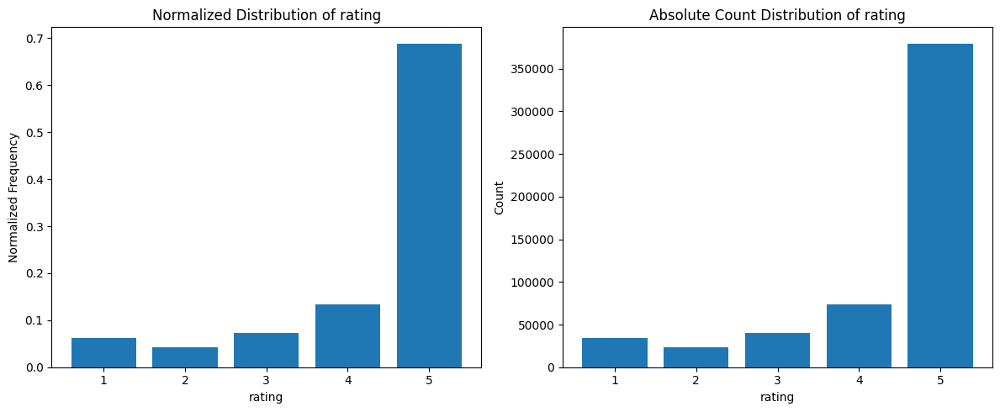

In [16]:
target = 'rating'
plot_target_bar(df, target)

In [17]:
n = 5
one_user = df.iloc[n].userName
df.iloc[n]

userName                                                Karli S.
verified                                                    True
itemName       Merrick Whole Earth Farms Adult Recipe Dry Dog...
description    ['Merrick Whole Earth Farms is a nutritious do...
image          ['https://images-na.ssl-images-amazon.com/imag...
brand                                                    Merrick
feature        ['Natural ingredients with added vitamins and ...
category                                            Pet_Supplies
price                                                        NaN
rating                                                       2.0
reviewTime                                            2018-01-01
summary                                                No Bueno.
reviewText     We accidentally purchased this instead of our ...
vote                                                           0
Name: 5, dtype: object

In [18]:
df[df['userName'] == one_user].T

,5,381430,528434
userName,Karli S.,Karli S.,Karli S.
verified,True,True,True
itemName,Merrick Whole Earth Farms Adult Recipe Dry Dog...,My AlphaPet Dog Poop Bags Refill Rolls - Large...,KONG Cat Tennis Balls with Bells
description,['Merrick Whole Earth Farms is a nutritious do...,['These poop bags by My Alphapet are convenien...,['KONG Cat Tennis Balls with Bells']
image,['https://images-na.ssl-images-amazon.com/imag...,['https://images-na.ssl-images-amazon.com/imag...,['https://images-na.ssl-images-amazon.com/imag...
brand,Merrick,My AlphaPet,KONG
feature,['Natural ingredients with added vitamins and ...,['Large enough for big dog waste the bags are ...,"['Interior bell creates enticing sound', ""Nona..."
category,Pet_Supplies,Pet_Supplies,Pet_Supplies
price,NaN,$28.99,$6.25
rating,2.0,5.0,5.0


In [19]:
itemName_n_ratings = df.groupby('itemName').size()
itemName_n_ratings.value_counts(normalize=True).sort_index()

1       0.386665
2       0.206506
3       0.103725
4       0.071223
5       0.041409
          ...   
667     0.000009
922     0.000009
965     0.000009
1140    0.000009
1642    0.000009
Length: 248, dtype: float64

In [20]:
item_n_ratings_threshold = 5
itemName_n_ratings.value_counts(normalize=True)[itemName_n_ratings.value_counts(normalize=True).sort_index().index<item_n_ratings_threshold].sum()

0.768120063480997

In [21]:
items_with_history = itemName_n_ratings[itemName_n_ratings>=item_n_ratings_threshold].index.tolist()
df = df[df.itemName.isin(items_with_history)]

In [22]:
userNames_n_ratings = df.groupby('userName').size()
userNames_n_ratings.value_counts(normalize=True).sort_index()

1        0.430667
2        0.198364
3        0.110677
4        0.072859
5        0.053436
           ...   
336      0.000009
386      0.000009
455      0.000009
1849     0.000009
25635    0.000009
Length: 180, dtype: float64

In [23]:
users_n_ratings_threshold = 6
userNames_n_ratings.value_counts(normalize=True)[userNames_n_ratings.value_counts(normalize=True).sort_index().index<users_n_ratings_threshold].sum()

0.866004059379807

In [24]:
users_with_history = userNames_n_ratings[userNames_n_ratings>=users_n_ratings_threshold].index.tolist()
df = df[df.userName.isin(users_with_history)]

In [25]:
df.shape, df[['userName', 'itemName']].nunique()

((210203, 14),
 userName    14722
 itemName    24718
 dtype: int64)

In [26]:
target

'rating'

In [27]:
test_size=0.1
equal_val_test_size=True
X_train, X_test, X_val, y_train, y_test, y_val = split_dataset(df, target_col=target, the_test_size=test_size, equal_val_test_size=equal_val_test_size)

train = pd.concat([X_train, y_train], axis=1)
val = pd.concat([X_val, y_val], axis=1)
test = pd.concat([X_test, y_test], axis=1)

split_dataset()
X_train shape:  (168162, 13) 79.9998097077587 % y_train mean: rating    4.385087
dtype: float64
X_val shape:  (21020, 13) 9.999857280819018 % y_val mean: rating    4.385062
dtype: float64
X_test shape:  (21021, 13) 10.000333011422292 % y_test mean: rating    4.385044
dtype: float64


In [28]:
train['userName'].nunique(), val['userName'].nunique(), test['userName'].nunique(), 

(14722, 9116, 9091)

In [29]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Set the split sizes for validation and test
val_size = 0.1
test_size = 0.1

# Group the data by user
grouped = df.groupby('userName')

# Split each group and store in a list
train_list, val_list, test_list = [], [], []
for name, group in grouped:
        user_train_val, user_test = train_test_split(group, test_size=test_size, random_state=42, shuffle=True)
        user_train, user_val = train_test_split(user_train_val, test_size=val_size/(1-test_size), random_state=42, shuffle=True)
    
        train_list.append(user_train)
        val_list.append(user_val)
        test_list.append(user_test)
        
# Concatenate all splits
train = pd.concat(train_list)
val = pd.concat(val_list)
test = pd.concat(test_list)

In [30]:
train['userName'].nunique(), val['userName'].nunique(), test['userName'].nunique(), 

(14722, 14722, 14722)

In [31]:
train.shape[0]/len(df), val.shape[0]/len(df), test.shape[0]/len(df)

(0.7534811586894573, 0.1211447981237185, 0.12537404318682416)

In [32]:
userNames_n_ratings = train.groupby('userName').size()
userNames_n_ratings.value_counts(normalize=True).sort_index()

4        0.260562
5        0.169950
6        0.118190
7        0.083888
8        0.151270
           ...   
268      0.000068
308      0.000068
363      0.000068
1479     0.000068
20507    0.000068
Length: 146, dtype: float64

In [33]:
train.groupby(['itemName']).size().value_counts(normalize=True)

2      0.189945
3      0.164558
1      0.142010
4      0.122928
5      0.082300
         ...   
73     0.000042
168    0.000042
223    0.000042
323    0.000042
85     0.000042
Length: 158, dtype: float64

<Axes: >

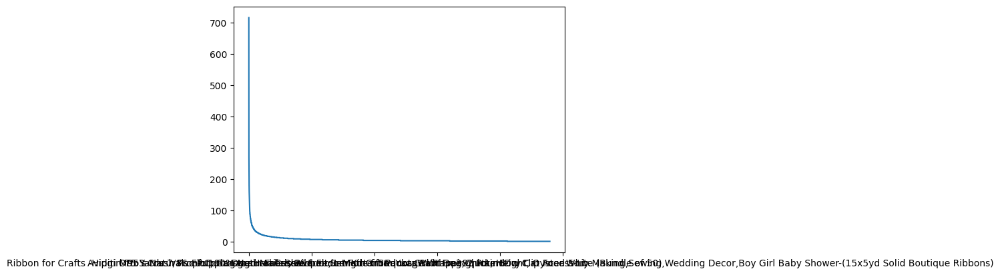

In [34]:
train['itemName'].value_counts().plot()

In [35]:
train

,userName,verified,itemName,description,image,brand,feature,category,price,rating,reviewTime,summary,reviewText,vote
299905,Boo,True,Pedigree Complete Nutrition Adult Dry Dog Food...,"[""PEDIGREE Adult Complete Nutrition Roasted Ch...",['https://images-na.ssl-images-amazon.com/imag...,Pedigree,['Contains One (1) 40 Lb. Bag Of Pedigree Comp...,Pet_Supplies,NaN,4.0,2018-04-05,Great price,She likes it!,0
304686,Boo,True,"Milk-Bone Marosnacks Dog Snacks - Small, 10-Ou...","[""Great for training. Fewer crumbs, cleaner sh...",['https://images-na.ssl-images-amazon.com/imag...,Milk-Bone,"['Contains 12 - 10 Oz Boxes', 'Great For Train...",Pet_Supplies,NaN,4.0,2018-04-07,She likes,This is one of few snacks she likes..,0
297588,Boo,True,Pedigree Adult Dry Dog Food - Grilled Steak &a...,"[""Give your dog the taste of succulent steak a...",['https://images-na.ssl-images-amazon.com/imag...,Pedigree,['Contains One (1) 17 Lb. Bag Of Pedigree Comp...,Pet_Supplies,$15.28,4.0,2018-04-05,Great price,She likes it!,0
299805,Boo,True,Purina ALPO Prime Cuts in Gravy Adult Wet Dog ...,"['', ""Dazzle your dog's taste buds with Purina...",['https://images-na.ssl-images-amazon.com/imag...,Purina ALPO Brand Dog Food,['Twelve (12) 13.2 Oz. Can - Purina Alpo Prime...,Pet_Supplies,$9.36,4.0,2018-04-05,Great price,She likes it,0
299854,Boo,True,Pedigree Complete Nutrition Adult Dry Dog Food...,"[""PEDIGREE Adult Complete Nutrition Roasted Ch...",['https://images-na.ssl-images-amazon.com/imag...,Pedigree,['Contains One (1) 40 Lb. Bag Of Pedigree Comp...,Pet_Supplies,NaN,4.0,2018-04-05,Great price,She likes it!,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
111073,~Susan Atherton,True,"Arm &amp; Hammer Super Scoop Clumping Litter, ...",['Super Scoop is formulated with ARM & HAMMER ...,['https://images-na.ssl-images-amazon.com/imag...,Arm & Hammer,['Great for fragrance sensitive cats and their...,Pet_Supplies,NaN,4.0,2018-02-06,I got a good batch.,I got a good batch. I agree with other commen...,0
111740,~Susan Atherton,True,"Arm &amp; Hammer Super Scoop Clumping Litter, ...",['An odor free home starts with ARM &amp; HAMM...,['https://images-na.ssl-images-amazon.com/imag...,Arm &amp; Hammer,['Great for fragrance sensitive cats and their...,Pet_Supplies,$30.99,4.0,2018-02-06,I got a good batch.,I got a good batch. I agree with other commen...,0
157666,~Susan Atherton,True,Grafix 4-1/2-Ounce Incredible White Mask Liqui...,['A high quality latex that assures an easily ...,[],Grafix,"['An easy to remove high quality latex', 'Incl...",Arts_Crafts_and_Sewing,$10.57,5.0,2018-02-20,"Very happy, you need to be throughtful about w...",It takes a little planning to make it work to ...,0
373135,~Susan Atherton,True,FurHaven Pet Cat Furniture | Tiger Tough Cat T...,"['Product DETAILS - 28"" L x 16"" W x 55"" H, Col...",['https://images-na.ssl-images-amazon.com/imag...,Furhaven Pet,"['Product DETAILS - 28"" L x 16"" W x 55"" H, Col...",Pet_Supplies,$62.99,2.0,2018-04-29,I'll let them tear it apart but won't buy anot...,"Bottom to top. Toy is in the way, I set it ou...",0


In [36]:
train.describe(include='all')

,userName,verified,itemName,description,image,brand,feature,category,price,rating,reviewTime,summary,reviewText,vote
count,158384,158384,158384,158384,158384,156817,158384,158384,138995,158384.000000,158384,158317,158263,158384.000000
unique,14722,2,23949,20656,21723,7805,18774,16,4080,NaN,275,71155,116419,NaN
top,Amazon Customer,True,Puppia Dog Harnesses,[],[],KONG,[],Pet_Supplies,$9.99,NaN,2018-04-02,Five Stars,good,NaN
freq,20507,149523,717,14909,11538,3316,30446,70007,2536,NaN,1335,42654,799,NaN
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.383063,NaN,NaN,NaN,0.114317
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.118128,NaN,NaN,NaN,1.716454
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,0.000000
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.000000,NaN,NaN,NaN,0.000000
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.000000,NaN,NaN,NaN,0.000000
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.000000,NaN,NaN,NaN,0.000000


### 1. Users

In [37]:
train.groupby(['userName']).size().describe()

count    14722.000000
mean        10.758321
std        169.977073
min          4.000000
25%          4.000000
50%          6.000000
75%          8.000000
max      20507.000000
dtype: float64

In [38]:
users_frequencies = get_col_frequencies(train, col_name='userName', sort_index=False)
users_frequencies

,counts,pct,cumsum_pct
Amazon Customer,20507,0.129476,0.129476
Kindle Customer,1479,0.009338,0.138815
Mike,363,0.002292,0.141106
John,308,0.001945,0.143051
Susan,268,0.001692,0.144743
...,...,...,...
Tantressa Vega,4,0.000025,0.999899
JetterSays...,4,0.000025,0.999924
JetRocket11,4,0.000025,0.999949
Tara Fox Hall,4,0.000025,0.999975


In [39]:
train[train.userName.isin(['Amazon Customer', 'Kindle Customer'])]['verified'].mean()

0.9710270171927591

In [40]:
train['verified'].mean()

0.9440536922921507

In [41]:
train = train[train['verified'] == True]
val = val[val['verified'] == True]
test = test[test['verified'] == True]
assert train['verified'].mean() == 1 

In [42]:
train = train.drop(columns='verified')
val = val.drop(columns='verified')
test = test.drop(columns='verified')
assert not 'verified' in train

In [43]:
users_frequencies = get_col_frequencies(train, col_name='userName', sort_index=False)
users_frequencies

,counts,pct,cumsum_pct
Amazon Customer,19928,0.133277,0.133277
Kindle Customer,1421,0.009504,0.142781
Mike,342,0.002287,0.145068
John,283,0.001893,0.146961
Susan,249,0.001665,0.148626
...,...,...,...
candace wunderlich,1,0.000007,0.999973
pete c,1,0.000007,0.999980
N. Beitler,1,0.000007,0.999987
Linda Brown,1,0.000007,0.999993


In [44]:
users_frequencies[users_frequencies.index.str.lower().str.contains('amazon|kindle')]

,counts,pct,cumsum_pct
Amazon Customer,19928,0.133277,0.133277
Kindle Customer,1421,0.009504,0.142781
Amazoncustomer,104,0.000696,0.214261
Amazonian,47,0.000314,0.298222
AmazonCustomer,46,0.000308,0.301626
...,...,...,...
Amazonian Drone,3,0.000020,0.992824
NancyAmazon Customer,3,0.000020,0.995894
Amazon_Consumer,2,0.000013,0.998214
SouthernAmazoner,1,0.000007,0.999438


In [45]:
assert train['userName'].isna().sum() == 0
assert val['userName'].isna().sum() == 0
assert test['userName'].isna().sum() == 0

In [46]:
train.itemName.describe(include='all')

count                   149523
unique                   23626
top       Puppia Dog Harnesses
freq                       699
Name: itemName, dtype: object

In [47]:
train.groupby('itemName').size().describe()

count    23626.000000
mean         6.328748
std         14.032777
min          1.000000
25%          2.000000
50%          3.000000
75%          6.000000
max        699.000000
dtype: float64

In [48]:
train.duplicated().sum()

13587

In [49]:
train = train.drop_duplicates()
val = val.drop_duplicates()
test = test.drop_duplicates()
assert train.duplicated().sum() == 0

In [50]:
probably_duplicate_ratings_col =['userName', 'description', 'image', 'brand', 'feature',
                                 'category', 'price', 'rating', 'reviewTime', 'summary', 'reviewText',
                                 'vote'] 
pd.concat([train, y_train], axis=1).duplicated(subset=probably_duplicate_ratings_col).sum()

59526

In [51]:
train = train.drop_duplicates(subset=probably_duplicate_ratings_col)
assert train.duplicated(subset=probably_duplicate_ratings_col).sum() == 0

val = val.drop_duplicates(subset=probably_duplicate_ratings_col)
test = test.drop_duplicates(subset=probably_duplicate_ratings_col)

In [52]:
train['itemName'].isna().sum()

0

In [53]:
train = train.dropna(subset='itemName')
assert train['itemName'].isna().sum() == 0

val = val.dropna(subset='itemName')
test = test.dropna(subset='itemName')

In [54]:
train.itemName.describe(include='all')

count                   135923
unique                   23625
top       Puppia Dog Harnesses
freq                       497
Name: itemName, dtype: object

In [55]:
col = 'itemName'
groupby_col = 'brand'
get_col_unique_counts_on_groupby_col(train, col, groupby_col, sort_index=True)

,itemName_brand_counts,itemName_brand_pct,itemName_brand_cumsum_pct
1,4573,0.590522,0.590522
2,1221,0.157670,0.748192
3,570,0.073605,0.821798
4,317,0.040935,0.862732
5,216,0.027893,0.890625
...,...,...,...
110,1,0.000129,0.999483
126,1,0.000129,0.999613
129,1,0.000129,0.999742
136,1,0.000129,0.999871


In [56]:
train['reviewText'][train['reviewText'].str.lower().str.contains('price').fillna(True)]

320440    My dog likes them.  Great price.  Package is d...
408726    My dog loves these.  A little overpriced for t...
516132    This review is for the 2018 model of this harn...
153005    Tastes good, like coffee, but I didn't notice ...
84196     I am a beginner quilter and bought a small pac...
                                ...                        
412519    The previous orthopedic pet bed we had was nic...
169120    If I didn't stock these in the office candy ja...
261561    So I've been using this for 5 months now and I...
160964    I'm new to quilting, and like most hobbies, ju...
332690    UPDATE:  BE CAREFUL KITTEN GOT THIS TURNED OVE...
Name: reviewText, Length: 9514, dtype: object

In [57]:
21511/len(train)

0.15825872001059424

In [58]:
train['item_id'] = train['brand'].fillna('NA') + "_" + train['itemName'] + "_" + train['price'].fillna('NA')
train = move_cols_to_first(train, ['userName', 'item_id'])

val['item_id'] = val['brand'].fillna('NA') + "_" + val['itemName'] + "_" + val['price'].fillna('NA')
val = move_cols_to_first(val, ['userName', 'item_id'])
test['item_id'] = test['brand'].fillna('NA') + "_" + test['itemName'] + "_" + test['price'].fillna('NA')
test = move_cols_to_first(test, ['userName', 'item_id'])

train

move_cols_to_first()
move_cols_to_first()
move_cols_to_first()


,userName,item_id,itemName,description,image,brand,feature,category,price,rating,reviewTime,summary,reviewText,vote
299905,Boo,Pedigree_Pedigree Complete Nutrition Adult Dry...,Pedigree Complete Nutrition Adult Dry Dog Food...,"[""PEDIGREE Adult Complete Nutrition Roasted Ch...",['https://images-na.ssl-images-amazon.com/imag...,Pedigree,['Contains One (1) 40 Lb. Bag Of Pedigree Comp...,Pet_Supplies,NaN,4.0,2018-04-05,Great price,She likes it!,0
304686,Boo,Milk-Bone_Milk-Bone Marosnacks Dog Snacks - Sm...,"Milk-Bone Marosnacks Dog Snacks - Small, 10-Ou...","[""Great for training. Fewer crumbs, cleaner sh...",['https://images-na.ssl-images-amazon.com/imag...,Milk-Bone,"['Contains 12 - 10 Oz Boxes', 'Great For Train...",Pet_Supplies,NaN,4.0,2018-04-07,She likes,This is one of few snacks she likes..,0
297588,Boo,Pedigree_Pedigree Adult Dry Dog Food - Grilled...,Pedigree Adult Dry Dog Food - Grilled Steak &a...,"[""Give your dog the taste of succulent steak a...",['https://images-na.ssl-images-amazon.com/imag...,Pedigree,['Contains One (1) 17 Lb. Bag Of Pedigree Comp...,Pet_Supplies,$15.28,4.0,2018-04-05,Great price,She likes it!,0
299805,Boo,Purina ALPO Brand Dog Food_Purina ALPO Prime C...,Purina ALPO Prime Cuts in Gravy Adult Wet Dog ...,"['', ""Dazzle your dog's taste buds with Purina...",['https://images-na.ssl-images-amazon.com/imag...,Purina ALPO Brand Dog Food,['Twelve (12) 13.2 Oz. Can - Purina Alpo Prime...,Pet_Supplies,$9.36,4.0,2018-04-05,Great price,She likes it,0
321930,Carol Ann,PETMAKER_PETMAKER Folding Plastic Pet Stairs D...,PETMAKER Folding Plastic Pet Stairs Durable In...,['The PETMAKER folding plastic pet stairs help...,['https://images-na.ssl-images-amazon.com/imag...,PETMAKER,['DURABLE AND EASY TO CLEAN -Made of tough and...,Pet_Supplies,$34.29,4.0,2018-04-12,Sturdy. Good cover on the steps,Sturdy. Good cover on the steps. Has to be br...,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
157142,~Susan Atherton,Grafix_Grafix 4-1/2-Ounce Incredible White Mas...,Grafix 4-1/2-Ounce Incredible White Mask Liqui...,['A high quality latex that assures an easily ...,[],Grafix,"['An easy to remove high quality latex', 'Incl...",Arts_Crafts_and_Sewing,$10.57,5.0,2018-02-20,"Very happy, you need to be throughtful about w...",It takes a little planning to make it work to ...,0
430671,~Susan Atherton,"Meyenberg_Meyenberg Goat Milk - Powdered, 12-O...","Meyenberg Goat Milk - Powdered, 12-Ounce",['Powdered Goat Milk by Meyenberg Goat Milk Pr...,['https://images-na.ssl-images-amazon.com/imag...,Meyenberg,"['<span class=""a-size-base a-color-secondary"">...",Grocery_and_Gourmet_Food,$9.34,5.0,2018-05-21,Good for abandon kitten!,I used it to bring an abandon barn kitten to h...,0
111073,~Susan Atherton,Arm & Hammer_Arm &amp; Hammer Super Scoop Clum...,"Arm &amp; Hammer Super Scoop Clumping Litter, ...",['Super Scoop is formulated with ARM & HAMMER ...,['https://images-na.ssl-images-amazon.com/imag...,Arm & Hammer,['Great for fragrance sensitive cats and their...,Pet_Supplies,NaN,4.0,2018-02-06,I got a good batch.,I got a good batch. I agree with other commen...,0
373135,~Susan Atherton,Furhaven Pet_FurHaven Pet Cat Furniture | Tige...,FurHaven Pet Cat Furniture | Tiger Tough Cat T...,"['Product DETAILS - 28"" L x 16"" W x 55"" H, Col...",['https://images-na.ssl-images-amazon.com/imag...,Furhaven Pet,"['Product DETAILS - 28"" L x 16"" W x 55"" H, Col...",Pet_Supplies,$62.99,2.0,2018-04-29,I'll let them tear it apart but won't buy anot...,"Bottom to top. Toy is in the way, I set it ou...",0


In [59]:
train.item_id.describe(include='all')

count                                                135923
unique                                                24174
top       KIND_KIND Bars, Caramel Almond and Sea Salt, G...
freq                                                    359
Name: item_id, dtype: object

In [60]:
assert train.item_id.isna().sum() == 0
assert train.item_id.str.contains('NA_NA').sum() == 0

In [61]:
train['description'].describe(include='all')

count     135923
unique     20358
top           []
freq       14333
Name: description, dtype: object

In [62]:
import ast

train['description_n_sentences'] = train['description'].fillna('[]').apply(lambda x: len(ast.literal_eval(x)))

val['description_n_sentences'] = val['description'].fillna('[]').apply(lambda x: len(ast.literal_eval(x)))
test['description_n_sentences'] = test['description'].fillna('[]').apply(lambda x: len(ast.literal_eval(x)))

get_col_frequencies(train, 'description_n_sentences')

,counts,pct,cumsum_pct
0,14333,0.105449,0.105449
1,75615,0.556308,0.661757
2,12279,0.090338,0.752095
3,9447,0.069503,0.821598
4,5991,0.044076,0.865674
5,4347,0.031981,0.897655
6,4663,0.034306,0.931961
7,2079,0.015295,0.947257
8,1172,0.008623,0.955879
9,1135,0.008350,0.964230


In [63]:
train['description'].isna().sum()

0

In [64]:
train['description'] = train['description'].fillna("NA")
val['description'] = val['description'].fillna("NA")
test['description'] = test['description'].fillna("NA")
assert train['description'].isna().sum() == 0

In [65]:
train['description_len'] = train['description'].str.len()

val['description_len'] = val['description'].str.len()
test['description_len'] = test['description'].str.len()

get_col_frequencies(train, 'description_len')

,counts,pct,cumsum_pct
2,14333,0.105449,0.105449
5,21,0.000154,0.105604
6,5,0.000037,0.105641
7,19,0.000140,0.105780
8,6,0.000044,0.105825
...,...,...,...
11960,2,0.000015,0.999816
12126,7,0.000051,0.999868
16044,5,0.000037,0.999904
21883,12,0.000088,0.999993


In [66]:
train[[col for col in train if 'description' in col]].describe(include='all')

,description,description_n_sentences,description_len
count,135923,135923.00000,135923.000000
unique,20358,NaN,NaN
top,[],NaN,NaN
freq,14333,NaN,NaN
mean,NaN,2.28124,785.463365
std,NaN,3.36810,915.835192
min,NaN,0.00000,2.000000
25%,NaN,1.00000,244.000000
50%,NaN,1.00000,542.000000
75%,NaN,2.00000,1045.000000


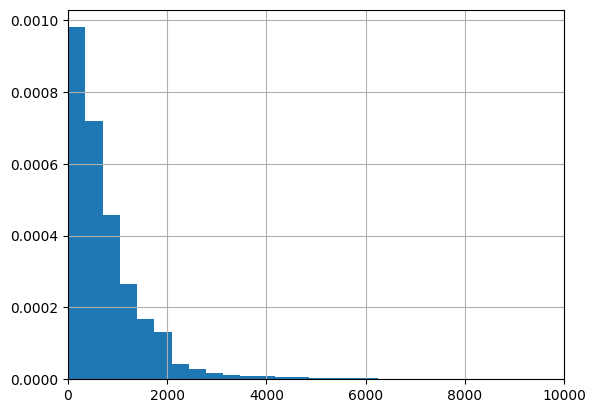

In [67]:
train['description_len'].hist(bins=100, density=True)
plt.xlim(0, 10000)
plt.show()

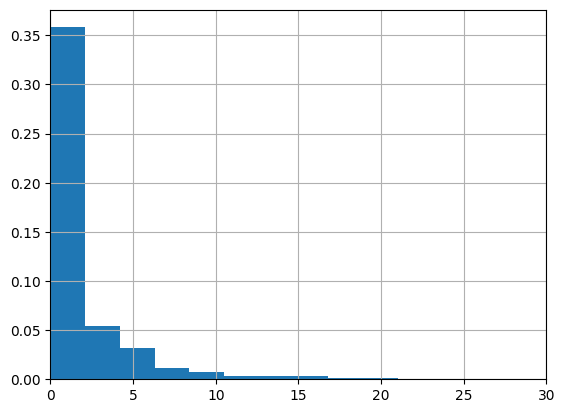

In [68]:
train['description_n_sentences'].hist(bins=100, density=True)
plt.xlim(0, 30)
plt.show()

In [69]:
train['image']

299905    ['https://images-na.ssl-images-amazon.com/imag...
304686    ['https://images-na.ssl-images-amazon.com/imag...
297588    ['https://images-na.ssl-images-amazon.com/imag...
299805    ['https://images-na.ssl-images-amazon.com/imag...
321930    ['https://images-na.ssl-images-amazon.com/imag...
                                ...                        
157142                                                   []
430671    ['https://images-na.ssl-images-amazon.com/imag...
111073    ['https://images-na.ssl-images-amazon.com/imag...
373135    ['https://images-na.ssl-images-amazon.com/imag...
332690    ['https://images-na.ssl-images-amazon.com/imag...
Name: image, Length: 135923, dtype: object

In [70]:
train['n_images'] = train['image'].apply(lambda x: len(ast.literal_eval(x)))

val['n_images'] = val['image'].apply(lambda x: len(ast.literal_eval(x)))
test['n_images'] = test['image'].apply(lambda x: len(ast.literal_eval(x)))

get_col_frequencies(train, col_name='n_images')

,counts,pct,cumsum_pct
0,10238,0.075322,0.075322
1,10419,0.076654,0.151976
2,10368,0.076278,0.228254
3,11380,0.083724,0.311978
4,13367,0.098342,0.410321
5,26451,0.194603,0.604923
6,33200,0.244256,0.849179
7,4685,0.034468,0.883647
8,2860,0.021041,0.904689
9,2470,0.018172,0.922861


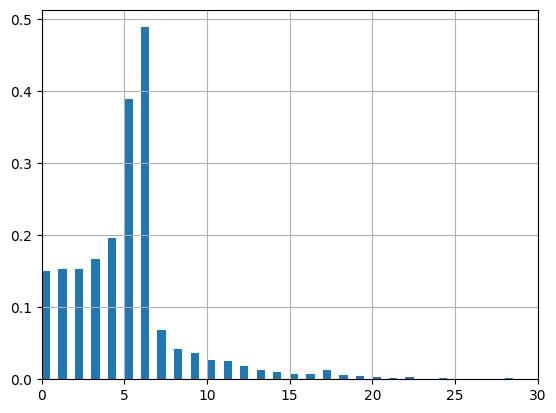

In [71]:
train['n_images'].hist(bins=100, density=True)
plt.xlim(0, 30)
plt.show()

In [72]:
assert train['image'].isna().sum() == 0

In [73]:
train['brand'].describe()

count     135205
unique      7744
top         KONG
freq        2697
Name: brand, dtype: object

In [74]:
get_col_frequencies(train, col_name='brand', sort_index=False)

,counts,pct,cumsum_pct
KONG,2697,0.019842,0.019842
AmazonBasics,1581,0.011632,0.031474
KIND,1489,0.010955,0.042428
Nylabone,1282,0.009432,0.051860
PetSafe,1268,0.009329,0.061189
...,...,...,...
Releaf Leaf Scoops,1,0.000007,0.999971
HTKJ,1,0.000007,0.999978
Organic Muscle,1,0.000007,0.999985
Zuluf,1,0.000007,0.999993


In [75]:
get_col_unique_counts_on_groupby_col(train, col='item_id', groupby_col='brand')

,item_id_brand_counts,item_id_brand_pct,item_id_brand_cumsum_pct
1,4532,0.585227,0.585227
2,1235,0.159478,0.744706
3,575,0.074251,0.818957
4,314,0.040548,0.859504
5,220,0.028409,0.887913
...,...,...,...
110,1,0.000129,0.999483
126,1,0.000129,0.999613
129,1,0.000129,0.999742
150,1,0.000129,0.999871


In [76]:
train['brand'].isna().sum()

718

In [77]:
1560/len(train)

0.011477086291503277

In [78]:
train['brand_isna'] = train['brand'].isna()*1

val['brand_isna'] = val['brand'].isna()*1
test['brand_isna'] = test['brand'].isna()*1

In [79]:
train['brand_isna'].describe()

count    135923.000000
mean          0.005282
std           0.072488
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max           1.000000
Name: brand_isna, dtype: float64

In [80]:
train['brand'] = train['brand'].fillna('NA')

val['brand'] = val['brand'].fillna('NA')
test['brand'] = test['brand'].fillna('NA')

assert train['brand'].isna().sum() == 0

In [81]:
train['feature']

299905    ['Contains One (1) 40 Lb. Bag Of Pedigree Comp...
304686    ['Contains 12 - 10 Oz Boxes', 'Great For Train...
297588    ['Contains One (1) 17 Lb. Bag Of Pedigree Comp...
299805    ['Twelve (12) 13.2 Oz. Can - Purina Alpo Prime...
321930    ['DURABLE AND EASY TO CLEAN -Made of tough and...
                                ...                        
157142    ['An easy to remove high quality latex', 'Incl...
430671    ['<span class="a-size-base a-color-secondary">...
111073    ['Great for fragrance sensitive cats and their...
373135    ['Product DETAILS - 28" L x 16" W x 55" H, Col...
332690    ['Enclosed cube pet bed', 'Removable reversibl...
Name: feature, Length: 135923, dtype: object

In [82]:
assert train['feature'].isna().sum() == 0

#### # Create n_features - some feature are made of list of different features 

In [83]:
train['n_features'] = train['feature'].apply(lambda x: len(ast.literal_eval(x)))

val['n_features'] = val['feature'].apply(lambda x: len(ast.literal_eval(x)))
test['n_features'] = test['feature'].apply(lambda x: len(ast.literal_eval(x)))

get_col_frequencies(train, col_name='n_features')

,counts,pct,cumsum_pct
0,25657,0.188761,0.188761
1,1278,0.009402,0.198164
2,1115,0.008203,0.206367
3,8593,0.063220,0.269586
4,9845,0.072431,0.342017
5,47089,0.346439,0.688456
6,7031,0.051728,0.740184
7,4359,0.032070,0.772253
8,4629,0.034056,0.806309
9,4718,0.034711,0.841020


In [84]:
#### # Create feature_len
train['feature_len'] = train['feature'].str.len()

val['feature_len'] = val['feature'].str.len()
test['feature_len'] = test['feature'].str.len()

get_col_frequencies(train, col_name='feature_len')

,counts,pct,cumsum_pct
2,25657,0.188761,0.188761
5,3,0.000022,0.188783
6,4,0.000029,0.188813
7,17,0.000125,0.188938
10,10,0.000074,0.189011
...,...,...,...
18605,6,0.000044,0.999816
18625,6,0.000044,0.999860
18661,10,0.000074,0.999934
18795,7,0.000051,0.999985


In [85]:
train['n_features'].describe()

count    135923.000000
mean          5.520273
std           4.711021
min           0.000000
25%           3.000000
50%           5.000000
75%           7.000000
max          61.000000
Name: n_features, dtype: float64

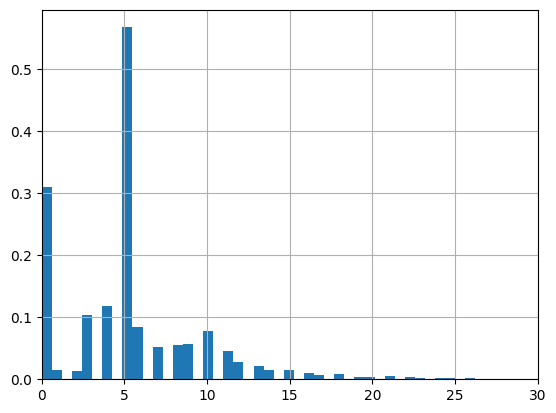

In [86]:
train['n_features'].hist(bins=100, density=True)
plt.xlim(0, 30)
plt.show()

In [87]:
get_col_frequencies(train, col_name='category', sort_index=False)

,counts,pct,cumsum_pct
Pet_Supplies,60005,0.441463,0.441463
Grocery_and_Gourmet_Food,23647,0.173973,0.615437
Office_Products,15052,0.110739,0.726176
Patio_Lawn_and_Garden,12134,0.089271,0.815447
Arts_Crafts_and_Sewing,6660,0.048998,0.864445
Cell_Phones_and_Accessories,6343,0.046666,0.911111
Prime_Pantry,5846,0.043010,0.954121
Musical_Instruments,3263,0.024006,0.978127
Video_Games,1448,0.010653,0.988780
Industrial_and_Scientific,869,0.006393,0.995174


In [88]:
small_cats_to_big_cats_mapper = {'Appliances':'Industrial_and_Scientific', 'Industrial_and_Scientific':'Office_Products','AMAZON_FASHION':'Arts_Crafts_and_Sewing', 'Luxury_Beauty':'Arts_Crafts_and_Sewing', 'All_Beauty':'Arts_Crafts_and_Sewing', 'Software':'Video_Games' ,'Digital_Music':'Musical_Instruments'}

train['category'] = train['category'].map(small_cats_to_big_cats_mapper).fillna(train['category'])
train['category'] = train['category'].map(small_cats_to_big_cats_mapper).fillna(train['category'])

val['category'] = val['category'].map(small_cats_to_big_cats_mapper).fillna(val['category'])
test['category'] = test['category'].map(small_cats_to_big_cats_mapper).fillna(test['category'])

In [89]:
get_col_frequencies(train, col_name='category', sort_index=False)

,counts,pct,cumsum_pct
Pet_Supplies,60005,0.441463,0.441463
Grocery_and_Gourmet_Food,23647,0.173973,0.615437
Office_Products,15922,0.117140,0.732577
Patio_Lawn_and_Garden,12134,0.089271,0.821848
Arts_Crafts_and_Sewing,7276,0.053530,0.875378
Cell_Phones_and_Accessories,6343,0.046666,0.922044
Prime_Pantry,5846,0.043010,0.965054
Musical_Instruments,3266,0.024028,0.989082
Video_Games,1484,0.010918,1.000000


In [90]:
assert sum(get_col_frequencies(train, col_name='category', sort_index=False)['pct']<0.01) == 0

In [91]:
train['category'].nunique()

9

In [92]:
train = pd.concat([train, pd.get_dummies(train['category'], prefix='category', drop_first=True)], axis=1)

val = pd.concat([val, pd.get_dummies(val['category'], prefix='category', drop_first=True)], axis=1)
test = pd.concat([test, pd.get_dummies(test['category'], prefix='category', drop_first=True)], axis=1)

In [93]:
train.shape

(135923, 28)

In [94]:
train['price']

299905       NaN
304686       NaN
297588    $15.28
299805     $9.36
321930    $34.29
           ...  
157142    $10.57
430671     $9.34
111073       NaN
373135    $62.99
332690    $16.12
Name: price, Length: 135923, dtype: object

In [95]:
train['price'].dtypes

dtype('O')

In [96]:
train['price'] = train['price'].str.replace("$", "")
train['price'] = pd.to_numeric(train['price'], errors='coerce').astype(float)

val['price'] = val['price'].str.replace("$", "")
val['price'] = pd.to_numeric(val['price'], errors='coerce').astype(float)
test['price'] = test['price'].str.replace("$", "")
test['price'] = pd.to_numeric(test['price'], errors='coerce').astype(float)

C:\Users\saksh\AppData\Local\Temp\ipykernel_22664\3262855736.py:1: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  train['price'] = train['price'].str.replace("$", "")
C:\Users\saksh\AppData\Local\Temp\ipykernel_22664\3262855736.py:4: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  val['price'] = val['price'].str.replace("$", "")
C:\Users\saksh\AppData\Local\Temp\ipykernel_22664\3262855736.py:6: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  test['price'] = test['price'].str.replace("$", "")


In [97]:
train['price'].describe()

count    115999.000000
mean         18.360349
std          25.159338
min           0.740000
25%           7.490000
50%          12.580000
75%          20.000000
max         999.990000
Name: price, dtype: float64

In [98]:
train['price'].isna().sum()/len(train)

0.1465829918409688

In [99]:
train['price_isna'] = train['price'].isna()*1

val['price_isna'] = val['price'].isna()*1
test['price_isna'] = test['price'].isna()*1

In [100]:
train['brand_itemName'] = train['brand'] + "_" + train['itemName']

val['brand_itemName'] = val['brand'] + "_" + val['itemName']
test['brand_itemName'] = test['brand'] + "_" + test['itemName']

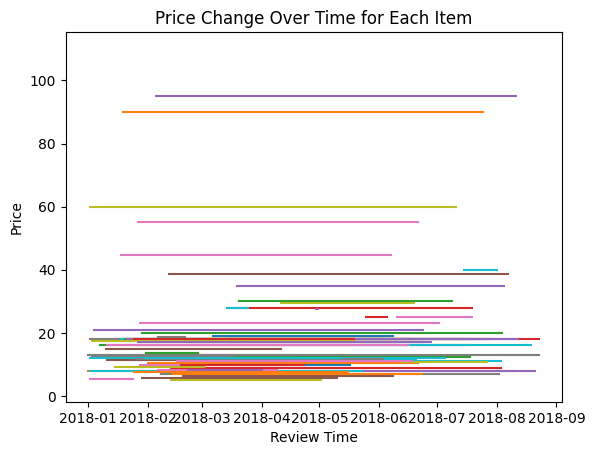

In [101]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming train has columns 'item_id', 'price', and 'reviewTime' where 'reviewTime' is a date

# Convert 'reviewTime' to datetime
train['reviewTime'] = pd.to_datetime(train['reviewTime'])

# Filter out rows where 'price' is missing
filtered_train = train.dropna(subset=['price'])

# Group by 'item_id' and 'reviewTime', then calculate the mean price
grouped_train = filtered_train.groupby(['brand_itemName', 'reviewTime'])['price'].mean().reset_index()

# Plotting
for item in grouped_train['brand_itemName'].unique()[:100]:
    item_train = grouped_train[grouped_train['brand_itemName'] == item]
    plt.plot(item_train['reviewTime'], item_train['price'], label=item)

plt.xlabel('Review Time')
plt.ylabel('Price')
plt.title('Price Change Over Time for Each Item')
plt.show()

In [102]:
import pandas as pd

# Calculate the average price for each item
average_prices_dict = train.dropna(subset='price').groupby('brand_itemName')['price'].mean().to_dict()

# Fill missing prices using map and fillna
train['price'] = train['price'].fillna(train['brand_itemName'].map(average_prices_dict))
val['price'] = val['price'].fillna(val['brand_itemName'].map(average_prices_dict))
test['price'] = test['price'].fillna(test['brand_itemName'].map(average_prices_dict))

In [103]:
train['price'].isna().sum()/len(train)

0.14106516189313067

In [104]:
train_group_cat_brand_price = train.groupby(['category', 'brand'])['price'].agg(['mean', 'std'])
train_group_cat_brand_price

mean       std
category               brand                                      
Arts_Crafts_and_Sewing 3M                          5.945  1.013287
                       ABEST                       5.990  0.000000
                       ADVANTUS CORPORATION        8.090  0.000000
                       AGPTEK                     24.365  0.517549
                       AIDOX                      10.430  0.000000
...                                                  ...       ...
Video_Games            by\n    \n    Xseed           NaN       NaN
                       by\n    \n    Zettaguard      NaN       NaN
                       by\n    \n    dreamGEAR       NaN       NaN
                       by\n    \n    eBoot           NaN       NaN
                       by\n    \n    eXtremeRate     NaN       NaN

[8257 rows x 2 columns]

In [105]:
train_group_cat_brand_price['mean'].isna().sum()

811

In [106]:
category_price_means = train.groupby(['category']).price.mean().to_dict()

# Extract category level from the multi-index of train_group_cat_brand_price
categories = train_group_cat_brand_price.index.get_level_values('category')

# Map the category means to fill missing mean prices
train_group_cat_brand_price['mean'] = train_group_cat_brand_price['mean'].fillna(pd.Series(categories, index=train_group_cat_brand_price.index).map(category_price_means))

In [107]:
assert train_group_cat_brand_price['mean'].isna().sum() == 0

In [108]:
train_group_cat_brand_price['CV'] = train_group_cat_brand_price['mean'] / train_group_cat_brand_price['std']
train_group_cat_brand_price

mean       std  \
category               brand                                            
Arts_Crafts_and_Sewing 3M                          5.945000  1.013287   
                       ABEST                       5.990000  0.000000   
                       ADVANTUS CORPORATION        8.090000  0.000000   
                       AGPTEK                     24.365000  0.517549   
                       AIDOX                      10.430000  0.000000   
...                                                     ...       ...   
Video_Games            by\n    \n    Xseed        20.252532       NaN   
                       by\n    \n    Zettaguard   20.252532       NaN   
                       by\n    \n    dreamGEAR    20.252532       NaN   
                       by\n    \n    eBoot        20.252532       NaN   
                       by\n    \n    eXtremeRate  20.252532       NaN   

                                                         CV  
category               brand                                 
Arts_Crafts_and_Sewing 3M                          5.867046  
                       ABEST                            inf  
                       ADVANTUS CORPORATION             inf  
                       AGPTEK                     47.077653  
                       AIDOX                            inf  
...                                                     ...  
Video_Games            by\n    \n    Xseed              NaN  
                       by\n    \n    Zettaguard         NaN  
                       by\n    \n    dreamGEAR          NaN  
                       by\n    \n    eBoot              NaN  
                       by\n    \n    eXtremeRate        NaN  

[8257 rows x 3 columns]

In [109]:
train_group_cat_brand_price['CV'].describe().round(2)

C:\Users\saksh\AppData\Roaming\Python\Python312\site-packages\numpy\lib\function_base.py:4655: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)


count    6424.00
mean         inf
std          NaN
min         0.26
25%         3.89
50%          NaN
75%          NaN
max          inf
Name: CV, dtype: float64

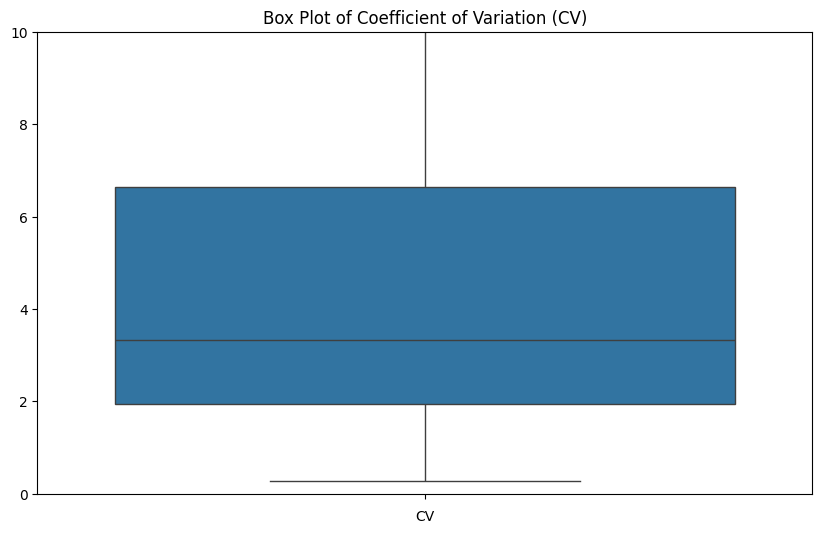

In [110]:
import numpy as np


cv_values = train_group_cat_brand_price['CV']
# Replace inf values with NaN and then drop them
cv_values = np.array(cv_values)  # Ensure cv_values is a NumPy array
cv_values[np.isinf(cv_values)] = np.nan
cv_values_cleaned = cv_values[~np.isnan(cv_values)]

plt.figure(figsize=(10, 6))
sns.boxplot(cv_values)
plt.title('Box Plot of Coefficient of Variation (CV)')
plt.xlabel('CV')
plt.ylim(0, 10)
plt.show()

In [ ]:
mean_price_dict = train_group_cat_brand_price['mean'].to_dict()

train['category_brand'] = pd.MultiIndex.from_frame(train[['category', 'brand']])

val['category_brand'] = pd.MultiIndex.from_frame(val[['category', 'brand']])
test['category_brand'] = pd.MultiIndex.from_frame(test[['category', 'brand']])

train['price'] = train['price'].fillna(train['category_brand'].map(mean_price_dict))

val['price'] = val['price'].fillna(val['category_brand'].map(mean_price_dict))
test['price'] = test['price'].fillna(test['category_brand'].map(mean_price_dict))

train.drop(['category_brand','brand_itemName'], axis=1, inplace=True, errors='ignore')

val.drop(['category_brand','brand_itemName'], axis=1, inplace=True, errors='ignore')
test.drop(['category_brand','brand_itemName'], axis=1, inplace=True, errors='ignore')

In [112]:
assert train['price'].isna().sum()/len(train) == 0

In [113]:
val['price'].isna().sum()/len(val)

0.0010910159036549034

In [114]:
val['price'] = val['price'].fillna(val['category'].map(category_price_means))
test['price'] = test['price'].fillna(test['category'].map(category_price_means))
assert val['price'].isna().sum()/len(val) == 0
assert test['price'].isna().sum()/len(test) == 0

In [115]:
brand_price_group_mapper = pd.qcut(train.groupby('brand')['price'].mean(), 10).rename('brand_price_group').to_dict()
train['brand_price_group'] = train['brand'].map(brand_price_group_mapper)

val['brand_price_group'] = val['brand'].map(brand_price_group_mapper)
test['brand_price_group'] = test['brand'].map(brand_price_group_mapper)

train['brand_price_group']

299905    (12.538, 14.98]
304686    (12.538, 14.98]
297588    (12.538, 14.98]
299805      (5.99, 8.154]
321930    (23.99, 34.872]
               ...       
157142     (14.98, 18.19]
430671      (8.154, 9.99]
111073    (12.538, 14.98]
373135    (34.872, 999.0]
332690    (23.99, 34.872]
Name: brand_price_group, Length: 135923, dtype: interval

In [116]:
assert train['brand_price_group'].isna().sum() == 0

In [117]:
val['brand_price_group'].isna().sum(), test['brand_price_group'].isna().sum()

(166, 206)

In [118]:
train_brand_price_mode = train['brand_price_group'].mode()[0]
train_brand_price_mode

Interval(14.98, 18.19, closed='right')

In [119]:
val['brand_price_group'] = val['brand_price_group'].fillna(train_brand_price_mode)
test['brand_price_group'] = test['brand_price_group'].fillna(train_brand_price_mode)

assert val['brand_price_group'].isna().sum() == 0
assert test['brand_price_group'].isna().sum() == 0

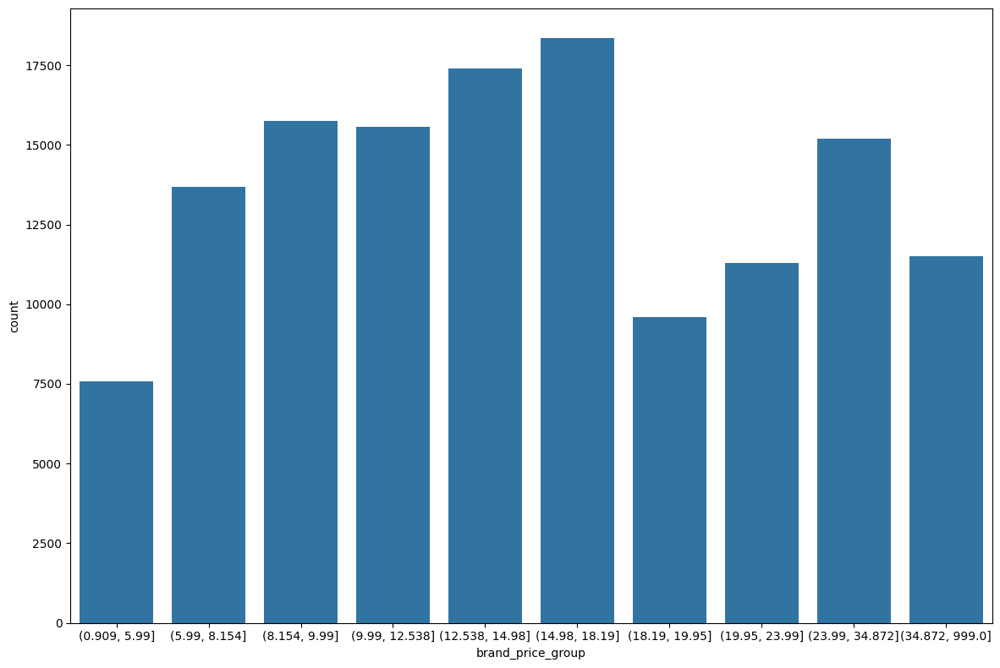

In [120]:
plt.figure(figsize=(12,8))
sns.countplot(x='brand_price_group', data=train.sort_values(by='brand_price_group'))

plt.tight_layout()

In [121]:
train = pd.concat([train, pd.get_dummies(train['brand_price_group'], prefix='brand_price', drop_first=True)], axis=1)

val = pd.concat([val, pd.get_dummies(val['brand_price_group'], prefix='brand_price', drop_first=True)], axis=1)
test = pd.concat([test, pd.get_dummies(test['brand_price_group'], prefix='brand_price', drop_first=True)], axis=1)

In [122]:
train

,userName,item_id,itemName,description,image,brand,feature,category,price,rating,reviewTime,summary,reviewText,vote,description_n_sentences,description_len,n_images,brand_isna,n_features,feature_len,category_Cell_Phones_and_Accessories,category_Grocery_and_Gourmet_Food,category_Musical_Instruments,category_Office_Products,category_Patio_Lawn_and_Garden,category_Pet_Supplies,category_Prime_Pantry,category_Video_Games,price_isna,brand_price_group,"brand_price_(5.99, 8.154]","brand_price_(8.154, 9.99]","brand_price_(9.99, 12.538]","brand_price_(12.538, 14.98]","brand_price_(14.98, 18.19]","brand_price_(18.19, 19.95]","brand_price_(19.95, 23.99]","brand_price_(23.99, 34.872]","brand_price_(34.872, 999.0]"
299905,Boo,Pedigree_Pedigree Complete Nutrition Adult Dry...,Pedigree Complete Nutrition Adult Dry Dog Food...,"[""PEDIGREE Adult Complete Nutrition Roasted Ch...",['https://images-na.ssl-images-amazon.com/imag...,Pedigree,['Contains One (1) 40 Lb. Bag Of Pedigree Comp...,Pet_Supplies,14.753769,4.0,2018-04-05,Great price,She likes it!,0,1,765,5,0,5,651,0,0,0,0,0,1,0,0,1,"(12.538, 14.98]",0,0,0,1,0,0,0,0,0
304686,Boo,Milk-Bone_Milk-Bone Marosnacks Dog Snacks - Sm...,"Milk-Bone Marosnacks Dog Snacks - Small, 10-Ou...","[""Great for training. Fewer crumbs, cleaner sh...",['https://images-na.ssl-images-amazon.com/imag...,Milk-Bone,"['Contains 12 - 10 Oz Boxes', 'Great For Train...",Pet_Supplies,12.790205,4.0,2018-04-07,She likes,This is one of few snacks she likes..,0,3,424,2,0,4,110,0,0,0,0,0,1,0,0,1,"(12.538, 14.98]",0,0,0,1,0,0,0,0,0
297588,Boo,Pedigree_Pedigree Adult Dry Dog Food - Grilled...,Pedigree Adult Dry Dog Food - Grilled Steak &a...,"[""Give your dog the taste of succulent steak a...",['https://images-na.ssl-images-amazon.com/imag...,Pedigree,['Contains One (1) 17 Lb. Bag Of Pedigree Comp...,Pet_Supplies,15.280000,4.0,2018-04-05,Great price,She likes it!,0,1,881,5,0,5,649,0,0,0,0,0,1,0,0,0,"(12.538, 14.98]",0,0,0,1,0,0,0,0,0
299805,Boo,Purina ALPO Brand Dog Food_Purina ALPO Prime C...,Purina ALPO Prime Cuts in Gravy Adult Wet Dog ...,"['', ""Dazzle your dog's taste buds with Purina...",['https://images-na.ssl-images-amazon.com/imag...,Purina ALPO Brand Dog Food,['Twelve (12) 13.2 Oz. Can - Purina Alpo Prime...,Pet_Supplies,9.360000,4.0,2018-04-05,Great price,She likes it,0,5,1168,5,0,5,284,0,0,0,0,0,1,0,0,0,"(5.99, 8.154]",1,0,0,0,0,0,0,0,0
321930,Carol Ann,PETMAKER_PETMAKER Folding Plastic Pet Stairs D...,PETMAKER Folding Plastic Pet Stairs Durable In...,['The PETMAKER folding plastic pet stairs help...,['https://images-na.ssl-images-amazon.com/imag...,PETMAKER,['DURABLE AND EASY TO CLEAN -Made of tough and...,Pet_Supplies,34.290000,4.0,2018-04-12,Sturdy. Good cover on the steps,Sturdy. Good cover on the steps. Has to be br...,0,1,774,3,0,5,1315,0,0,0,0,0,1,0,0,0,"(23.99, 34.872]",0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
157142,~Susan Atherton,Grafix_Grafix 4-1/2-Ounce Incredible White Mas...,Grafix 4-1/2-Ounce Incredible White Mask Liqui...,['A high quality latex that assures an easily ...,[],Grafix,"['An easy to remove high quality latex', 'Incl...",Arts_Crafts_and_Sewing,10.570000,5.0,2018-02-20,"Very happy, you need to be throughtful about w...",It takes a little planning to make it work to ...,0,1,286,0,0,3,100,0,0,0,0,0,0,0,0,0,"(14.98, 18.19]",0,0,0,0,1,0,0,0,0
430671,~Susan Atherton,"Meyenberg_Meyenberg Goat Milk - Powdered, 12-O...","Meyenberg Goat Milk - Powdered, 12-Ounce",['Powdered Goat Milk by Meyenberg Goat Milk Pr...,['https://images-na.ssl-images-amazon.com/imag...,Meyenberg,"['<span class=""a-size-base a-color-secondary"">...",Grocery_and_Gourmet_Food,9.340000,5.0,2018-05-21,Good for abandon kitten!,I used it to bring an abandon barn kitten to h...,0,6,1861,5,0,6,874,0,1,0,0,0,0,0,0,0,"(8.154, 9.99]",0,1,0,0,0,0,0,0,0
111073,~Susan Atherton,Arm & Hammer_Arm &amp; Hamm

In [123]:
train['reviewTime'] = pd.to_datetime(train['reviewTime'])

val['reviewTime'] = pd.to_datetime(val['reviewTime'])
test['reviewTime'] = pd.to_datetime(test['reviewTime'])

In [124]:
train['reviewTime'].describe()

C:\Users\saksh\AppData\Local\Temp\ipykernel_22664\1408518729.py:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  train['reviewTime'].describe()


count                  135923
unique                    275
top       2018-04-02 00:00:00
freq                     1142
first     2018-01-01 00:00:00
last      2018-10-02 00:00:00
Name: reviewTime, dtype: object

In [125]:
print(train['reviewTime'].min(), train['reviewTime'].max(),

val['reviewTime'].min(), val['reviewTime'].max(),
test['reviewTime'].min(), test['reviewTime'].max())

2018-01-01 00:00:00 2018-10-02 00:00:00 2018-01-01 00:00:00 2018-10-02 00:00:00 2018-01-01 00:00:00 2018-09-26 00:00:00


In [126]:
train['summary']

299905                                          Great price
304686                                            She likes
297588                                          Great price
299805                                          Great price
321930                      Sturdy. Good cover on the steps
                                ...                        
157142    Very happy, you need to be throughtful about w...
430671                             Good for abandon kitten!
111073                                  I got a good batch.
373135    I'll let them tear it apart but won't buy anot...
332690                         UPDATE:  COULD BE DANGEROUS.
Name: summary, Length: 135923, dtype: object

In [127]:
train['summary'].isna().sum()

61

In [128]:
train['summary_isna'] = train['summary'].isna()*1

val['summary_isna'] = val['summary'].isna()*1
test['summary_isna'] = test['summary'].isna()*1

In [129]:
train['summary'] = train['summary'].fillna("")

val['summary'] = val['summary'].fillna("")
test['summary'] = test['summary'].fillna("")
assert train['summary'].isna().sum() == 0

In [130]:
train['summary_len'] = train['summary'].str.len()

val['summary_len'] = val['summary'].str.len()
test['summary_len'] = test['summary'].str.len()

In [131]:
train['summary_n_words'] = train['summary'].str.split().str.len()

val['summary_n_words'] = val['summary'].str.split().str.len()
test['summary_n_words'] = test['summary'].str.split().str.len()

In [132]:
train[[col for col in train if 'summary' in col]].describe()

,summary_isna,summary_len,summary_n_words
count,135923.000000,135923.000000,135923.000000
mean,0.000449,22.317930,4.261236
std,0.021180,19.205593,3.745800
min,0.000000,0.000000,0.000000
25%,0.000000,10.000000,2.000000
50%,0.000000,12.000000,2.000000
75%,0.000000,29.000000,5.000000
max,1.000000,337.000000,65.000000


In [133]:
train['reviewText']

299905                                        She likes it!
304686                This is one of few snacks she likes..
297588                                        She likes it!
299805                                         She likes it
321930    Sturdy.  Good cover on the steps. Has to be br...
                                ...                        
157142    It takes a little planning to make it work to ...
430671    I used it to bring an abandon barn kitten to h...
111073    I got a good batch.  I agree with other commen...
373135    Bottom to top.  Toy is in the way, I set it ou...
332690    UPDATE:  BE CAREFUL KITTEN GOT THIS TURNED OVE...
Name: reviewText, Length: 135923, dtype: object

In [134]:
train['reviewText'].describe()

count     135821
unique    108885
top         good
freq         716
Name: reviewText, dtype: object

In [135]:
train['reviewText'].isna().sum()

102

In [136]:
train['reviewText_isna'] = train['reviewText'].isna()*1

val['reviewText_isna'] = val['reviewText'].isna()*1
test['reviewText_isna'] = test['reviewText'].isna()*1

In [137]:
train['reviewText'] = train['reviewText'].fillna("")

val['reviewText'] = val['reviewText'].fillna("")
test['reviewText'] = test['reviewText'].fillna("")
assert train['reviewText'].isna().sum() == 0

In [138]:
train['reviewText_len'] = train['reviewText'].str.len()

val['reviewText_len'] = val['reviewText'].str.len()
test['reviewText_len'] = test['reviewText'].str.len()

In [139]:
train['reviewText_n_words'] = train['reviewText'].str.split().str.len()

val['reviewText_n_words'] = val['reviewText'].str.split().str.len()
test['reviewText_n_words'] = test['reviewText'].str.split().str.len()

In [140]:
train[[col for col in train if 'reviewText' in col]].describe()

,reviewText_isna,reviewText_len,reviewText_n_words
count,135923.000000,135923.000000,135923.000000
mean,0.000750,142.301840,27.021542
std,0.027384,227.843616,42.751998
min,0.000000,0.000000,0.000000
25%,0.000000,27.000000,5.000000
50%,0.000000,70.000000,13.000000
75%,0.000000,169.000000,33.000000
max,1.000000,8297.000000,1556.000000


In [141]:
df['vote'].describe()

count    210203.000000
mean          0.117001
std           1.668396
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max         418.000000
Name: vote, dtype: float64

In [142]:
df['vote'].isna().sum()

0

In [143]:
train_statistics = train.drop(columns=target).describe(include='all').T
train_statistics

C:\Users\saksh\AppData\Local\Temp\ipykernel_22664\4241405036.py:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  train_statistics = train.drop(columns=target).describe(include='all').T


,count,unique,top,freq,first,last,mean,std,min,25%,50%,75%,max
userName,135923,14459,Amazon Customer,18229,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN
item_id,135923,24174,"KIND_KIND Bars, Caramel Almond and Sea Salt, G...",359,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN
itemName,135923,23625,Puppia Dog Harnesses,497,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN
description,135923,20358,[],14333,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN
image,135923,21421,[],10238,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN
brand,135923,7745,KONG,2697,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN
feature,135923,18567,[],25657,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN
category,135923,9,Pet_Supplies,60005,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN
price,135923.0,NaN,NaN,NaN,NaT,NaT,18.425456,23.803643,0.74,7.99,13.29,20.252532,999.99
reviewTime,135923,275,2018-04-02 00:00:00,1142,2018-01-01,2018-10-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [144]:
orig_cols

Index(['userName', 'verified', 'itemName', 'description', 'image', 'brand',
       'feature', 'category', 'price', 'rating', 'reviewTime', 'summary',
       'reviewText', 'vote'],
      dtype='object')

In [145]:
numeric_cols_no_target = [col for col in train.describe().columns if target not in col if col in train.columns]
numeric_cols_no_target

['price',
 'vote',
 'description_n_sentences',
 'description_len',
 'n_images',
 'brand_isna',
 'n_features',
 'feature_len',
 'category_Cell_Phones_and_Accessories',
 'category_Grocery_and_Gourmet_Food',
 'category_Musical_Instruments',
 'category_Office_Products',
 'category_Patio_Lawn_and_Garden',
 'category_Pet_Supplies',
 'category_Prime_Pantry',
 'category_Video_Games',
 'price_isna',
 'brand_price_(5.99, 8.154]',
 'brand_price_(8.154, 9.99]',
 'brand_price_(9.99, 12.538]',
 'brand_price_(12.538, 14.98]',
 'brand_price_(14.98, 18.19]',
 'brand_price_(18.19, 19.95]',
 'brand_price_(19.95, 23.99]',
 'brand_price_(23.99, 34.872]',
 'brand_price_(34.872, 999.0]',
 'summary_isna',
 'summary_len',
 'summary_n_words',
 'reviewText_isna',
 'reviewText_len',
 'reviewText_n_words']

In [ ]:

train_numeric_features = numeric_cols_no_target  # When none, assume train dataset and find all relevent columns
train_n_uniques = train[numeric_cols_no_target].nunique()
train_numeric_features = train_n_uniques[train_n_uniques>2].index.tolist()
train, train_outiler_cols = add_outlier_indicators_on_features(train, train_statistics,
                                                               X_train_numeric_features=train_numeric_features,
                                                                 outlier_col_suffix=outlier_col_suffix)

if len(train_outiler_cols) > 0:
    train_statistics = add_new_features_statistics_to_train_statistics(train, train_statistics, train_outiler_cols)

train_outiler_cols = get_train_features_with_suffix(train_statistics, the_suffix=outlier_col_suffix)
if len(train_outiler_cols) > 0:
    add_outlier_indicators_on_features_fn = partial(add_outlier_indicators_on_features,
                                                    the_train_statistics=train_statistics,
                                                    X_train_numeric_features=train_outiler_cols,
                                                    outlier_col_suffix=outlier_col_suffix)
    val, _ = add_outlier_indicators_on_features_fn(val)
    test, _ = add_outlier_indicators_on_features_fn(test)

    remove_suffix = False
    train_outlier_cols = get_train_features_with_suffix(train_statistics, the_suffix=outlier_col_suffix,
                                                        remove_suffix=remove_suffix)
    remove_suffix = True
    train_orig_outlier_cols = get_train_features_with_suffix(train_statistics, the_suffix=outlier_col_suffix,
                                                             remove_suffix=remove_suffix)
    train_outliers = train.loc[(train[train_outlier_cols] == 1).any(axis=1), train_orig_outlier_cols]
    val_outliers = val.loc[(val[train_outlier_cols] == 1).any(axis=1), train_orig_outlier_cols]
    print(f"\n# The train outliers:\n {train_outliers}")
    trains_dict_to_test = {'val_outliers': val_outliers}
    
train_statistics = add_winsorization_values_to_train_statistics(train.drop(columns=target), train_statistics)
train = pd.concat([winsorize_outliers(train.drop(columns=target), train_statistics), train[target]], axis=1)
val = pd.concat([winsorize_outliers(val.drop(columns=target), train_statistics), val[target]], axis=1)
test = pd.concat([winsorize_outliers(test.drop(columns=target), train_statistics), test[target]], axis=1)

add_outlier_indicators_on_features()
add_new_features_statistics_to_train_statistics()
get_train_features_with_suffix()
add_outlier_indicators_on_features()
add_outlier_indicators_on_features()
get_train_features_with_suffix()
get_train_features_with_suffix()

# The train outliers:
             price  vote  description_n_sentences  description_len  n_images  \
321011  19.500000     0                        0                2         6   
394012  28.950000     0                       14             4937         3   
219730  14.890000     0                       11             5620        10   
159862  26.890000     0                        1              855         3   
470920   2.710000     0                        7             1200         4   
...           ...   ...                      ...              ...       ...   
483323   8.990000     0                        1              611         0   
165532  22.960000    10                        1              697         0   
26156

c:\my github\amazon-recommender\src\training.py:203: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  winsorization_values = the_X_train.describe(include='all', percentiles=[.05, .95]).T


winsorize_outliers()
get_train_features_with_suffix()
get_train_features_with_suffix()
winsorize_outliers()
get_train_features_with_suffix()
get_train_features_with_suffix()
winsorize_outliers()
get_train_features_with_suffix()
get_train_features_with_suffix()


In [147]:
import gc
gc.collect()

18

In [148]:
# Create a user-item matrix
user_item_matrix = train.pivot_table(index='userName', columns='item_id', values='rating')

In [149]:
from sklearn.metrics.pairwise import cosine_similarity

# Compute cosine similarity between users
user_similarity = cosine_similarity(user_item_matrix.fillna(0))

# Convert to DataFrame
user_similarity_df = pd.DataFrame(user_similarity, index=user_item_matrix.index, columns=user_item_matrix.index)

In [150]:
user_similarity_df.shape

(14459, 14459)

In [151]:
def create_similar_users_dict(user_similarity_df, top_n=5):
    similar_users_dict = {}
    for user in user_similarity_df.index:
        # Get top N similar users; skip the first one as it will be the user itself
        top_similar = user_similarity_df[user].sort_values(ascending=False)[1:top_n+1]
        similar_users_dict[user] = list(zip(top_similar.index, top_similar.values))
    return similar_users_dict

# Assuming user_similarity_df is your user-user similarity DataFrame
similar_users_dict = create_similar_users_dict(user_similarity_df)

In [152]:
similar_users_dict.keys()

dict_keys([' Boo', ' Carol Ann', ' KT', ' Seas the Day ', '#1 Honest reviewer :)', '#1clarkgirl', '#Blessed', '&#034;Chateau Toro&#034;', '&#039;El-Choya&#039;', '&amp;#34;Legalady&amp;#34;', '()', '-Mimi-', '.', '1 poodle lover', '1000riv', '10vfreeman', '1STARBUCK1', '1VAarcher', '1feistymama', '1nightbird1', '2 Old Texan&#039;s', '2 meatballz', '2 normal people', '2cat mom', '2tall4u', '3Gr8KidsDad', '3rdGen', '40dbOverS9', '454Malibu', '465alm', '4real', '50 something', '50Bubbles', '5everyung', '5kjen', '62moviefan', '73roe', '77', '808', ':) jlp', '@Kilmichael', '@angelaswriter', '@laudpatty', 'A', 'A Abbott', 'A Bias Opinion', 'A Customer', 'A DebLynn Review', 'A H', 'A Lane', 'A Long-time Customer', 'A Loyal Amazonian', 'A M', 'A March', 'A Mom', 'A Nicholas', 'A R', 'A Reader', 'A Reviewer', 'A Seamstress', 'A Shopper', 'A Staniford', 'A Texas Alexandra', 'A Uni', 'A White', 'A boz', 'A customer', 'A girl', 'A hiker', 'A reader', 'A student', 'A&amp;H R. Family', 'A.', 'A. Ald

In [153]:
similar_users_dict[' Boo']

[('J. V. Robinson', 0.6154574548966636),
 ('casis', 0.5773502691896258),
 ('Don B', 0.3380617018914066),
 ('Ty', 0.337099931231621),
 ('kim tindell', 0.31750031750047625)]

In [154]:
train[train['userName'].isin([' Boo','J. V. Robinson'])].sort_values('item_id')

,userName,item_id,itemName,description,image,brand,feature,category,price,reviewTime,summary,reviewText,vote,description_n_sentences,description_len,n_images,brand_isna,n_features,feature_len,category_Cell_Phones_and_Accessories,category_Grocery_and_Gourmet_Food,category_Musical_Instruments,category_Office_Products,category_Patio_Lawn_and_Garden,category_Pet_Supplies,category_Prime_Pantry,category_Video_Games,price_isna,brand_price_group,"brand_price_(5.99, 8.154]","brand_price_(8.154, 9.99]","brand_price_(9.99, 12.538]","brand_price_(12.538, 14.98]","brand_price_(14.98, 18.19]","brand_price_(18.19, 19.95]","brand_price_(19.95, 23.99]","brand_price_(23.99, 34.872]","brand_price_(34.872, 999.0]",summary_isna,summary_len,summary_n_words,reviewText_isna,reviewText_len,reviewText_n_words,price_is_outlier,vote_is_outlier,description_n_sentences_is_outlier,description_len_is_outlier,n_images_is_outlier,n_features_is_outlier,feature_len_is_outlier,summary_len_is_outlier,summary_n_words_is_outlier,reviewText_len_is_outlier,reviewText_n_words_is_outlier,rating
304686,Boo,Milk-Bone_Milk-Bone Marosnacks Dog Snacks - Sm...,"Milk-Bone Marosnacks Dog Snacks - Small, 10-Ou...","[""Great for training. Fewer crumbs, cleaner sh...",['https://images-na.ssl-images-amazon.com/imag...,Milk-Bone,"['Contains 12 - 10 Oz Boxes', 'Great For Train...",Pet_Supplies,12.790205,2018-04-07,She likes,This is one of few snacks she likes..,0,3,424,2,0,4,110,0,0,0,0,0,1,0,0,1,"(12.538, 14.98]",0,0,0,1,0,0,0,0,0,0,9,2,0,37,8,0,0,0,0,0,0,0,0,0,0,0,4.0
297588,Boo,Pedigree_Pedigree Adult Dry Dog Food - Grilled...,Pedigree Adult Dry Dog Food - Grilled Steak &a...,"[""Give your dog the taste of succulent steak a...",['https://images-na.ssl-images-amazon.com/imag...,Pedigree,['Contains One (1) 17 Lb. Bag Of Pedigree Comp...,Pet_Supplies,15.280000,2018-04-05,Great price,She likes it!,0,1,881,5,0,5,649,0,0,0,0,0,1,0,0,0,"(12.538, 14.98]",0,0,0,1,0,0,0,0,0,0,11,2,0,13,3,0,0,0,0,0,0,0,0,0,0,0,4.0
257373,J. V. Robinson,Pedigree_Pedigree Adult Dry Dog Food - Grilled...,Pedigree Adult Dry Dog Food - Grilled Steak &a...,"[""Give your dog the taste of succulent steak a...",['https://images-na.ssl-images-amazon.com/imag...,Pedigree,['Contains One (1) 17 Lb. Bag Of Pedigree Comp...,Pet_Supplies,15.280000,2018-03-23,Five Stars,My dogs like it,0,1,881,5,0,5,649,0,0,0,0,0,1,0,0,0,"(12.538, 14.98]",0,0,0,1,0,0,0,0,0,0,10,2,0,15,4,0,0,0,0,0,0,0,0,0,0,0,5.0
299905,Boo,Pedigree_Pedigree Complete Nutrition Adult Dry...,Pedigree Complete Nutrition Adult Dry Dog Food...,"[""PEDIGREE Adult Complete Nutrition Roasted Ch...",['https://images-na.ssl-images-amazon.com/imag...,Pedigree,['Contains One (1) 40 Lb. Bag Of Pedigree Comp...,Pet_Supplies,14.753769,2018-04-05,Great price,She likes it!,0,1,765,5,0,5,651,0,0,0,0,0,1,0,0,1,"(12.538, 14.98]",0,0,0,1,0,0,0,0,0,0,11,2,0,13,3,0,0,0,0,0,0,0,0,0,0,0,4.0
256923,J. V. Robinson,Pedigree_Pedigree Complete Nutrition Adult Dry...,Pedigree Complete Nutrition Adult Dry Dog Food...,"[""PEDIGREE Adult Complete Nutrition Roasted Ch...",['https://images-na.ssl-images-amazon.com/imag...,Pedigree,['Contains One (1) 40 Lb. Bag Of Pedigree Comp...,Pet_Supplies,14.753769,2018-03-23,Five Stars,My dogs like it,0,1,765,5,0,5,651,0,0,0,0,0,1,0,0,1,"(12.538, 14.98]",0,0,0,1,0,0,0,0,0,0,10,2,0,15,4,0,0,0,0,0,0,0,0,0,0,0,5.0
299805,Boo,Purina ALPO Brand Dog Food_Purina ALPO Prime C...,Purina ALPO Prime Cuts in Gravy Adult Wet Dog ...,"['', ""Dazzle your dog's taste buds with Purina...",['https://images-na.ssl-images-amazon.com/imag...,Purina ALPO Brand Dog Food,['Twelve (12) 13.2 Oz. Can - Purina Alpo Prime...,Pet_Supplies,9.360000,2018-04-05,Great price,She likes it,0,5,1168,5,0,5,284,0,0,0,0,0,1,0,0,0,"(5.99, 8.154]",1,0,0,0,0,0,0,0,0,0,11,2,0,12,3,0,0,0,0,0,0,0,0,0,0,0,4.0
33150,J. V. Robinson,Zen Clipper_Zen Clipper Pet Nail Clippers - Th...,Zen Clipper Pet Nail Clippers - The Worry-Free...,"[""If you have anxiety about clipping your pets...",['https://images-na.ssl

In [155]:
train[train['userName'].isin([' Boo','kim tindell'])].sort_values('item_id').sort_values('item_id')

,userName,item_id,itemName,description,image,brand,feature,category,price,reviewTime,summary,reviewText,vote,description_n_sentences,description_len,n_images,brand_isna,n_features,feature_len,category_Cell_Phones_and_Accessories,category_Grocery_and_Gourmet_Food,category_Musical_Instruments,category_Office_Products,category_Patio_Lawn_and_Garden,category_Pet_Supplies,category_Prime_Pantry,category_Video_Games,price_isna,brand_price_group,"brand_price_(5.99, 8.154]","brand_price_(8.154, 9.99]","brand_price_(9.99, 12.538]","brand_price_(12.538, 14.98]","brand_price_(14.98, 18.19]","brand_price_(18.19, 19.95]","brand_price_(19.95, 23.99]","brand_price_(23.99, 34.872]","brand_price_(34.872, 999.0]",summary_isna,summary_len,summary_n_words,reviewText_isna,reviewText_len,reviewText_n_words,price_is_outlier,vote_is_outlier,description_n_sentences_is_outlier,description_len_is_outlier,n_images_is_outlier,n_features_is_outlier,feature_len_is_outlier,summary_len_is_outlier,summary_n_words_is_outlier,reviewText_len_is_outlier,reviewText_n_words_is_outlier,rating
41945,kim tindell,Cameron's Coffee_Cameron's Coffee Holiday Roas...,Cameron's Coffee Holiday Roasted Ground Coffee...,"['', 'Thoughtfully Sourcing<br />We travel the...",['https://images-na.ssl-images-amazon.com/imag...,Cameron's Coffee,[],Grocery_and_Gourmet_Food,9.910000,2018-01-13,Hint of cinnamon,Decent coffee. I enjoyed the hint of cinnamon...,0,6,1303,1,0,0,2,0,1,0,0,0,0,0,0,0,"(5.99, 8.154]",1,0,0,0,0,0,0,0,0,0,16,3,0,161,30,0,0,0,0,0,0,0,0,0,0,0,4.0
314368,kim tindell,DreamBone_DreamSticks Rawhide Free Vegetable C...,"DreamSticks Rawhide Free Vegetable Chew, Chick...",['Chewing is an essential activity for dogs i...,['https://images-na.ssl-images-amazon.com/imag...,DreamBone,"['Now made in Vietnam; Made with Real Beef, Ch...",Pet_Supplies,13.480000,2018-04-10,Three Stars,Puppy loved them but I'm not convinced these a...,0,1,945,5,0,5,172,0,0,0,0,0,1,0,0,0,"(5.99, 8.154]",1,0,0,0,0,0,0,0,0,0,11,2,0,65,12,0,0,0,0,0,0,0,0,0,0,0,3.0
77706,kim tindell,Ethical Pets_Ethical Pets Skinneeez Tons of Sq...,"Ethical Pets Skinneeez Tons of Squeakers, Dog Toy","[""Skinnies tons-o-squeakers are stuffing-free ...",['https://images-na.ssl-images-amazon.com/imag...,Ethical Pets,"['Stuffing free', 'Flip flopping fun', 'Non-st...",Pet_Supplies,13.130000,2018-01-25,Lost 3 squeakers within hours,Puppy loves it but it won't make it to the wee...,0,1,182,2,0,3,67,0,0,0,0,0,1,0,0,0,"(8.154, 9.99]",0,1,0,0,0,0,0,0,0,0,29,5,0,176,33,0,0,0,0,0,0,0,0,0,0,0,1.0
58184,kim tindell,"KONG_KONG Dodo Bird Dog Toy, Assorted_$14.99","KONG Dodo Bird Dog Toy, Assorted","[""Check out these cute Dodo's. Brightly colore...",['https://images-na.ssl-images-amazon.com/imag...,KONG,"['N/A', 'Imported', 'Extra loud squeak ; One p...",Pet_Supplies,14.990000,2018-01-18,Monday to Thursday..,Received on a Monday. Threw it away Thursday ...,0,1,393,5,0,7,183,0,0,0,0,0,1,0,0,0,"(14.98, 18.19]",0,0,0,0,1,0,0,0,0,0,20,3,0,322,56,0,0,0,0,0,0,0,0,0,0,0,1.0
313158,kim tindell,KONG_KONG Dynos Pterodactyl Coral Dog Toy_NA,KONG Dynos Pterodactyl Coral Dog Toy,"['KONG Dynos Pterodactyl, Coral, Large']",['https://images-na.ssl-images-amazon.com/imag...,KONG,"['Reinforced lining for strength', 'Varied tex...",Pet_Supplies,16.878829,2018-04-10,One Star,Destroyed is less than an hour,0,1,40,2,0,3,106,0,0,0,0,0,1,0,0,1,"(14.98, 18.19]",0,0,0,0,1,0,0,0,0,0,8,2,0,30,6,0,0,0,0,0,0,0,0,0,0,0,1.0
304686,Boo,Milk-Bone_Milk-Bone Marosnacks Dog Snacks - Sm...,"Milk-Bone Marosnacks Dog Snacks - Small, 10-Ou...","[""Great for training. Fewer crumbs, cleaner sh...",['https://images-na.ssl-images-amazon.com/imag...,Milk-Bone,"['Contains 12 - 10 Oz Boxes', 'Great For Train...",Pet_Supplies,12.790205,2018-04-07,She likes,This is one of few snacks she likes..,0,3,424,2,0,4,110,0,0,0,0,0,1,0,0,1,"(12.538, 14.98]",0,0,0,1,0,0,0,0,0,0,9,2,0,37,8,0,0,0,0,0,0,0,0,0,0,0,4.0
39920,kim tindell,Milk-Bone_Milk-Bone Marosnacks Dog Snacks - Sm...,"Milk-Bone Marosna

In [ ]:
from tqdm import tqdm
import gc

def similar_users_weighted_average_features_for_item(user_id, item_id, similar_users_dict, train_df, n_similar_users=5, features=None, default_val=0):
    if features is None:
        features = ['rating', 'description_len', 'n_images', 'feature_len', 'price', 'summary_len', 'reviewText_len']
     if user_id not in similar_users_dict:
       default_values = [default_val] * len(features)
        default_series = pd.Series(default_values, index=[f'sim_{n_similar_users}_users_{feature}' for feature in features])
        return default_series
    
    train_df_filtered  = train_df[train_df['item_id'] == item_id]

    top_similar_users = similar_users_dict[user_id][:n_similar_users]

     similar_users_df = pd.DataFrame(top_similar_users, columns=['userName', 'similarity_score'])

    item_features = pd.merge(similar_users_df, train_df_filtered , on='userName')

    weighted_avgs = {}
    for feature in features:
        if not item_features.empty:
            weighted_avg = (item_features[feature].multiply(item_features['similarity_score'], axis=0)).sum() / item_features['similarity_score'].sum()
        else:
            weighted_avg = 0  # or a default value, depending on your use case
        weighted_avgs[feature] = weighted_avg

    result_series = pd.Series(weighted_avgs.values(), index=[f'sim_{n_similar_users}_users_{feature}' for feature in features])

    return result_series

def process_in_chunks(the_df, similar_users_dict, train_df, features, chunk_size=1000, n_similar_users=5):
     chunks = (the_df.iloc[i:i + chunk_size] for i in range(0, the_df.shape[0], chunk_size))

    processed_chunks = []

    for chunk in tqdm(chunks, total=the_df.shape[0] // chunk_size):
        weighted_avg_features = chunk.apply(lambda row: similar_users_weighted_average_features_for_item(
            user_id=row['userName'],
            item_id=row['item_id'],
            similar_users_dict=similar_users_dict,
            train_df=train_df,
            features=features,
            n_similar_users=n_similar_users
        ), axis=1)
        chunk = pd.concat([chunk, weighted_avg_features], axis=1)
        processed_chunks.append(chunk)

        del chunk
        gc.collect()

     return pd.concat(processed_chunks)

features = ['rating', 'description_len', 'n_images', 'feature_len', 'price', 'summary_len', 'reviewText_len']


IMPORT_DFS = True
SAVE_DFS = False
chunk_size = 500

train_processed = pd.read_csv("train_processed.csv") if IMPORT_DFS else process_in_chunks(train, similar_users_dict, train, features, chunk_size=chunk_size)
train_processed.to_csv("train_processed.csv", index=False) if SAVE_DFS else ""
val_processed = pd.read_csv("val_processed.csv") if IMPORT_DFS else process_in_chunks(val, similar_users_dict, train, features, chunk_size=chunk_size)
val_processed.to_csv("val_processed.csv", index=False) if SAVE_DFS else ""
test_processed = pd.read_csv("test_processed.csv") if IMPORT_DFS else process_in_chunks(test, similar_users_dict, train, features, chunk_size=chunk_size)
test_processed.to_csv("test_processed.csv", index=False) if SAVE_DFS else ""

''

In [157]:
train = train_processed
val = val_processed
test = test_processed

In [158]:
numeric_cols = [col for col in train.describe().columns if not 'sim_' in col]
numeric_cols

['price',
 'vote',
 'description_n_sentences',
 'description_len',
 'n_images',
 'brand_isna',
 'n_features',
 'feature_len',
 'category_Cell_Phones_and_Accessories',
 'category_Grocery_and_Gourmet_Food',
 'category_Musical_Instruments',
 'category_Office_Products',
 'category_Patio_Lawn_and_Garden',
 'category_Pet_Supplies',
 'category_Prime_Pantry',
 'category_Video_Games',
 'price_isna',
 'brand_price_(5.99, 8.154]',
 'brand_price_(8.154, 9.99]',
 'brand_price_(9.99, 12.538]',
 'brand_price_(12.538, 14.98]',
 'brand_price_(14.98, 18.19]',
 'brand_price_(18.19, 19.95]',
 'brand_price_(19.95, 23.99]',
 'brand_price_(23.99, 34.872]',
 'brand_price_(34.872, 999.0]',
 'summary_isna',
 'summary_len',
 'summary_n_words',
 'reviewText_isna',
 'reviewText_len',
 'reviewText_n_words',
 'price_is_outlier',
 'vote_is_outlier',
 'description_n_sentences_is_outlier',
 'description_len_is_outlier',
 'n_images_is_outlier',
 'n_features_is_outlier',
 'feature_len_is_outlier',
 'summary_len_is_outlie

In [159]:
train_user_stats_for_new_features = train.groupby('userName')[numeric_cols].agg(['min','mean','median','max','std']).fillna(0)
train_user_stats_for_new_features.columns = [a + "_" + b for a,b in train_user_stats_for_new_features.columns]
train_user_stats_for_new_features = train_user_stats_for_new_features.add_prefix('user_')
train_user_stats_for_new_features

,user_price_min,user_price_mean,user_price_median,user_price_max,user_price_std,user_vote_min,user_vote_mean,user_vote_median,user_vote_max,user_vote_std,user_description_n_sentences_min,user_description_n_sentences_mean,user_description_n_sentences_median,user_description_n_sentences_max,user_description_n_sentences_std,user_description_len_min,user_description_len_mean,user_description_len_median,user_description_len_max,user_description_len_std,user_n_images_min,user_n_images_mean,user_n_images_median,user_n_images_max,user_n_images_std,user_brand_isna_min,user_brand_isna_mean,user_brand_isna_median,user_brand_isna_max,user_brand_isna_std,user_n_features_min,user_n_features_mean,user_n_features_median,user_n_features_max,user_n_features_std,user_feature_len_min,user_feature_len_mean,user_feature_len_median,user_feature_len_max,user_feature_len_std,user_category_Cell_Phones_and_Accessories_min,user_category_Cell_Phones_and_Accessories_mean,user_category_Cell_Phones_and_Accessories_median,user_category_Cell_Phones_and_Accessories_max,user_category_Cell_Phones_and_Accessories_std,user_category_Grocery_and_Gourmet_Food_min,user_category_Grocery_and_Gourmet_Food_mean,user_category_Grocery_and_Gourmet_Food_median,user_category_Grocery_and_Gourmet_Food_max,user_category_Grocery_and_Gourmet_Food_std,user_category_Musical_Instruments_min,user_category_Musical_Instruments_mean,user_category_Musical_Instruments_median,user_category_Musical_Instruments_max,user_category_Musical_Instruments_std,user_category_Office_Products_min,user_category_Office_Products_mean,user_category_Office_Products_median,user_category_Office_Products_max,user_category_Office_Products_std,user_category_Patio_Lawn_and_Garden_min,user_category_Patio_Lawn_and_Garden_mean,user_category_Patio_Lawn_and_Garden_median,user_category_Patio_Lawn_and_Garden_max,user_category_Patio_Lawn_and_Garden_std,user_category_Pet_Supplies_min,user_category_Pet_Supplies_mean,user_category_Pet_Supplies_median,user_category_Pet_Supplies_max,user_category_Pet_Supplies_std,user_category_Prime_Pantry_min,user_category_Prime_Pantry_mean,user_category_Prime_Pantry_median,user_category_Prime_Pantry_max,user_category_Prime_Pantry_std,user_category_Video_Games_min,user_category_Video_Games_mean,user_category_Video_Games_median,user_category_Video_Games_max,user_category_Video_Games_std,user_price_isna_min,user_price_isna_mean,user_price_isna_median,user_price_isna_max,user_price_isna_std,"user_brand_price_(5.99, 8.154]_min","user_brand_price_(5.99, 8.154]_mean","user_brand_price_(5.99, 8.154]_median","user_brand_price_(5.99, 8.154]_max","user_brand_price_(5.99, 8.154]_std","user_brand_price_(8.154, 9.99]_min","user_brand_price_(8.154, 9.99]_mean","user_brand_price_(8.154, 9.99]_median","user_brand_price_(8.154, 9.99]_max","user_brand_price_(8.154, 9.99]_std","user_brand_price_(9.99, 12.538]_min","user_brand_price_(9.99, 12.538]_mean","user_brand_price_(9.99, 12.538]_median","user_brand_price_(9.99, 12.538]_max","user_brand_price_(9.99, 12.538]_std","user_brand_price_(12.538, 14.98]_min","user_brand_price_(12.538, 14.98]_mean","user_brand_price_(12.538, 14.98]_median","user_brand_price_(12.538, 14.98]_max","user_brand_price_(12.538, 14.98]_std","user_brand_price_(14.98, 18.19]_min","user_brand_price_(14.98, 18.19]_mean","user_brand_price_(14.98, 18.19]_median","user_brand_price_(14.98, 18.19]_max","user_brand_price_(14.98, 18.19]_std","user_brand_price_(18.19, 19.95]_min","user_brand_price_(18.19, 19.95]_mean","user_brand_price_(18.19, 19.95]_median","user_brand_price_(18.19, 19.95]_max","user_brand_price_(18.19, 19.95]_std","user_brand_price_(19.95, 23.99]_min","user_brand_price_(19.95, 23.99]_mean","user_brand_price_(19.95, 23.99]_median","user_brand_price_(19.95, 23.99]_max","user_brand_price_(19.95, 23.99]_std","user_brand_price_(23.99, 34.872]_min","user_brand_price_(23.99, 34.872]_mean","user_brand_price_(23.99, 34.872]_median","user_brand_price_(23.99, 34.872]_max","user_brand_price_(23.9

In [160]:
train_item_stats_for_new_features = train.groupby('item_id')[numeric_cols].agg(['min','mean','median','max','std']).fillna(0)
train_item_stats_for_new_features.columns = [a + "_" + b for a,b in train_item_stats_for_new_features.columns]
train_item_stats_for_new_features = train_item_stats_for_new_features.add_prefix('item_')
train_item_stats_for_new_features

,item_price_min,item_price_mean,item_price_median,item_price_max,item_price_std,item_vote_min,item_vote_mean,item_vote_median,item_vote_max,item_vote_std,item_description_n_sentences_min,item_description_n_sentences_mean,item_description_n_sentences_median,item_description_n_sentences_max,item_description_n_sentences_std,item_description_len_min,item_description_len_mean,item_description_len_median,item_description_len_max,item_description_len_std,item_n_images_min,item_n_images_mean,item_n_images_median,item_n_images_max,item_n_images_std,item_brand_isna_min,item_brand_isna_mean,item_brand_isna_median,item_brand_isna_max,item_brand_isna_std,item_n_features_min,item_n_features_mean,item_n_features_median,item_n_features_max,item_n_features_std,item_feature_len_min,item_feature_len_mean,item_feature_len_median,item_feature_len_max,item_feature_len_std,item_category_Cell_Phones_and_Accessories_min,item_category_Cell_Phones_and_Accessories_mean,item_category_Cell_Phones_and_Accessories_median,item_category_Cell_Phones_and_Accessories_max,item_category_Cell_Phones_and_Accessories_std,item_category_Grocery_and_Gourmet_Food_min,item_category_Grocery_and_Gourmet_Food_mean,item_category_Grocery_and_Gourmet_Food_median,item_category_Grocery_and_Gourmet_Food_max,item_category_Grocery_and_Gourmet_Food_std,item_category_Musical_Instruments_min,item_category_Musical_Instruments_mean,item_category_Musical_Instruments_median,item_category_Musical_Instruments_max,item_category_Musical_Instruments_std,item_category_Office_Products_min,item_category_Office_Products_mean,item_category_Office_Products_median,item_category_Office_Products_max,item_category_Office_Products_std,item_category_Patio_Lawn_and_Garden_min,item_category_Patio_Lawn_and_Garden_mean,item_category_Patio_Lawn_and_Garden_median,item_category_Patio_Lawn_and_Garden_max,item_category_Patio_Lawn_and_Garden_std,item_category_Pet_Supplies_min,item_category_Pet_Supplies_mean,item_category_Pet_Supplies_median,item_category_Pet_Supplies_max,item_category_Pet_Supplies_std,item_category_Prime_Pantry_min,item_category_Prime_Pantry_mean,item_category_Prime_Pantry_median,item_category_Prime_Pantry_max,item_category_Prime_Pantry_std,item_category_Video_Games_min,item_category_Video_Games_mean,item_category_Video_Games_median,item_category_Video_Games_max,item_category_Video_Games_std,item_price_isna_min,item_price_isna_mean,item_price_isna_median,item_price_isna_max,item_price_isna_std,"item_brand_price_(5.99, 8.154]_min","item_brand_price_(5.99, 8.154]_mean","item_brand_price_(5.99, 8.154]_median","item_brand_price_(5.99, 8.154]_max","item_brand_price_(5.99, 8.154]_std","item_brand_price_(8.154, 9.99]_min","item_brand_price_(8.154, 9.99]_mean","item_brand_price_(8.154, 9.99]_median","item_brand_price_(8.154, 9.99]_max","item_brand_price_(8.154, 9.99]_std","item_brand_price_(9.99, 12.538]_min","item_brand_price_(9.99, 12.538]_mean","item_brand_price_(9.99, 12.538]_median","item_brand_price_(9.99, 12.538]_max","item_brand_price_(9.99, 12.538]_std","item_brand_price_(12.538, 14.98]_min","item_brand_price_(12.538, 14.98]_mean","item_brand_price_(12.538, 14.98]_median","item_brand_price_(12.538, 14.98]_max","item_brand_price_(12.538, 14.98]_std","item_brand_price_(14.98, 18.19]_min","item_brand_price_(14.98, 18.19]_mean","item_brand_price_(14.98, 18.19]_median","item_brand_price_(14.98, 18.19]_max","item_brand_price_(14.98, 18.19]_std","item_brand_price_(18.19, 19.95]_min","item_brand_price_(18.19, 19.95]_mean","item_brand_price_(18.19, 19.95]_median","item_brand_price_(18.19, 19.95]_max","item_brand_price_(18.19, 19.95]_std","item_brand_price_(19.95, 23.99]_min","item_brand_price_(19.95, 23.99]_mean","item_brand_price_(19.95, 23.99]_median","item_brand_price_(19.95, 23.99]_max","item_brand_price_(19.95, 23.99]_std","item_brand_price_(23.99, 34.872]_min","item_brand_price_(23.99, 34.872]_mean","item_brand_price_(23.99, 34.872]_median","item_brand_price_(23.99, 34.872]_max","item_brand_price_(23.9

In [161]:
train.shape, val.shape, test.shape

((135923, 63), (23831, 64), (24582, 64))

In [162]:
train = train.merge(train_user_stats_for_new_features, on='userName', how='left')
train = train.merge(train_item_stats_for_new_features, on='item_id', how='left')

val = val.merge(train_user_stats_for_new_features, on='userName', how='left').fillna(0)
val = val.merge(train_item_stats_for_new_features, on='item_id', how='left').fillna(0)
test = test.merge(train_user_stats_for_new_features, on='userName', how='left').fillna(0)
test = test.merge(train_item_stats_for_new_features, on='item_id', how='left').fillna(0)

train.shape, val.shape, test.shape

((135923, 503), (23831, 504), (24582, 504))

In [163]:
train.shape, val.shape, test.shape

((135923, 503), (23831, 504), (24582, 504))

In [164]:
users_items_features_and_target = train.columns[train.columns.str.contains('user|item|brand|category')].tolist() + [target]
users_items_features_and_target = [col for col in users_items_features_and_target if col in val.columns if col in test.columns]
train = train[users_items_features_and_target]
val = val[users_items_features_and_target]
test = test[users_items_features_and_target]

In [165]:
train.shape, val.shape, test.shape

((135923, 472), (23831, 472), (24582, 472))

In [166]:
users_items_features_and_target

['userName',
 'item_id',
 'itemName',
 'brand',
 'category',
 'brand_isna',
 'category_Cell_Phones_and_Accessories',
 'category_Grocery_and_Gourmet_Food',
 'category_Musical_Instruments',
 'category_Office_Products',
 'category_Patio_Lawn_and_Garden',
 'category_Pet_Supplies',
 'category_Prime_Pantry',
 'category_Video_Games',
 'brand_price_group',
 'brand_price_(5.99, 8.154]',
 'brand_price_(8.154, 9.99]',
 'brand_price_(9.99, 12.538]',
 'brand_price_(12.538, 14.98]',
 'brand_price_(14.98, 18.19]',
 'brand_price_(18.19, 19.95]',
 'brand_price_(19.95, 23.99]',
 'brand_price_(23.99, 34.872]',
 'brand_price_(34.872, 999.0]',
 'sim_5_users_rating',
 'sim_5_users_description_len',
 'sim_5_users_n_images',
 'sim_5_users_feature_len',
 'sim_5_users_price',
 'sim_5_users_summary_len',
 'sim_5_users_reviewText_len',
 'user_price_min',
 'user_price_mean',
 'user_price_median',
 'user_price_max',
 'user_price_std',
 'user_vote_min',
 'user_vote_mean',
 'user_vote_median',
 'user_vote_max',
 'use

In [167]:
import gc
gc.collect()

6

In [ ]:
train.loc[train.brand.isna(), 'brand'] = 'NA'

In [169]:
assert train.isna().sum().sum() == 0
assert val.isna().sum().sum() == 0
assert test.isna().sum().sum() == 0

In [170]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 135923 entries, 0 to 135922
Columns: 472 entries, userName to rating
dtypes: float64(280), int64(186), object(6)
memory usage: 490.5+ MB


In [171]:
train.describe(include='all')

,userName,item_id,itemName,brand,category,brand_isna,category_Cell_Phones_and_Accessories,category_Grocery_and_Gourmet_Food,category_Musical_Instruments,category_Office_Products,category_Patio_Lawn_and_Garden,category_Pet_Supplies,category_Prime_Pantry,category_Video_Games,brand_price_group,"brand_price_(5.99, 8.154]","brand_price_(8.154, 9.99]","brand_price_(9.99, 12.538]","brand_price_(12.538, 14.98]","brand_price_(14.98, 18.19]","brand_price_(18.19, 19.95]","brand_price_(19.95, 23.99]","brand_price_(23.99, 34.872]","brand_price_(34.872, 999.0]",sim_5_users_rating,sim_5_users_description_len,sim_5_users_n_images,sim_5_users_feature_len,sim_5_users_price,sim_5_users_summary_len,sim_5_users_reviewText_len,user_price_min,user_price_mean,user_price_median,user_price_max,user_price_std,user_vote_min,user_vote_mean,user_vote_median,user_vote_max,user_vote_std,user_description_n_sentences_min,user_description_n_sentences_mean,user_description_n_sentences_median,user_description_n_sentences_max,user_description_n_sentences_std,user_description_len_min,user_description_len_mean,user_description_len_median,user_description_len_max,user_description_len_std,user_n_images_min,user_n_images_mean,user_n_images_median,user_n_images_max,user_n_images_std,user_brand_isna_min,user_brand_isna_mean,user_brand_isna_median,user_brand_isna_max,user_brand_isna_std,user_n_features_min,user_n_features_mean,user_n_features_median,user_n_features_max,user_n_features_std,user_feature_len_min,user_feature_len_mean,user_feature_len_median,user_feature_len_max,user_feature_len_std,user_category_Cell_Phones_and_Accessories_min,user_category_Cell_Phones_and_Accessories_mean,user_category_Cell_Phones_and_Accessories_median,user_category_Cell_Phones_and_Accessories_max,user_category_Cell_Phones_and_Accessories_std,user_category_Grocery_and_Gourmet_Food_min,user_category_Grocery_and_Gourmet_Food_mean,user_category_Grocery_and_Gourmet_Food_median,user_category_Grocery_and_Gourmet_Food_max,user_category_Grocery_and_Gourmet_Food_std,user_category_Musical_Instruments_min,user_category_Musical_Instruments_mean,user_category_Musical_Instruments_median,user_category_Musical_Instruments_max,user_category_Musical_Instruments_std,user_category_Office_Products_min,user_category_Office_Products_mean,user_category_Office_Products_median,user_category_Office_Products_max,user_category_Office_Products_std,user_category_Patio_Lawn_and_Garden_min,user_category_Patio_Lawn_and_Garden_mean,user_category_Patio_Lawn_and_Garden_median,user_category_Patio_Lawn_and_Garden_max,user_category_Patio_Lawn_and_Garden_std,user_category_Pet_Supplies_min,user_category_Pet_Supplies_mean,user_category_Pet_Supplies_median,user_category_Pet_Supplies_max,user_category_Pet_Supplies_std,user_category_Prime_Pantry_min,user_category_Prime_Pantry_mean,user_category_Prime_Pantry_median,user_category_Prime_Pantry_max,user_category_Prime_Pantry_std,user_category_Video_Games_min,user_category_Video_Games_mean,user_category_Video_Games_median,user_category_Video_Games_max,user_category_Video_Games_std,user_price_isna_min,user_price_isna_mean,user_price_isna_median,user_price_isna_max,user_price_isna_std,"user_brand_price_(5.99, 8.154]_min","user_brand_price_(5.99, 8.154]_mean","user_brand_price_(5.99, 8.154]_median","user_brand_price_(5.99, 8.154]_max","user_brand_price_(5.99, 8.154]_std","user_brand_price_(8.154, 9.99]_min","user_brand_price_(8.154, 9.99]_mean","user_brand_price_(8.154, 9.99]_median","user_brand_price_(8.154, 9.99]_max","user_brand_price_(8.154, 9.99]_std","user_brand_price_(9.99, 12.538]_min","user_brand_price_(9.99, 12.538]_mean","user_brand_price_(9.99, 12.538]_median","user_brand_price_(9.99, 12.538]_max","user_brand_price_(9.99, 12.538]_std","user_brand_price_(12.538, 14.98]_min","user_brand_price_(12.538, 14.98]_mean","user_brand_price_(12.538, 14.98]_median","user_brand_price_(12.538, 14.98]_max","user_brand_price_(12.538, 14.98]_std","user_brand_price_(14.98, 18.19]_min","user_brand_p

In [172]:
print(train.nunique())

userName              14459
item_id               24174
itemName              23625
brand                  7745
category                  9
                      ...  
item_rating_mean        664
item_rating_median        9
item_rating_max           5
item_rating_std        2291
rating                    5
Length: 472, dtype: int64


In [173]:
get_mode_and_freq(train)

,top value,frequency
item_price_is_outlier_std,0.0,1.0
"item_brand_price_(18.19, 19.95]_std",0.0,1.0
item_price_isna_std,0.0,1.0
"item_brand_price_(5.99, 8.154]_std",0.0,1.0
"item_brand_price_(8.154, 9.99]_std",0.0,1.0
...,...,...
item_reviewText_len_median,51.0,0.011117
item_reviewText_n_words_mean,8.0,0.006055
itemName,Puppia Dog Harnesses,0.003656
item_id,"KIND_KIND Bars, Caramel Almond and Sea Salt, G...",0.002641


In [ ]:
train_small = train.sample(frac=0.01)

In [175]:
#numeric_cols = train_small.describe().columns
#numeric_cols

In [176]:
#train_small[numeric_cols][:10]

In [177]:
# sns.pairplot()
# plt.show()
# #plt.tight_layout()

In [178]:
# sns.pairplot(train_small[:100], hue=target)
# plt.show()
# #plt.tight_layout()

In [179]:
train.shape

(135923, 472)

# pearson correlations:


,brand_isna,category_Cell_Phones_and_Accessories,category_Grocery_and_Gourmet_Food,category_Musical_Instruments,category_Office_Products,category_Patio_Lawn_and_Garden,category_Pet_Supplies,category_Prime_Pantry,category_Video_Games,"brand_price_(5.99, 8.154]","brand_price_(8.154, 9.99]","brand_price_(9.99, 12.538]","brand_price_(12.538, 14.98]","brand_price_(14.98, 18.19]","brand_price_(18.19, 19.95]","brand_price_(19.95, 23.99]","brand_price_(23.99, 34.872]","brand_price_(34.872, 999.0]",sim_5_users_rating,sim_5_users_description_len,sim_5_users_n_images,sim_5_users_feature_len,sim_5_users_price,sim_5_users_summary_len,sim_5_users_reviewText_len,user_price_min,user_price_mean,user_price_median,user_price_max,user_price_std,user_vote_min,user_vote_mean,user_vote_median,user_vote_max,user_vote_std,user_description_n_sentences_min,user_description_n_sentences_mean,user_description_n_sentences_median,user_description_n_sentences_max,user_description_n_sentences_std,user_description_len_min,user_description_len_mean,user_description_len_median,user_description_len_max,user_description_len_std,user_n_images_min,user_n_images_mean,user_n_images_median,user_n_images_max,user_n_images_std,user_brand_isna_min,user_brand_isna_mean,user_brand_isna_median,user_brand_isna_max,user_brand_isna_std,user_n_features_min,user_n_features_mean,user_n_features_median,user_n_features_max,user_n_features_std,user_feature_len_min,user_feature_len_mean,user_feature_len_median,user_feature_len_max,user_feature_len_std,user_category_Cell_Phones_and_Accessories_min,user_category_Cell_Phones_and_Accessories_mean,user_category_Cell_Phones_and_Accessories_median,user_category_Cell_Phones_and_Accessories_max,user_category_Cell_Phones_and_Accessories_std,user_category_Grocery_and_Gourmet_Food_min,user_category_Grocery_and_Gourmet_Food_mean,user_category_Grocery_and_Gourmet_Food_median,user_category_Grocery_and_Gourmet_Food_max,user_category_Grocery_and_Gourmet_Food_std,user_category_Musical_Instruments_min,user_category_Musical_Instruments_mean,user_category_Musical_Instruments_median,user_category_Musical_Instruments_max,user_category_Musical_Instruments_std,user_category_Office_Products_min,user_category_Office_Products_mean,user_category_Office_Products_median,user_category_Office_Products_max,user_category_Office_Products_std,user_category_Patio_Lawn_and_Garden_min,user_category_Patio_Lawn_and_Garden_mean,user_category_Patio_Lawn_and_Garden_median,user_category_Patio_Lawn_and_Garden_max,user_category_Patio_Lawn_and_Garden_std,user_category_Pet_Supplies_min,user_category_Pet_Supplies_mean,user_category_Pet_Supplies_median,user_category_Pet_Supplies_max,user_category_Pet_Supplies_std,user_category_Prime_Pantry_min,user_category_Prime_Pantry_mean,user_category_Prime_Pantry_median,user_category_Prime_Pantry_max,user_category_Prime_Pantry_std,user_category_Video_Games_min,user_category_Video_Games_mean,user_category_Video_Games_median,user_category_Video_Games_max,user_category_Video_Games_std,user_price_isna_min,user_price_isna_mean,user_price_isna_median,user_price_isna_max,user_price_isna_std,"user_brand_price_(5.99, 8.154]_min","user_brand_price_(5.99, 8.154]_mean","user_brand_price_(5.99, 8.154]_median","user_brand_price_(5.99, 8.154]_max","user_brand_price_(5.99, 8.154]_std","user_brand_price_(8.154, 9.99]_min","user_brand_price_(8.154, 9.99]_mean","user_brand_price_(8.154, 9.99]_median","user_brand_price_(8.154, 9.99]_max","user_brand_price_(8.154, 9.99]_std","user_brand_price_(9.99, 12.538]_min","user_brand_price_(9.99, 12.538]_mean","user_brand_price_(9.99, 12.538]_median","user_brand_price_(9.99, 12.538]_max","user_brand_price_(9.99, 12.538]_std","user_brand_price_(12.538, 14.98]_min","user_brand_price_(12.538, 14.98]_mean","user_brand_price_(12.538, 14.98]_median","user_brand_price_(12.538, 14.98]_max","user_brand_price_(12.538, 14.98]_std","user_brand_price_(14.98, 18.19]_min","user_brand_price_(14.98, 18.19]_mean","user_brand_price_(14.98, 18.19]_

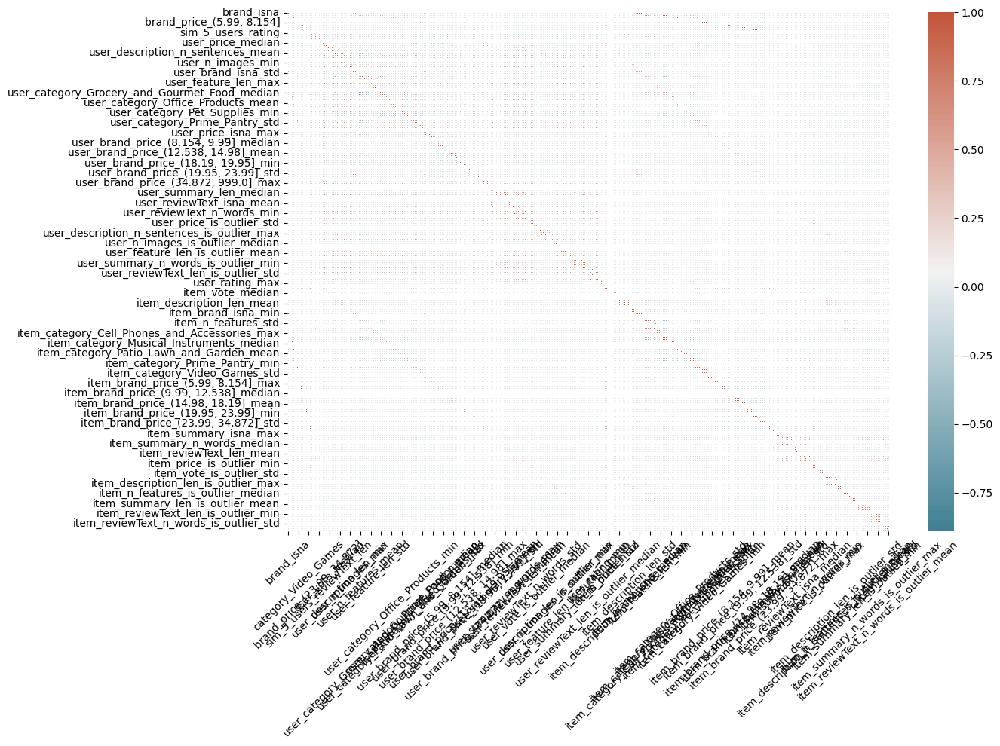

# pearson correlations >= 0.5:


,brand_isna,category_Grocery_and_Gourmet_Food,category_Musical_Instruments,category_Office_Products,category_Patio_Lawn_and_Garden,category_Pet_Supplies,category_Prime_Pantry,category_Video_Games,"brand_price_(34.872, 999.0]",sim_5_users_rating,sim_5_users_description_len,sim_5_users_n_images,sim_5_users_feature_len,sim_5_users_price,sim_5_users_summary_len,sim_5_users_reviewText_len,user_price_min,user_price_mean,user_price_median,user_price_max,user_price_std,user_vote_min,user_vote_mean,user_vote_median,user_vote_max,user_vote_std,user_description_n_sentences_min,user_description_n_sentences_mean,user_description_n_sentences_median,user_description_n_sentences_max,user_description_n_sentences_std,user_description_len_min,user_description_len_mean,user_description_len_median,user_description_len_max,user_description_len_std,user_n_images_min,user_n_images_mean,user_n_images_median,user_n_images_max,user_n_images_std,user_brand_isna_min,user_brand_isna_mean,user_brand_isna_median,user_brand_isna_max,user_brand_isna_std,user_n_features_min,user_n_features_mean,user_n_features_median,user_n_features_max,user_n_features_std,user_feature_len_min,user_feature_len_mean,user_feature_len_median,user_feature_len_max,user_feature_len_std,user_category_Cell_Phones_and_Accessories_min,user_category_Cell_Phones_and_Accessories_mean,user_category_Cell_Phones_and_Accessories_median,user_category_Cell_Phones_and_Accessories_max,user_category_Cell_Phones_and_Accessories_std,user_category_Grocery_and_Gourmet_Food_min,user_category_Grocery_and_Gourmet_Food_mean,user_category_Grocery_and_Gourmet_Food_median,user_category_Grocery_and_Gourmet_Food_max,user_category_Grocery_and_Gourmet_Food_std,user_category_Musical_Instruments_min,user_category_Musical_Instruments_mean,user_category_Musical_Instruments_median,user_category_Musical_Instruments_max,user_category_Musical_Instruments_std,user_category_Office_Products_min,user_category_Office_Products_mean,user_category_Office_Products_median,user_category_Office_Products_max,user_category_Office_Products_std,user_category_Patio_Lawn_and_Garden_min,user_category_Patio_Lawn_and_Garden_mean,user_category_Patio_Lawn_and_Garden_median,user_category_Patio_Lawn_and_Garden_max,user_category_Patio_Lawn_and_Garden_std,user_category_Pet_Supplies_min,user_category_Pet_Supplies_mean,user_category_Pet_Supplies_median,user_category_Pet_Supplies_max,user_category_Pet_Supplies_std,user_category_Prime_Pantry_min,user_category_Prime_Pantry_mean,user_category_Prime_Pantry_median,user_category_Prime_Pantry_max,user_category_Prime_Pantry_std,user_category_Video_Games_min,user_category_Video_Games_mean,user_category_Video_Games_median,user_category_Video_Games_max,user_category_Video_Games_std,user_price_isna_min,user_price_isna_mean,user_price_isna_median,user_price_isna_max,user_price_isna_std,"user_brand_price_(5.99, 8.154]_mean","user_brand_price_(5.99, 8.154]_median","user_brand_price_(5.99, 8.154]_max","user_brand_price_(5.99, 8.154]_std","user_brand_price_(8.154, 9.99]_mean","user_brand_price_(8.154, 9.99]_median","user_brand_price_(8.154, 9.99]_max","user_brand_price_(8.154, 9.99]_std","user_brand_price_(9.99, 12.538]_mean","user_brand_price_(9.99, 12.538]_median","user_brand_price_(9.99, 12.538]_max","user_brand_price_(9.99, 12.538]_std","user_brand_price_(12.538, 14.98]_mean","user_brand_price_(12.538, 14.98]_median","user_brand_price_(12.538, 14.98]_max","user_brand_price_(12.538, 14.98]_std","user_brand_price_(14.98, 18.19]_mean","user_brand_price_(14.98, 18.19]_median","user_brand_price_(14.98, 18.19]_max","user_brand_price_(14.98, 18.19]_std","user_brand_price_(18.19, 19.95]_mean","user_brand_price_(18.19, 19.95]_median","user_brand_price_(18.19, 19.95]_max","user_brand_price_(18.19, 19.95]_std","user_brand_price_(19.95, 23.99]_mean","user_brand_price_(19.95, 23.99]_median","user_brand_price_(19.95, 23.99]_max","user_brand_price_(19.95, 23.99]_std","user_brand_price_(23.99, 34.872]_min","user_brand_price_(23.9

In [180]:
corr_features = get_correlation_stats(train, method='pearson', strong_corr_val = 0.5, figsize=(14,10), annot=False)
corr_features

In [181]:
corr_features_to_drop = corr_features.drop(columns=target, errors='ignore')

In [ ]:

to_drop = set()
for i in range(len(corr_features_to_drop.columns)):
    for j in range(i+1, len(corr_features.columns)):
        if abs(corr_features.iloc[i, j]) > 0.9: 
            colname = corr_features.columns[i]
            to_drop.add(colname)


train = train.drop(columns=to_drop)
val = val.drop(columns=to_drop)
test = test.drop(columns=to_drop)
train.shape

(135923, 386)

# pearson correlations:


,brand_isna,category_Cell_Phones_and_Accessories,category_Musical_Instruments,category_Patio_Lawn_and_Garden,category_Pet_Supplies,category_Video_Games,"brand_price_(5.99, 8.154]","brand_price_(8.154, 9.99]","brand_price_(9.99, 12.538]","brand_price_(12.538, 14.98]","brand_price_(14.98, 18.19]","brand_price_(18.19, 19.95]","brand_price_(19.95, 23.99]","brand_price_(23.99, 34.872]","brand_price_(34.872, 999.0]",sim_5_users_rating,sim_5_users_description_len,sim_5_users_n_images,sim_5_users_feature_len,sim_5_users_price,sim_5_users_summary_len,sim_5_users_reviewText_len,user_price_min,user_price_mean,user_price_median,user_price_max,user_price_std,user_vote_min,user_vote_mean,user_vote_median,user_vote_max,user_vote_std,user_description_n_sentences_min,user_description_n_sentences_mean,user_description_n_sentences_median,user_description_n_sentences_max,user_description_n_sentences_std,user_description_len_min,user_description_len_mean,user_description_len_median,user_description_len_max,user_description_len_std,user_n_images_min,user_n_images_mean,user_n_images_median,user_n_images_max,user_n_images_std,user_brand_isna_min,user_brand_isna_median,user_brand_isna_max,user_brand_isna_std,user_n_features_min,user_n_features_mean,user_n_features_median,user_n_features_max,user_n_features_std,user_feature_len_min,user_feature_len_mean,user_feature_len_median,user_feature_len_max,user_feature_len_std,user_category_Cell_Phones_and_Accessories_min,user_category_Cell_Phones_and_Accessories_mean,user_category_Cell_Phones_and_Accessories_median,user_category_Cell_Phones_and_Accessories_std,user_category_Grocery_and_Gourmet_Food_min,user_category_Grocery_and_Gourmet_Food_mean,user_category_Grocery_and_Gourmet_Food_median,user_category_Grocery_and_Gourmet_Food_max,user_category_Grocery_and_Gourmet_Food_std,user_category_Musical_Instruments_min,user_category_Musical_Instruments_median,user_category_Musical_Instruments_max,user_category_Musical_Instruments_std,user_category_Office_Products_min,user_category_Office_Products_mean,user_category_Office_Products_median,user_category_Office_Products_max,user_category_Office_Products_std,user_category_Patio_Lawn_and_Garden_min,user_category_Patio_Lawn_and_Garden_mean,user_category_Patio_Lawn_and_Garden_median,user_category_Patio_Lawn_and_Garden_max,user_category_Patio_Lawn_and_Garden_std,user_category_Pet_Supplies_min,user_category_Pet_Supplies_mean,user_category_Pet_Supplies_median,user_category_Pet_Supplies_max,user_category_Pet_Supplies_std,user_category_Prime_Pantry_min,user_category_Prime_Pantry_mean,user_category_Prime_Pantry_median,user_category_Prime_Pantry_max,user_category_Prime_Pantry_std,user_category_Video_Games_min,user_category_Video_Games_mean,user_category_Video_Games_median,user_category_Video_Games_max,user_category_Video_Games_std,user_price_isna_min,user_price_isna_mean,user_price_isna_median,user_price_isna_std,"user_brand_price_(5.99, 8.154]_min","user_brand_price_(5.99, 8.154]_mean","user_brand_price_(5.99, 8.154]_median","user_brand_price_(5.99, 8.154]_std","user_brand_price_(8.154, 9.99]_min","user_brand_price_(8.154, 9.99]_mean","user_brand_price_(8.154, 9.99]_median","user_brand_price_(8.154, 9.99]_std","user_brand_price_(9.99, 12.538]_min","user_brand_price_(9.99, 12.538]_mean","user_brand_price_(9.99, 12.538]_median","user_brand_price_(9.99, 12.538]_std","user_brand_price_(12.538, 14.98]_min","user_brand_price_(12.538, 14.98]_mean","user_brand_price_(12.538, 14.98]_median","user_brand_price_(12.538, 14.98]_std","user_brand_price_(14.98, 18.19]_min","user_brand_price_(14.98, 18.19]_mean","user_brand_price_(14.98, 18.19]_median","user_brand_price_(14.98, 18.19]_std","user_brand_price_(18.19, 19.95]_min","user_brand_price_(18.19, 19.95]_mean","user_brand_price_(18.19, 19.95]_median","user_brand_price_(18.19, 19.95]_max","user_brand_price_(18.19, 19.95]_std","user_brand_price_(19.95, 23.99]_min","user_brand_price_(19.95, 23.99]_mean","user_brand_price_(19.95, 23.99]_median",

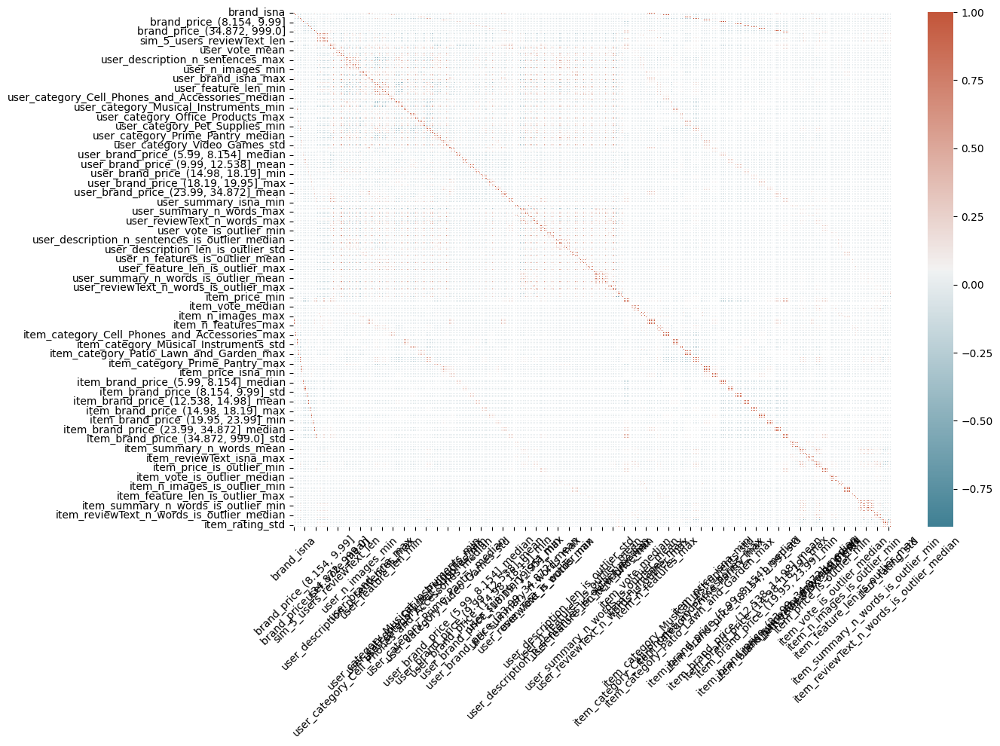

# pearson correlations >= 0.5:


,brand_isna,category_Musical_Instruments,category_Patio_Lawn_and_Garden,category_Pet_Supplies,category_Video_Games,"brand_price_(34.872, 999.0]",sim_5_users_rating,sim_5_users_description_len,sim_5_users_n_images,sim_5_users_feature_len,sim_5_users_price,sim_5_users_summary_len,sim_5_users_reviewText_len,user_price_min,user_price_mean,user_price_median,user_price_max,user_price_std,user_vote_min,user_vote_mean,user_vote_median,user_vote_max,user_vote_std,user_description_n_sentences_min,user_description_n_sentences_mean,user_description_n_sentences_median,user_description_n_sentences_max,user_description_n_sentences_std,user_description_len_min,user_description_len_mean,user_description_len_median,user_description_len_max,user_description_len_std,user_n_images_min,user_n_images_mean,user_n_images_median,user_n_images_max,user_n_images_std,user_brand_isna_min,user_brand_isna_median,user_brand_isna_max,user_brand_isna_std,user_n_features_min,user_n_features_mean,user_n_features_median,user_n_features_max,user_n_features_std,user_feature_len_min,user_feature_len_mean,user_feature_len_median,user_feature_len_max,user_feature_len_std,user_category_Cell_Phones_and_Accessories_min,user_category_Cell_Phones_and_Accessories_mean,user_category_Cell_Phones_and_Accessories_median,user_category_Cell_Phones_and_Accessories_std,user_category_Grocery_and_Gourmet_Food_min,user_category_Grocery_and_Gourmet_Food_mean,user_category_Grocery_and_Gourmet_Food_median,user_category_Grocery_and_Gourmet_Food_max,user_category_Grocery_and_Gourmet_Food_std,user_category_Musical_Instruments_min,user_category_Musical_Instruments_median,user_category_Musical_Instruments_max,user_category_Musical_Instruments_std,user_category_Office_Products_min,user_category_Office_Products_mean,user_category_Office_Products_median,user_category_Office_Products_max,user_category_Office_Products_std,user_category_Patio_Lawn_and_Garden_min,user_category_Patio_Lawn_and_Garden_mean,user_category_Patio_Lawn_and_Garden_median,user_category_Patio_Lawn_and_Garden_max,user_category_Patio_Lawn_and_Garden_std,user_category_Pet_Supplies_min,user_category_Pet_Supplies_mean,user_category_Pet_Supplies_median,user_category_Pet_Supplies_max,user_category_Pet_Supplies_std,user_category_Prime_Pantry_min,user_category_Prime_Pantry_mean,user_category_Prime_Pantry_median,user_category_Prime_Pantry_max,user_category_Prime_Pantry_std,user_category_Video_Games_min,user_category_Video_Games_mean,user_category_Video_Games_median,user_category_Video_Games_max,user_category_Video_Games_std,user_price_isna_min,user_price_isna_mean,user_price_isna_median,user_price_isna_std,"user_brand_price_(5.99, 8.154]_mean","user_brand_price_(5.99, 8.154]_median","user_brand_price_(5.99, 8.154]_std","user_brand_price_(8.154, 9.99]_mean","user_brand_price_(8.154, 9.99]_median","user_brand_price_(8.154, 9.99]_std","user_brand_price_(9.99, 12.538]_mean","user_brand_price_(9.99, 12.538]_median","user_brand_price_(9.99, 12.538]_std","user_brand_price_(12.538, 14.98]_mean","user_brand_price_(12.538, 14.98]_median","user_brand_price_(12.538, 14.98]_std","user_brand_price_(14.98, 18.19]_mean","user_brand_price_(14.98, 18.19]_median","user_brand_price_(14.98, 18.19]_std","user_brand_price_(18.19, 19.95]_mean","user_brand_price_(18.19, 19.95]_median","user_brand_price_(18.19, 19.95]_max","user_brand_price_(18.19, 19.95]_std","user_brand_price_(19.95, 23.99]_mean","user_brand_price_(19.95, 23.99]_median","user_brand_price_(19.95, 23.99]_std","user_brand_price_(23.99, 34.872]_min","user_brand_price_(23.99, 34.872]_mean","user_brand_price_(23.99, 34.872]_median","user_brand_price_(23.99, 34.872]_std","user_brand_price_(34.872, 999.0]_mean","user_brand_price_(34.872, 999.0]_median","user_brand_price_(34.872, 999.0]_std",user_summary_isna_mean,user_summary_isna_median,user_summary_isna_std,user_summary_n_words_min,user_summary_n_words_mean,user_summary_n_words_median,user_summary_n_words_max,user_summary_n_words_std,user_reviewText_

In [183]:
corr_features = get_correlation_stats(train, method='pearson', strong_corr_val = 0.5, figsize=(14,10), annot=False)
corr_features

In [184]:
corr_features[target] if target in corr_features else ""

''

In [185]:
train.shape, val.shape, test.shape

((135923, 386), (23831, 386), (24582, 386))

In [195]:
features = train.drop(columns=target).describe().columns.tolist()
len(features), features 

(379,
 ['brand_isna',
  'category_Cell_Phones_and_Accessories',
  'category_Musical_Instruments',
  'category_Patio_Lawn_and_Garden',
  'category_Pet_Supplies',
  'category_Video_Games',
  'brand_price_(5.99, 8.154]',
  'brand_price_(8.154, 9.99]',
  'brand_price_(9.99, 12.538]',
  'brand_price_(12.538, 14.98]',
  'brand_price_(14.98, 18.19]',
  'brand_price_(18.19, 19.95]',
  'brand_price_(19.95, 23.99]',
  'brand_price_(23.99, 34.872]',
  'brand_price_(34.872, 999.0]',
  'sim_5_users_rating',
  'sim_5_users_description_len',
  'sim_5_users_n_images',
  'sim_5_users_feature_len',
  'sim_5_users_price',
  'sim_5_users_summary_len',
  'sim_5_users_reviewText_len',
  'user_price_min',
  'user_price_mean',
  'user_price_median',
  'user_price_max',
  'user_price_std',
  'user_vote_min',
  'user_vote_mean',
  'user_vote_median',
  'user_vote_max',
  'user_vote_std',
  'user_description_n_sentences_min',
  'user_description_n_sentences_mean',
  'user_description_n_sentences_median',
  'user

In [196]:
[col for col in features if 'sim' in col]

['sim_5_users_rating',
 'sim_5_users_description_len',
 'sim_5_users_n_images',
 'sim_5_users_feature_len',
 'sim_5_users_price',
 'sim_5_users_summary_len',
 'sim_5_users_reviewText_len']

In [197]:
X_train = train.drop(columns=target)
y_train = train[target]

X_val = val.drop(columns=target)
y_val = val[target]

X_test = test.drop(columns=target)
y_test = test[target]

In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

scaler.fit(X_train[features])

X_train_scaled = scaler.transform(X_train[features])
X_val_scaled = scaler.transform(X_val[features])
X_test_scaled = scaler.transform(X_test[features])

In [199]:
X_train_scaled = pd.DataFrame(X_train_scaled)
X_train_scaled.columns = features

X_val_scaled = pd.DataFrame(X_val_scaled)
X_val_scaled.columns = features

X_test_scaled = pd.DataFrame(X_test_scaled)

X_test_scaled.columns = features

X_train_scaled

,brand_isna,category_Cell_Phones_and_Accessories,category_Musical_Instruments,category_Patio_Lawn_and_Garden,category_Pet_Supplies,category_Video_Games,"brand_price_(5.99, 8.154]","brand_price_(8.154, 9.99]","brand_price_(9.99, 12.538]","brand_price_(12.538, 14.98]","brand_price_(14.98, 18.19]","brand_price_(18.19, 19.95]","brand_price_(19.95, 23.99]","brand_price_(23.99, 34.872]","brand_price_(34.872, 999.0]",sim_5_users_rating,sim_5_users_description_len,sim_5_users_n_images,sim_5_users_feature_len,sim_5_users_price,sim_5_users_summary_len,sim_5_users_reviewText_len,user_price_min,user_price_mean,user_price_median,user_price_max,user_price_std,user_vote_min,user_vote_mean,user_vote_median,user_vote_max,user_vote_std,user_description_n_sentences_min,user_description_n_sentences_mean,user_description_n_sentences_median,user_description_n_sentences_max,user_description_n_sentences_std,user_description_len_min,user_description_len_mean,user_description_len_median,user_description_len_max,user_description_len_std,user_n_images_min,user_n_images_mean,user_n_images_median,user_n_images_max,user_n_images_std,user_brand_isna_min,user_brand_isna_median,user_brand_isna_max,user_brand_isna_std,user_n_features_min,user_n_features_mean,user_n_features_median,user_n_features_max,user_n_features_std,user_feature_len_min,user_feature_len_mean,user_feature_len_median,user_feature_len_max,user_feature_len_std,user_category_Cell_Phones_and_Accessories_min,user_category_Cell_Phones_and_Accessories_mean,user_category_Cell_Phones_and_Accessories_median,user_category_Cell_Phones_and_Accessories_std,user_category_Grocery_and_Gourmet_Food_min,user_category_Grocery_and_Gourmet_Food_mean,user_category_Grocery_and_Gourmet_Food_median,user_category_Grocery_and_Gourmet_Food_max,user_category_Grocery_and_Gourmet_Food_std,user_category_Musical_Instruments_min,user_category_Musical_Instruments_median,user_category_Musical_Instruments_max,user_category_Musical_Instruments_std,user_category_Office_Products_min,user_category_Office_Products_mean,user_category_Office_Products_median,user_category_Office_Products_max,user_category_Office_Products_std,user_category_Patio_Lawn_and_Garden_min,user_category_Patio_Lawn_and_Garden_mean,user_category_Patio_Lawn_and_Garden_median,user_category_Patio_Lawn_and_Garden_max,user_category_Patio_Lawn_and_Garden_std,user_category_Pet_Supplies_min,user_category_Pet_Supplies_mean,user_category_Pet_Supplies_median,user_category_Pet_Supplies_max,user_category_Pet_Supplies_std,user_category_Prime_Pantry_min,user_category_Prime_Pantry_mean,user_category_Prime_Pantry_median,user_category_Prime_Pantry_max,user_category_Prime_Pantry_std,user_category_Video_Games_min,user_category_Video_Games_mean,user_category_Video_Games_median,user_category_Video_Games_max,user_category_Video_Games_std,user_price_isna_min,user_price_isna_mean,user_price_isna_median,user_price_isna_std,"user_brand_price_(5.99, 8.154]_min","user_brand_price_(5.99, 8.154]_mean","user_brand_price_(5.99, 8.154]_median","user_brand_price_(5.99, 8.154]_std","user_brand_price_(8.154, 9.99]_min","user_brand_price_(8.154, 9.99]_mean","user_brand_price_(8.154, 9.99]_median","user_brand_price_(8.154, 9.99]_std","user_brand_price_(9.99, 12.538]_min","user_brand_price_(9.99, 12.538]_mean","user_brand_price_(9.99, 12.538]_median","user_brand_price_(9.99, 12.538]_std","user_brand_price_(12.538, 14.98]_min","user_brand_price_(12.538, 14.98]_mean","user_brand_price_(12.538, 14.98]_median","user_brand_price_(12.538, 14.98]_std","user_brand_price_(14.98, 18.19]_min","user_brand_price_(14.98, 18.19]_mean","user_brand_price_(14.98, 18.19]_median","user_brand_price_(14.98, 18.19]_std","user_brand_price_(18.19, 19.95]_min","user_brand_price_(18.19, 19.95]_mean","user_brand_price_(18.19, 19.95]_median","user_brand_price_(18.19, 19.95]_max","user_brand_price_(18.19, 19.95]_std","user_brand_price_(19.95, 23.99]_min","user_brand_price_(19.95, 23.99]_mean","user_brand_price_(19.95, 23.99]_median",

In [200]:
X_train_scaled.agg(['mean','std']).round(2)

,brand_isna,category_Cell_Phones_and_Accessories,category_Musical_Instruments,category_Patio_Lawn_and_Garden,category_Pet_Supplies,category_Video_Games,"brand_price_(5.99, 8.154]","brand_price_(8.154, 9.99]","brand_price_(9.99, 12.538]","brand_price_(12.538, 14.98]","brand_price_(14.98, 18.19]","brand_price_(18.19, 19.95]","brand_price_(19.95, 23.99]","brand_price_(23.99, 34.872]","brand_price_(34.872, 999.0]",sim_5_users_rating,sim_5_users_description_len,sim_5_users_n_images,sim_5_users_feature_len,sim_5_users_price,sim_5_users_summary_len,sim_5_users_reviewText_len,user_price_min,user_price_mean,user_price_median,user_price_max,user_price_std,user_vote_min,user_vote_mean,user_vote_median,user_vote_max,user_vote_std,user_description_n_sentences_min,user_description_n_sentences_mean,user_description_n_sentences_median,user_description_n_sentences_max,user_description_n_sentences_std,user_description_len_min,user_description_len_mean,user_description_len_median,user_description_len_max,user_description_len_std,user_n_images_min,user_n_images_mean,user_n_images_median,user_n_images_max,user_n_images_std,user_brand_isna_min,user_brand_isna_median,user_brand_isna_max,user_brand_isna_std,user_n_features_min,user_n_features_mean,user_n_features_median,user_n_features_max,user_n_features_std,user_feature_len_min,user_feature_len_mean,user_feature_len_median,user_feature_len_max,user_feature_len_std,user_category_Cell_Phones_and_Accessories_min,user_category_Cell_Phones_and_Accessories_mean,user_category_Cell_Phones_and_Accessories_median,user_category_Cell_Phones_and_Accessories_std,user_category_Grocery_and_Gourmet_Food_min,user_category_Grocery_and_Gourmet_Food_mean,user_category_Grocery_and_Gourmet_Food_median,user_category_Grocery_and_Gourmet_Food_max,user_category_Grocery_and_Gourmet_Food_std,user_category_Musical_Instruments_min,user_category_Musical_Instruments_median,user_category_Musical_Instruments_max,user_category_Musical_Instruments_std,user_category_Office_Products_min,user_category_Office_Products_mean,user_category_Office_Products_median,user_category_Office_Products_max,user_category_Office_Products_std,user_category_Patio_Lawn_and_Garden_min,user_category_Patio_Lawn_and_Garden_mean,user_category_Patio_Lawn_and_Garden_median,user_category_Patio_Lawn_and_Garden_max,user_category_Patio_Lawn_and_Garden_std,user_category_Pet_Supplies_min,user_category_Pet_Supplies_mean,user_category_Pet_Supplies_median,user_category_Pet_Supplies_max,user_category_Pet_Supplies_std,user_category_Prime_Pantry_min,user_category_Prime_Pantry_mean,user_category_Prime_Pantry_median,user_category_Prime_Pantry_max,user_category_Prime_Pantry_std,user_category_Video_Games_min,user_category_Video_Games_mean,user_category_Video_Games_median,user_category_Video_Games_max,user_category_Video_Games_std,user_price_isna_min,user_price_isna_mean,user_price_isna_median,user_price_isna_std,"user_brand_price_(5.99, 8.154]_min","user_brand_price_(5.99, 8.154]_mean","user_brand_price_(5.99, 8.154]_median","user_brand_price_(5.99, 8.154]_std","user_brand_price_(8.154, 9.99]_min","user_brand_price_(8.154, 9.99]_mean","user_brand_price_(8.154, 9.99]_median","user_brand_price_(8.154, 9.99]_std","user_brand_price_(9.99, 12.538]_min","user_brand_price_(9.99, 12.538]_mean","user_brand_price_(9.99, 12.538]_median","user_brand_price_(9.99, 12.538]_std","user_brand_price_(12.538, 14.98]_min","user_brand_price_(12.538, 14.98]_mean","user_brand_price_(12.538, 14.98]_median","user_brand_price_(12.538, 14.98]_std","user_brand_price_(14.98, 18.19]_min","user_brand_price_(14.98, 18.19]_mean","user_brand_price_(14.98, 18.19]_median","user_brand_price_(14.98, 18.19]_std","user_brand_price_(18.19, 19.95]_min","user_brand_price_(18.19, 19.95]_mean","user_brand_price_(18.19, 19.95]_median","user_brand_price_(18.19, 19.95]_max","user_brand_price_(18.19, 19.95]_std","user_brand_price_(19.95, 23.99]_min","user_brand_price_(19.95, 23.99]_mean","user_brand_price_(19.95, 23.99]_median",

In [202]:
train = pd.concat([X_train_scaled, y_train], axis=1)
train.index = X_train['userName']

val = pd.concat([X_val_scaled, y_val], axis=1)
val.index = X_val['userName']

test = pd.concat([X_test_scaled, y_test], axis=1)
test.index = X_test['userName']

train[train.index == 'Amazossn Customerccocooper17o']

,brand_isna,category_Cell_Phones_and_Accessories,category_Musical_Instruments,category_Patio_Lawn_and_Garden,category_Pet_Supplies,category_Video_Games,"brand_price_(5.99, 8.154]","brand_price_(8.154, 9.99]","brand_price_(9.99, 12.538]","brand_price_(12.538, 14.98]","brand_price_(14.98, 18.19]","brand_price_(18.19, 19.95]","brand_price_(19.95, 23.99]","brand_price_(23.99, 34.872]","brand_price_(34.872, 999.0]",sim_5_users_rating,sim_5_users_description_len,sim_5_users_n_images,sim_5_users_feature_len,sim_5_users_price,sim_5_users_summary_len,sim_5_users_reviewText_len,user_price_min,user_price_mean,user_price_median,user_price_max,user_price_std,user_vote_min,user_vote_mean,user_vote_median,user_vote_max,user_vote_std,user_description_n_sentences_min,user_description_n_sentences_mean,user_description_n_sentences_median,user_description_n_sentences_max,user_description_n_sentences_std,user_description_len_min,user_description_len_mean,user_description_len_median,user_description_len_max,user_description_len_std,user_n_images_min,user_n_images_mean,user_n_images_median,user_n_images_max,user_n_images_std,user_brand_isna_min,user_brand_isna_median,user_brand_isna_max,user_brand_isna_std,user_n_features_min,user_n_features_mean,user_n_features_median,user_n_features_max,user_n_features_std,user_feature_len_min,user_feature_len_mean,user_feature_len_median,user_feature_len_max,user_feature_len_std,user_category_Cell_Phones_and_Accessories_min,user_category_Cell_Phones_and_Accessories_mean,user_category_Cell_Phones_and_Accessories_median,user_category_Cell_Phones_and_Accessories_std,user_category_Grocery_and_Gourmet_Food_min,user_category_Grocery_and_Gourmet_Food_mean,user_category_Grocery_and_Gourmet_Food_median,user_category_Grocery_and_Gourmet_Food_max,user_category_Grocery_and_Gourmet_Food_std,user_category_Musical_Instruments_min,user_category_Musical_Instruments_median,user_category_Musical_Instruments_max,user_category_Musical_Instruments_std,user_category_Office_Products_min,user_category_Office_Products_mean,user_category_Office_Products_median,user_category_Office_Products_max,user_category_Office_Products_std,user_category_Patio_Lawn_and_Garden_min,user_category_Patio_Lawn_and_Garden_mean,user_category_Patio_Lawn_and_Garden_median,user_category_Patio_Lawn_and_Garden_max,user_category_Patio_Lawn_and_Garden_std,user_category_Pet_Supplies_min,user_category_Pet_Supplies_mean,user_category_Pet_Supplies_median,user_category_Pet_Supplies_max,user_category_Pet_Supplies_std,user_category_Prime_Pantry_min,user_category_Prime_Pantry_mean,user_category_Prime_Pantry_median,user_category_Prime_Pantry_max,user_category_Prime_Pantry_std,user_category_Video_Games_min,user_category_Video_Games_mean,user_category_Video_Games_median,user_category_Video_Games_max,user_category_Video_Games_std,user_price_isna_min,user_price_isna_mean,user_price_isna_median,user_price_isna_std,"user_brand_price_(5.99, 8.154]_min","user_brand_price_(5.99, 8.154]_mean","user_brand_price_(5.99, 8.154]_median","user_brand_price_(5.99, 8.154]_std","user_brand_price_(8.154, 9.99]_min","user_brand_price_(8.154, 9.99]_mean","user_brand_price_(8.154, 9.99]_median","user_brand_price_(8.154, 9.99]_std","user_brand_price_(9.99, 12.538]_min","user_brand_price_(9.99, 12.538]_mean","user_brand_price_(9.99, 12.538]_median","user_brand_price_(9.99, 12.538]_std","user_brand_price_(12.538, 14.98]_min","user_brand_price_(12.538, 14.98]_mean","user_brand_price_(12.538, 14.98]_median","user_brand_price_(12.538, 14.98]_std","user_brand_price_(14.98, 18.19]_min","user_brand_price_(14.98, 18.19]_mean","user_brand_price_(14.98, 18.19]_median","user_brand_price_(14.98, 18.19]_std","user_brand_price_(18.19, 19.95]_min","user_brand_price_(18.19, 19.95]_mean","user_brand_price_(18.19, 19.95]_median","user_brand_price_(18.19, 19.95]_max","user_brand_price_(18.19, 19.95]_std","user_brand_price_(19.95, 23.99]_min","user_brand_price_(19.95, 23.99]_mean","user_brand_price_(19.95, 23.99]_median",

In [203]:
baseline_pred_dict = train.groupby('userName')[target].mean().to_dict()
baseline_pred_dict

{' Boo': 4.0,
 ' Carol Ann': 4.5,
 ' KT': 4.333333333333333,
 ' Seas the Day ': 5.0,
 '#1 Honest reviewer :)': 4.818181818181818,
 '#1clarkgirl': 5.0,
 '#Blessed': 3.3333333333333335,
 '&#034;Chateau Toro&#034;': 5.0,
 '&#039;El-Choya&#039;': 3.6666666666666665,
 '&amp;#34;Legalady&amp;#34;': 3.4,
 '()': 4.0,
 '-Mimi-': 5.0,
 '.': 4.0,
 '1 poodle lover': 3.75,
 '1000riv': 4.714285714285714,
 '10vfreeman': 4.333333333333333,
 '1STARBUCK1': 4.833333333333333,
 '1VAarcher': 4.428571428571429,
 '1feistymama': 5.0,
 '1nightbird1': 4.0,
 '2 Old Texan&#039;s': 2.3333333333333335,
 '2 meatballz': 5.0,
 '2 normal people': 5.0,
 '2cat mom': 4.5,
 '2tall4u': 5.0,
 '3Gr8KidsDad': 4.714285714285714,
 '3rdGen': 4.0,
 '40dbOverS9': 5.0,
 '454Malibu': 4.0,
 '465alm': 5.0,
 '4real': 3.0,
 '50 something': 4.6,
 '50Bubbles': 5.0,
 '5everyung': 5.0,
 '5kjen': 5.0,
 '62moviefan': 3.5,
 '73roe': 3.6666666666666665,
 '77': 5.0,
 '808': 5.0,
 ':) jlp': 4.75,
 '@Kilmichael': 4.875,
 '@angelaswriter': 5.0,
 '@l

In [204]:
val[~val.index.isin(train.index)]

,brand_isna,category_Cell_Phones_and_Accessories,category_Musical_Instruments,category_Patio_Lawn_and_Garden,category_Pet_Supplies,category_Video_Games,"brand_price_(5.99, 8.154]","brand_price_(8.154, 9.99]","brand_price_(9.99, 12.538]","brand_price_(12.538, 14.98]","brand_price_(14.98, 18.19]","brand_price_(18.19, 19.95]","brand_price_(19.95, 23.99]","brand_price_(23.99, 34.872]","brand_price_(34.872, 999.0]",sim_5_users_rating,sim_5_users_description_len,sim_5_users_n_images,sim_5_users_feature_len,sim_5_users_price,sim_5_users_summary_len,sim_5_users_reviewText_len,user_price_min,user_price_mean,user_price_median,user_price_max,user_price_std,user_vote_min,user_vote_mean,user_vote_median,user_vote_max,user_vote_std,user_description_n_sentences_min,user_description_n_sentences_mean,user_description_n_sentences_median,user_description_n_sentences_max,user_description_n_sentences_std,user_description_len_min,user_description_len_mean,user_description_len_median,user_description_len_max,user_description_len_std,user_n_images_min,user_n_images_mean,user_n_images_median,user_n_images_max,user_n_images_std,user_brand_isna_min,user_brand_isna_median,user_brand_isna_max,user_brand_isna_std,user_n_features_min,user_n_features_mean,user_n_features_median,user_n_features_max,user_n_features_std,user_feature_len_min,user_feature_len_mean,user_feature_len_median,user_feature_len_max,user_feature_len_std,user_category_Cell_Phones_and_Accessories_min,user_category_Cell_Phones_and_Accessories_mean,user_category_Cell_Phones_and_Accessories_median,user_category_Cell_Phones_and_Accessories_std,user_category_Grocery_and_Gourmet_Food_min,user_category_Grocery_and_Gourmet_Food_mean,user_category_Grocery_and_Gourmet_Food_median,user_category_Grocery_and_Gourmet_Food_max,user_category_Grocery_and_Gourmet_Food_std,user_category_Musical_Instruments_min,user_category_Musical_Instruments_median,user_category_Musical_Instruments_max,user_category_Musical_Instruments_std,user_category_Office_Products_min,user_category_Office_Products_mean,user_category_Office_Products_median,user_category_Office_Products_max,user_category_Office_Products_std,user_category_Patio_Lawn_and_Garden_min,user_category_Patio_Lawn_and_Garden_mean,user_category_Patio_Lawn_and_Garden_median,user_category_Patio_Lawn_and_Garden_max,user_category_Patio_Lawn_and_Garden_std,user_category_Pet_Supplies_min,user_category_Pet_Supplies_mean,user_category_Pet_Supplies_median,user_category_Pet_Supplies_max,user_category_Pet_Supplies_std,user_category_Prime_Pantry_min,user_category_Prime_Pantry_mean,user_category_Prime_Pantry_median,user_category_Prime_Pantry_max,user_category_Prime_Pantry_std,user_category_Video_Games_min,user_category_Video_Games_mean,user_category_Video_Games_median,user_category_Video_Games_max,user_category_Video_Games_std,user_price_isna_min,user_price_isna_mean,user_price_isna_median,user_price_isna_std,"user_brand_price_(5.99, 8.154]_min","user_brand_price_(5.99, 8.154]_mean","user_brand_price_(5.99, 8.154]_median","user_brand_price_(5.99, 8.154]_std","user_brand_price_(8.154, 9.99]_min","user_brand_price_(8.154, 9.99]_mean","user_brand_price_(8.154, 9.99]_median","user_brand_price_(8.154, 9.99]_std","user_brand_price_(9.99, 12.538]_min","user_brand_price_(9.99, 12.538]_mean","user_brand_price_(9.99, 12.538]_median","user_brand_price_(9.99, 12.538]_std","user_brand_price_(12.538, 14.98]_min","user_brand_price_(12.538, 14.98]_mean","user_brand_price_(12.538, 14.98]_median","user_brand_price_(12.538, 14.98]_std","user_brand_price_(14.98, 18.19]_min","user_brand_price_(14.98, 18.19]_mean","user_brand_price_(14.98, 18.19]_median","user_brand_price_(14.98, 18.19]_std","user_brand_price_(18.19, 19.95]_min","user_brand_price_(18.19, 19.95]_mean","user_brand_price_(18.19, 19.95]_median","user_brand_price_(18.19, 19.95]_max","user_brand_price_(18.19, 19.95]_std","user_brand_price_(19.95, 23.99]_min","user_brand_price_(19.95, 23.99]_mean","user_brand_price_(19.95, 23.99]_median",

In [205]:
val.index.nunique()

14004

In [206]:
val[~val.index.isin(train.index)].index.nunique()

18

In [207]:
218/23751

0.009178560902698833

In [208]:
val = val[val.index.isin(train.index)]
X_val = X_val[X_val['userName'].isin(val.index)]
X_val.index = val.index

In [213]:
pred_col = f'{target}_pred_baseline' 
val[f'{target}_pred_baseline'] = val.index.map(baseline_pred_dict)
val[[target, pred_col]]

,rating,rating_pred_baseline
userName,,
Boo,5.0,4.000000
Carol Ann,4.0,4.500000
KT,5.0,4.333333
KT,5.0,4.333333
KT,5.0,4.333333
...,...,...
zensm,5.0,4.875000
zephyr 2,5.0,4.333333
zman,5.0,4.000000


In [214]:
from sklearn.metrics import max_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import r2_score

def get_regression_metrics(the_df, target_col, pred_col, the_metrics_df=None, regression_metrics=None, model_name='baseline'):
    if regression_metrics is None:
        regression_metrics = [mean_absolute_error, max_error, mean_absolute_percentage_error, mean_squared_error, r2_score]
    the_metrics_df = pd.DataFrame() if the_metrics_df is None else the_metrics_df
    the_metrics = {}
    the_metrics['userName'] = the_df.index.nunique()
    the_metrics['item_ids'] = the_df['item_id'].nunique()
    the_metrics[f'mean_{target}'] = the_df[target_col].mean()
    for metric in regression_metrics:
        the_metrics[metric.__name__] = metric(the_df[target_col], the_df[pred_col])
    the_df[f'{pred_col}_error_abs'] = (the_df[target] - the_df[pred_col]).abs()
    bins_error_abs = the_df.groupby(target)[f'{pred_col}_error_abs'].mean().add_prefix(f"{target}_").add_suffix("_error").to_dict()
    the_df = the_df.drop(columns=[f'{pred_col}_error_abs'])
    the_metrics.update(bins_error_abs)
    the_metrics = pd.DataFrame.from_dict(the_metrics, columns=[model_name], orient='index').T
    the_metrics_df = pd.concat([the_metrics_df, the_metrics], axis=0)
    
    
    return the_metrics_df

metrics = pd.DataFrame()
metrics = get_regression_metrics(pd.concat([val, X_val['item_id']], axis=1), target, f'{target}_pred_baseline')
metrics

,userName,item_ids,mean_rating,mean_absolute_error,max_error,mean_absolute_percentage_error,mean_squared_error,r2_score,rating_1.0_error,rating_2.0_error,rating_3.0_error,rating_4.0_error,rating_5.0_error
baseline,13986.0,11631.0,4.418721,0.710889,4.0,0.29093,1.109061,0.06836,2.855163,2.099266,1.202381,0.43715,0.494565


In [215]:
from sklearn.linear_model import LinearRegression

reg = LinearRegression(n_jobs=-1).fit(train.drop(columns=target), train[target])
reg.score(train.drop(columns=target), train[target])

0.39654558162811304

,importance,importance_abs
item_n_images_is_outlier_min,-4087181810926.490,4087181810926.490
item_n_images_is_outlier_median,1526935500996.974,1526935500996.974
item_n_images_is_outlier_max,1505997759359.318,1505997759359.318
item_price_is_outlier_min,-1461696628380.361,1461696628380.361
item_n_images_is_outlier_mean,1054248550570.207,1054248550570.207
...,...,...
user_reviewText_isna_median,-0.000,0.000
item_reviewText_isna_min,0.000,0.000
item_price_is_outlier_std,0.000,0.000
user_n_images_is_outlier_min,0.000,0.000


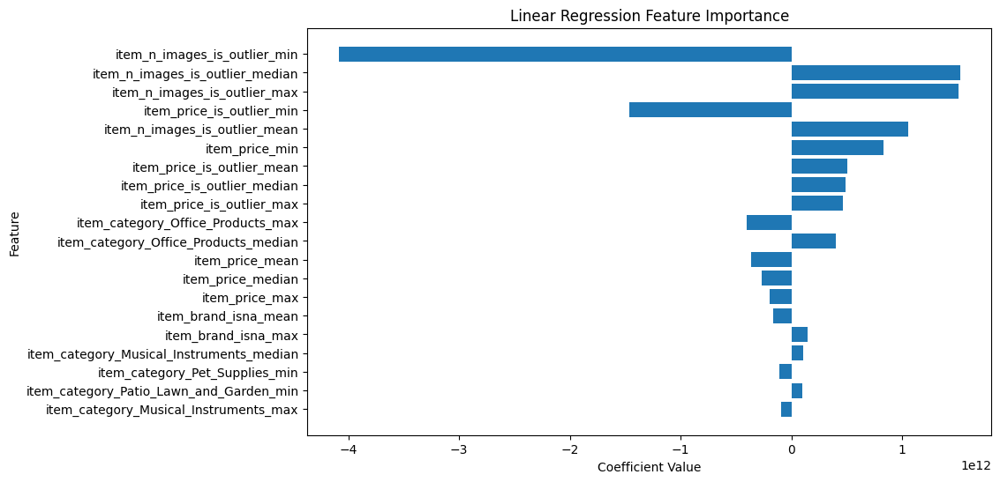

In [ ]:
pd.set_option('display.float_format', '{:.3f}'.format)
coefs = reg.coef_
features_importance = pd.DataFrame(coefs, columns=['importance'], index=features).round(3)
features_importance['importance_abs'] = features_importance['importance'].abs()
features_importance = features_importance.sort_values('importance_abs', ascending=False)

import matplotlib.pyplot as plt

display(features_importance)

plt.figure(figsize=(10, 6))
plt.barh(features_importance.head(20).index[::-1], features_importance.head(20)[::-1]['importance'])
plt.xlabel('Coefficient Value')
plt.ylabel('Feature')
plt.title('Linear Regression Feature Importance')
plt.show()

In [217]:
pred_col = f'{target}_pred_{reg.__str__()}' 
val[pred_col] = reg.predict(val.drop(columns=[col for col in val if col==target or 'pred' in col]))
val[[target]+[col for col in val.columns if 'pred' in col]]

,rating,rating_pred_baseline,rating_pred_LinearRegression(n_jobs=-1)
userName,,,
Boo,5.000,4.000,3.824
Carol Ann,4.000,4.500,4.868
KT,5.000,4.333,4.091
KT,5.000,4.333,3.992
KT,5.000,4.333,4.774
...,...,...,...
zensm,5.000,4.875,4.971
zephyr 2,5.000,4.333,4.029
zman,5.000,4.000,4.453


In [218]:
model_name = reg.__str__()
the_df = pd.concat([val, X_val['item_id']], axis=1) 
target_col = target
the_metrics_df = metrics 
regression_metrics = None
metrics = get_regression_metrics(the_df, target_col, pred_col, the_metrics_df, regression_metrics, model_name)
metrics

,userName,item_ids,mean_rating,mean_absolute_error,max_error,mean_absolute_percentage_error,mean_squared_error,r2_score,rating_1.0_error,rating_2.0_error,rating_3.0_error,rating_4.0_error,rating_5.0_error
baseline,13986.000,11631.000,4.419,0.711,4.000,0.291,1.109,0.068,2.855,2.099,1.202,0.437,0.495
LinearRegression(n_jobs=-1),13986.000,11631.000,4.419,950391690.866,227513059865.981,289624877.222,108655164120201953280.000,-91273155973474025472.000,1703438274.036,1437173056.146,1082852395.644,1049563741.464,841216033.194


In [219]:
from sklearn import linear_model

reg = linear_model.Lasso(alpha=0.5).fit(train.drop(columns=target), train[target])
reg.score(train.drop(columns=target), train[target])

0.03964680134084719

,importance,importance_abs
item_rating_mean,0.047,0.047
brand_isna,-0.000,0.000
item_category_Patio_Lawn_and_Garden_min,-0.000,0.000
item_category_Pet_Supplies_std,0.000,0.000
item_category_Pet_Supplies_max,-0.000,0.000
...,...,...
"user_brand_price_(18.19, 19.95]_mean",0.000,0.000
"user_brand_price_(18.19, 19.95]_min",0.000,0.000
"user_brand_price_(14.98, 18.19]_std",-0.000,0.000
"user_brand_price_(14.98, 18.19]_median",-0.000,0.000


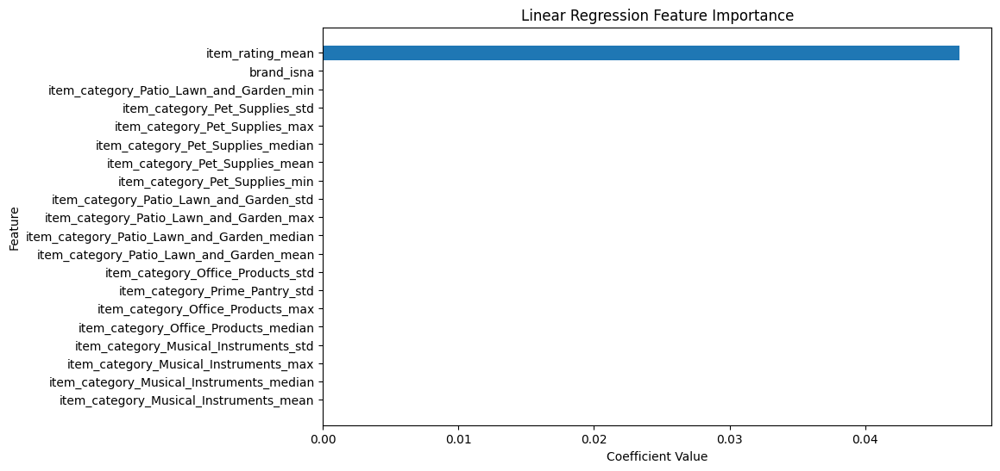

In [ ]:
pd.set_option('display.float_format', '{:.3f}'.format)
coefs = reg.coef_
features_importance = pd.DataFrame(coefs, columns=['importance'], index=features).round(3)
features_importance['importance_abs'] = features_importance['importance'].abs()
features_importance = features_importance.sort_values('importance_abs', ascending=False)

import matplotlib.pyplot as plt
display(features_importance)

plt.figure(figsize=(10, 6))
plt.barh(features_importance.head(20).index[::-1], features_importance.head(20)[::-1]['importance'])
plt.xlabel('Coefficient Value')
plt.ylabel('Feature')
plt.title('Linear Regression Feature Importance')
plt.show()

In [221]:
pred_col = f'{target}_pred_{reg.__str__()}' 
val[pred_col] = reg.predict(val.drop(columns=[col for col in val if col==target or 'pred' in col]))
val[[target]+[col for col in val.columns if 'pred' in col]]

,rating,rating_pred_baseline,rating_pred_LinearRegression(n_jobs=-1),rating_pred_Lasso(alpha=0.5)
userName,,,,
Boo,5.000,4.000,3.824,4.388
Carol Ann,4.000,4.500,4.868,4.445
KT,5.000,4.333,4.091,4.387
KT,5.000,4.333,3.992,4.382
KT,5.000,4.333,4.774,4.422
...,...,...,...,...
zensm,5.000,4.875,4.971,4.412
zephyr 2,5.000,4.333,4.029,4.410
zman,5.000,4.000,4.453,4.445


In [222]:
model_name = reg.__str__()
the_df = pd.concat([val, X_val['item_id']], axis=1) 
target_col = target
the_metrics_df = metrics 
regression_metrics = None
metrics = get_regression_metrics(the_df, target_col, pred_col, the_metrics_df, regression_metrics, model_name)
metrics

,userName,item_ids,mean_rating,mean_absolute_error,max_error,mean_absolute_percentage_error,mean_squared_error,r2_score,rating_1.0_error,rating_2.0_error,rating_3.0_error,rating_4.0_error,rating_5.0_error
baseline,13986.000,11631.000,4.419,0.711,4.000,0.291,1.109,0.068,2.855,2.099,1.202,0.437,0.495
LinearRegression(n_jobs=-1),13986.000,11631.000,4.419,950391690.866,227513059865.981,289624877.222,108655164120201953280.000,-91273155973474025472.000,1703438274.036,1437173056.146,1082852395.644,1049563741.464,841216033.194
Lasso(alpha=0.5),13986.000,11631.000,4.419,0.831,3.445,0.338,1.175,0.013,3.352,2.361,1.370,0.382,0.610


In [223]:
from sklearn.ensemble import RandomForestRegressor

regr = RandomForestRegressor(max_depth=2, random_state=0, n_jobs=-1)
regr.fit(train.drop(columns=target), train[target])
regr.score(train.drop(columns=target), train[target])

0.26636178609318306

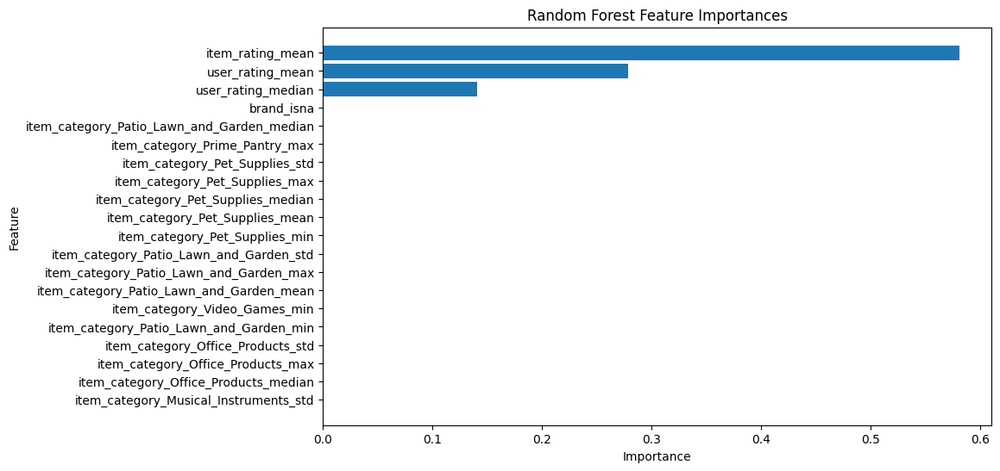

In [ ]:
import matplotlib.pyplot as plt

importances = regr.feature_importances_

feature_importances = pd.DataFrame({'Feature': features, 'Importance': importances})

feature_importances = feature_importances.sort_values(by='Importance', ascending=False)

feature_importances = feature_importances.head(20)

plt.figure(figsize=(10, 6))
plt.barh(feature_importances['Feature'], feature_importances['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Random Forest Feature Importances')
plt.gca().invert_yaxis()  # To display the highest importance at the top
plt.show()

In [225]:
pred_col = f'{target}_pred_{regr.__str__()}'
val[pred_col] = regr.predict(val.drop(columns=[col for col in val if col==target or 'pred' in col]))
val[[target]+[col for col in val.columns if 'pred' in col]]

,rating,rating_pred_baseline,rating_pred_LinearRegression(n_jobs=-1),rating_pred_Lasso(alpha=0.5),"rating_pred_RandomForestRegressor(max_depth=2, n_jobs=-1, random_state=0)"
userName,,,,,
Boo,5.000,4.000,3.824,4.388,3.948
Carol Ann,4.000,4.500,4.868,4.445,4.737
KT,5.000,4.333,4.091,4.387,4.737
KT,5.000,4.333,3.992,4.382,4.737
KT,5.000,4.333,4.774,4.422,4.737
...,...,...,...,...,...
zensm,5.000,4.875,4.971,4.412,4.737
zephyr 2,5.000,4.333,4.029,4.410,4.737
zman,5.000,4.000,4.453,4.445,3.948


In [226]:
model_name = regr.__str__()
the_df = pd.concat([val, X_val['item_id']], axis=1)
target_col = target
the_metrics_df = metrics
regression_metrics = None
metrics = get_regression_metrics(the_df, target_col, pred_col, the_metrics_df, regression_metrics, model_name)
metrics

,userName,item_ids,mean_rating,mean_absolute_error,max_error,mean_absolute_percentage_error,mean_squared_error,r2_score,rating_1.0_error,rating_2.0_error,rating_3.0_error,rating_4.0_error,rating_5.0_error
baseline,13986.000,11631.000,4.419,0.711,4.000,0.291,1.109,0.068,2.855,2.099,1.202,0.437,0.495
LinearRegression(n_jobs=-1),13986.000,11631.000,4.419,950391690.866,227513059865.981,289624877.222,108655164120201953280.000,-91273155973474025472.000,1703438274.036,1437173056.146,1082852395.644,1049563741.464,841216033.194
Lasso(alpha=0.5),13986.000,11631.000,4.419,0.831,3.445,0.338,1.175,0.013,3.352,2.361,1.370,0.382,0.610
"RandomForestRegressor(max_depth=2, n_jobs=-1, random_state=0)",13986.000,11631.000,4.419,0.738,3.737,0.303,1.140,0.042,3.032,2.092,1.160,0.515,0.511


In [230]:
print(train.shape)


(135923, 380)


In [ ]:
from sklearn.ensemble import RandomForestRegressor

regr = RandomForestRegressor(n_estimators=20, random_state=0, n_jobs=-1)

regr.fit(train.drop(columns=target), train[target])

print("Training R² Score:", regr.score(train.drop(columns=target), train[target]))


Training R² Score: 0.871774228757105


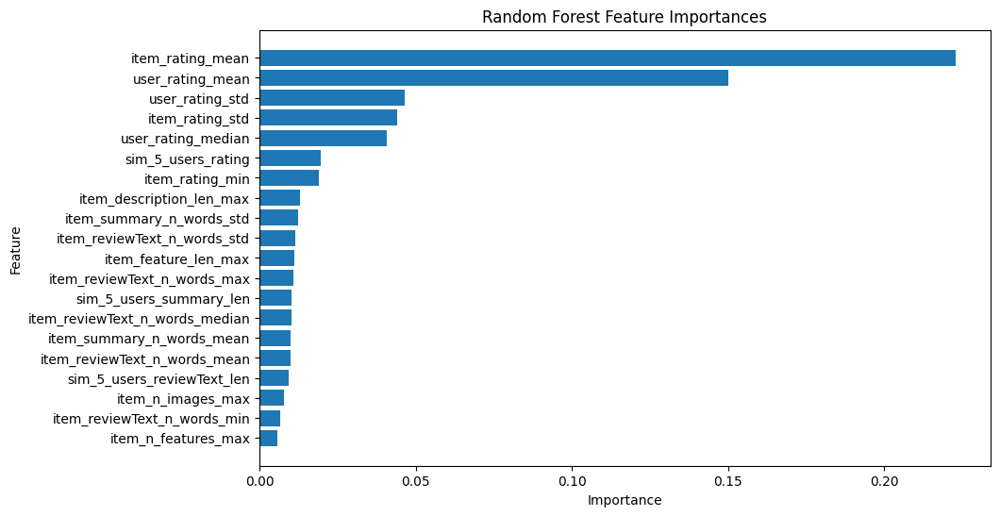

In [ ]:
import matplotlib.pyplot as plt
importances = regr.feature_importances_
feature_importances = pd.DataFrame({'Feature': features, 'Importance': importances})

feature_importances = feature_importances.sort_values(by='Importance', ascending=False)

feature_importances = feature_importances.head(20)

plt.figure(figsize=(10, 6))
plt.barh(feature_importances['Feature'], feature_importances['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Random Forest Feature Importances')
plt.gca().invert_yaxis()  
plt.show()

In [234]:
pred_col = f'{target}_pred_{regr.__str__()}'
val[pred_col] = regr.predict(val.drop(columns=[col for col in val if col==target or 'pred' in col]))
val[[target]+[col for col in val.columns if 'pred' in col]]

,rating,rating_pred_baseline,rating_pred_LinearRegression(n_jobs=-1),rating_pred_Lasso(alpha=0.5),"rating_pred_RandomForestRegressor(max_depth=2, n_jobs=-1, random_state=0)","rating_pred_RandomForestRegressor(n_estimators=20, n_jobs=-1, random_state=0)"
userName,,,,,,
Boo,5.000,4.000,3.824,4.388,3.948,3.850
Carol Ann,4.000,4.500,4.868,4.445,4.737,5.000
KT,5.000,4.333,4.091,4.387,4.737,4.300
KT,5.000,4.333,3.992,4.382,4.737,3.450
KT,5.000,4.333,4.774,4.422,4.737,4.900
...,...,...,...,...,...,...
zensm,5.000,4.875,4.971,4.412,4.737,4.950
zephyr 2,5.000,4.333,4.029,4.410,4.737,4.300
zman,5.000,4.000,4.453,4.445,3.948,4.150


In [235]:
model_name = regr.__str__()
the_df = pd.concat([val, X_val['item_id']], axis=1)
target_col = target
the_metrics_df = metrics
regression_metrics = None
metrics = get_regression_metrics(the_df, target_col, pred_col, the_metrics_df, regression_metrics, model_name)
metrics

,userName,item_ids,mean_rating,mean_absolute_error,max_error,mean_absolute_percentage_error,mean_squared_error,r2_score,rating_1.0_error,rating_2.0_error,rating_3.0_error,rating_4.0_error,rating_5.0_error
baseline,13986.000,11631.000,4.419,0.711,4.000,0.291,1.109,0.068,2.855,2.099,1.202,0.437,0.495
LinearRegression(n_jobs=-1),13986.000,11631.000,4.419,950391690.866,227513059865.981,289624877.222,108655164120201953280.000,-91273155973474025472.000,1703438274.036,1437173056.146,1082852395.644,1049563741.464,841216033.194
Lasso(alpha=0.5),13986.000,11631.000,4.419,0.831,3.445,0.338,1.175,0.013,3.352,2.361,1.370,0.382,0.610
"RandomForestRegressor(max_depth=2, n_jobs=-1, random_state=0)",13986.000,11631.000,4.419,0.738,3.737,0.303,1.140,0.042,3.032,2.092,1.160,0.515,0.511
"RandomForestRegressor(n_estimators=20, n_jobs=-1, random_state=0)",13986.000,11631.000,4.419,0.686,4.000,0.258,1.320,-0.109,2.277,1.667,1.054,0.607,0.504


In [237]:
!pip install lightgbm


Defaulting to user installation because normal site-packages is not writeable
   ---------------------------------------- 0.0/1.5 MB ? eta -:--:--
   ---------------------------------------- 0.0/1.5 MB ? eta -:--:--
   -------------- ------------------------- 0.5/1.5 MB 2.8 MB/s eta 0:00:01
   ---------------------------- ----------- 1.0/1.5 MB 2.2 MB/s eta 0:00:01
   ---------------------------------------- 1.5/1.5 MB 2.2 MB/s eta 0:00:00



[notice] A new release of pip is available: 24.3.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
import lightgbm as lgb

lgbm = lgb.LGBMRegressor()
old_columns = train.columns.copy(deep=True)
train.columns = ["".join(c if c.isalnum() else "_" for c in str(x)) for x in train.columns]

lgbm.fit(train.drop(columns=target), train[target])
lgbm.score(train.drop(columns=target), train[target])

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.068481 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 28540
[LightGBM] [Info] Number of data points in the train set: 135923, number of used features: 343
[LightGBM] [Info] Start training from score 4.393267


0.537433958263043

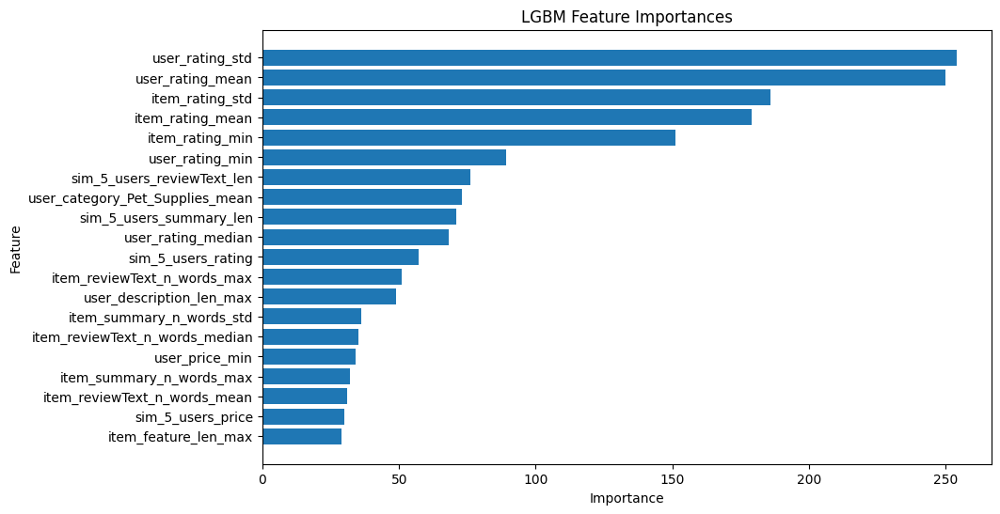

In [ ]:
import matplotlib.pyplot as plt

importances = lgbm.feature_importances_

feature_importances = pd.DataFrame({'Feature': features, 'Importance': importances})

feature_importances = feature_importances.sort_values(by='Importance', ascending=False)

feature_importances = feature_importances.head(20)

plt.figure(figsize=(10, 6))
plt.barh(feature_importances['Feature'], feature_importances['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title(f'LGBM Feature Importances')
plt.gca().invert_yaxis()  # To display the highest importance at the top
plt.show()

In [ ]:
pred_col = f'{target}_pred_{lgbm.__str__()}'
old_columns_val = val.columns.copy(deep=True)
val.columns = ["".join(c if c.isalnum() else "_" for c in str(x)) for x in val.columns]

val[pred_col] = lgbm.predict(val.drop(columns=[col for col in val if col==target or 'pred' in col]))
val[[target]+[col for col in val.columns if 'pred' in col]]

,rating,rating_pred_baseline,rating_pred_LinearRegression_n_jobs__1_,rating_pred_Lasso_alpha_0_5_,rating_pred_RandomForestRegressor_max_depth_2__n_jobs__1__random_state_0_,rating_pred_RandomForestRegressor_n_estimators_20__n_jobs__1__random_state_0_,rating_pred_LGBMRegressor()
userName,,,,,,,
Boo,5.000,4.000,3.824,4.388,3.948,3.850,3.945
Carol Ann,4.000,4.500,4.868,4.445,4.737,5.000,4.986
KT,5.000,4.333,4.091,4.387,4.737,4.300,3.794
KT,5.000,4.333,3.992,4.382,4.737,3.450,3.694
KT,5.000,4.333,4.774,4.422,4.737,4.900,4.854
...,...,...,...,...,...,...,...
zensm,5.000,4.875,4.971,4.412,4.737,4.950,4.969
zephyr 2,5.000,4.333,4.029,4.410,4.737,4.300,4.115
zman,5.000,4.000,4.453,4.445,3.948,4.150,4.708


In [241]:
model_name = regr.__str__()
the_df = pd.concat([val, X_val['item_id']], axis=1)
target_col = target
the_metrics_df = metrics
regression_metrics = None
metrics = get_regression_metrics(the_df, target_col, pred_col, the_metrics_df, regression_metrics, model_name)
metrics

,userName,item_ids,mean_rating,mean_absolute_error,max_error,mean_absolute_percentage_error,mean_squared_error,r2_score,rating_1.0_error,rating_2.0_error,rating_3.0_error,rating_4.0_error,rating_5.0_error
baseline,13986.000,11631.000,4.419,0.711,4.000,0.291,1.109,0.068,2.855,2.099,1.202,0.437,0.495
LinearRegression(n_jobs=-1),13986.000,11631.000,4.419,950391690.866,227513059865.981,289624877.222,108655164120201953280.000,-91273155973474025472.000,1703438274.036,1437173056.146,1082852395.644,1049563741.464,841216033.194
Lasso(alpha=0.5),13986.000,11631.000,4.419,0.831,3.445,0.338,1.175,0.013,3.352,2.361,1.370,0.382,0.610
"RandomForestRegressor(max_depth=2, n_jobs=-1, random_state=0)",13986.000,11631.000,4.419,0.738,3.737,0.303,1.140,0.042,3.032,2.092,1.160,0.515,0.511
"RandomForestRegressor(n_estimators=20, n_jobs=-1, random_state=0)",13986.000,11631.000,4.419,0.686,4.000,0.258,1.320,-0.109,2.277,1.667,1.054,0.607,0.504
"RandomForestRegressor(n_estimators=20, n_jobs=-1, random_state=0)",13986.000,11631.000,4.419,0.721,4.525,0.274,1.331,-0.118,2.427,1.810,1.194,0.649,0.514


In [251]:
print(train.columns)


Index(['brand_isna', 'category_Cell_Phones_and_Accessories',
       'category_Musical_Instruments', 'category_Patio_Lawn_and_Garden',
       'category_Pet_Supplies', 'category_Video_Games',
       'brand_price__5_99__8_154_', 'brand_price__8_154__9_99_',
       'brand_price__9_99__12_538_', 'brand_price__12_538__14_98_',
       ...
       'item_reviewText_n_words_is_outlier_mean',
       'item_reviewText_n_words_is_outlier_median',
       'item_reviewText_n_words_is_outlier_max',
       'item_reviewText_n_words_is_outlier_std', 'item_rating_min',
       'item_rating_mean', 'item_rating_median', 'item_rating_max',
       'item_rating_std', 'rating'],
      dtype='object', length=380)


In [ ]:
from sklearn.feature_selection import VarianceThreshold
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
import lightgbm as lgb

target = 'rating'
X = train.drop(columns=target)
y = train[target]
common_cols = list(set(X.columns).intersection(set(test.columns)))
X = X[common_cols]
test = test[common_cols]

selector = VarianceThreshold(threshold=0.01)
X_filtered = selector.fit_transform(X)

X_train, X_val, y_train, y_val = train_test_split(X_filtered, y, test_size=0.2, random_state=42)

model = lgb.LGBMRegressor(n_estimators=100, learning_rate=0.1, max_depth=5, random_state=42)
model.fit(X_train, y_train)
y_val_pred = model.predict(X_val)
print("Validation R² Score:", r2_score(y_val, y_val_pred))

X_test = test[common_cols]
X_test_filtered = selector.transform(X_test)
y_pred = model.predict(X_test_filtered)

print("✅ Test Predictions Ready")


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.101177 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 23969
[LightGBM] [Info] Number of data points in the train set: 108738, number of used features: 260
[LightGBM] [Info] Start training from score 4.392485
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

In [247]:
best_model.score(train.drop(columns=target), train[target])

0.4909410379992517

In [ ]:
import pandas as pd

submission = pd.DataFrame({
    'Id': test.index,       
    'PredictedRating': y_pred
})

submission.to_csv('submission.csv', index=False)
print("📁 submission.csv saved!")


📁 submission.csv saved!


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.127535 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 28504
[LightGBM] [Info] Number of data points in the train set: 108738, number of used features: 342
[LightGBM] [Info] Start training from score 4.392485
Selected features: 359, Importances: 359


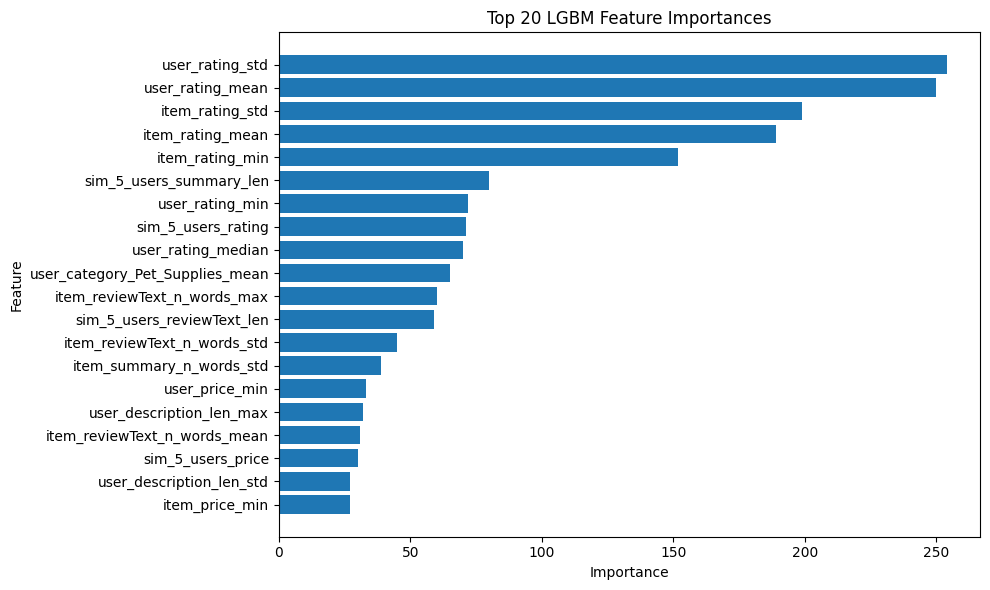

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
X = train.drop(columns=target)
y = train[target]

from sklearn.feature_selection import VarianceThreshold
selector = VarianceThreshold(threshold=0.01)
X_filtered = selector.fit_transform(X)

selected_features = X.columns[selector.get_support()].tolist()

from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X_filtered, y, test_size=0.2, random_state=42)

import lightgbm as lgb
lgbm = lgb.LGBMRegressor(random_state=42)
lgbm.fit(X_train, y_train)
importances = lgbm.feature_importances_

print(f"Selected features: {len(selected_features)}, Importances: {len(importances)}")

feature_importances = pd.DataFrame({
    'Feature': selected_features,
    'Importance': importances
})

feature_importances = feature_importances.sort_values(by='Importance', ascending=False).head(20)

plt.figure(figsize=(10, 6))
plt.barh(feature_importances['Feature'], feature_importances['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Top 20 LGBM Feature Importances')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()


In [ ]:
val_features = val.drop(columns=[col for col in val if col == target or 'pred' in col])

val_filtered = selector.transform(val_features)
pred_col = f'{target}_pred_{best_model.__str__()}'
val[pred_col] = best_model.predict(val_filtered)

val[[target] + [col for col in val.columns if 'pred' in col]]


,rating,rating_pred_baseline,rating_pred_LinearRegression_n_jobs__1_,rating_pred_Lasso_alpha_0_5_,rating_pred_RandomForestRegressor_max_depth_2__n_jobs__1__random_state_0_,rating_pred_RandomForestRegressor_n_estimators_20__n_jobs__1__random_state_0_,rating_pred_LGBMRegressor(),"rating_pred_LGBMRegressor(learning_rate=0.05, max_depth=5, n_estimators=200)"
userName,,,,,,,,
Boo,5.000,4.000,3.824,4.388,3.948,3.850,3.945,3.753
Carol Ann,4.000,4.500,4.868,4.445,4.737,5.000,4.986,4.895
KT,5.000,4.333,4.091,4.387,4.737,4.300,3.794,3.981
KT,5.000,4.333,3.992,4.382,4.737,3.450,3.694,3.942
KT,5.000,4.333,4.774,4.422,4.737,4.900,4.854,4.791
...,...,...,...,...,...,...,...,...
zensm,5.000,4.875,4.971,4.412,4.737,4.950,4.969,4.985
zephyr 2,5.000,4.333,4.029,4.410,4.737,4.300,4.115,4.118
zman,5.000,4.000,4.453,4.445,3.948,4.150,4.708,4.659


In [265]:
print(val.columns)


Index(['brand_isna', 'category_Cell_Phones_and_Accessories',
       'category_Musical_Instruments', 'category_Patio_Lawn_and_Garden',
       'category_Pet_Supplies', 'category_Video_Games',
       'brand_price__5_99__8_154_', 'brand_price__8_154__9_99_',
       'brand_price__9_99__12_538_', 'brand_price__12_538__14_98_',
       ...
       'item_rating_max', 'item_rating_std', 'rating', 'rating_pred_baseline',
       'rating_pred_LinearRegression_n_jobs__1_',
       'rating_pred_Lasso_alpha_0_5_',
       'rating_pred_RandomForestRegressor_max_depth_2__n_jobs__1__random_state_0_',
       'rating_pred_RandomForestRegressor_n_estimators_20__n_jobs__1__random_state_0_',
       'rating_pred_LGBMRegressor()',
       'rating_pred_LGBMRegressor(learning_rate=0.05, max_depth=5, n_estimators=200)'],
      dtype='object', length=387)


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000664 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 40
[LightGBM] [Info] Number of data points in the train set: 168162, number of used features: 1
[LightGBM] [Info] Start training from score 4.385592
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

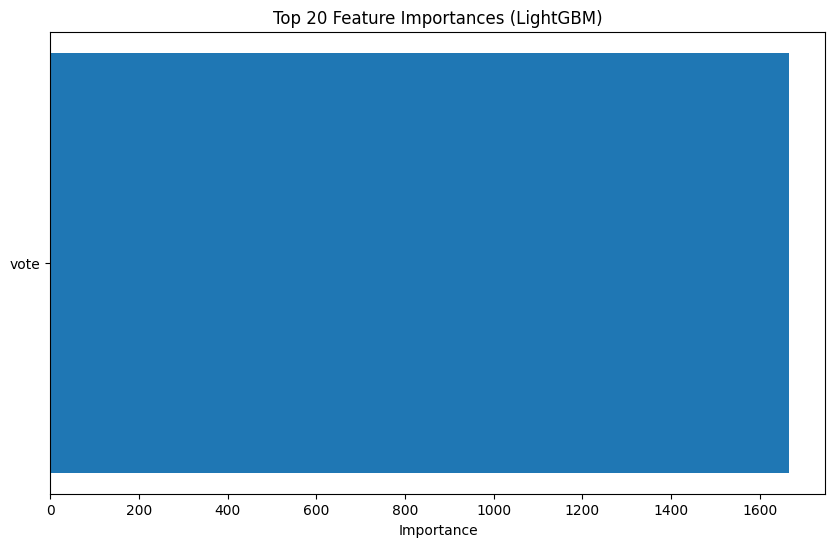

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import VarianceThreshold
import lightgbm as lgb
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt

X = df.drop(columns=['rating'])
y = df['rating']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)


numerical_cols = X_train.select_dtypes(include=['number']).columns
X_train_num = X_train[numerical_cols]
X_val_num = X_val[numerical_cols]

selector = VarianceThreshold(threshold=0.01)
X_train_selected = selector.fit_transform(X_train_num)
X_val_selected = selector.transform(X_val_num)

model = lgb.LGBMRegressor(random_state=42)
model.fit(X_train_selected, y_train)

y_val_pred = model.predict(X_val_selected)

val_results = pd.DataFrame({
    'actual_rating': y_val,
    'predicted_rating': y_val_pred
})
print(val_results.head())

score = r2_score(y_val, y_val_pred)
print(f"Validation R2 Score: {score:.4f}")

selected_features = numerical_cols[selector.get_support()]
importances = model.feature_importances_

feat_imp = pd.DataFrame({
    'Feature': selected_features,
    'Importance': importances
}).sort_values(by='Importance', ascending=False).head(20)

plt.figure(figsize=(10,6))
plt.barh(feat_imp['Feature'], feat_imp['Importance'])
plt.xlabel('Importance')
plt.title('Top 20 Feature Importances (LightGBM)')
plt.gca().invert_yaxis()
plt.show()


In [271]:
print(df.columns.tolist())


['userName', 'verified', 'itemName', 'description', 'image', 'brand', 'feature', 'category', 'price', 'rating', 'reviewTime', 'summary', 'reviewText', 'vote']


In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import LabelEncoder

target = 'rating'
if 'item_id' not in df.columns:
    df['item_id'] = np.arange(len(df))

X = df.drop(columns=[target])
y = df[target]
item_ids = df['item_id']

cat_cols = X.select_dtypes(include=['object']).columns.tolist()
for col in cat_cols:
    le = LabelEncoder()
    X[col] = le.fit_transform(X[col].astype(str)) 
X_train, X_val, y_train, y_val, id_train, id_val = train_test_split(
    X, y, item_ids, test_size=0.2, random_state=42
)

train = X_train.copy()
train[target] = y_train

val = X_val.copy()
val[target] = y_val

metrics = pd.DataFrame()

def get_regression_metrics(df, target_col, pred_col, metrics_df, regression_metrics, model_name):
    from sklearn.metrics import mean_squared_error, r2_score
    mse = mean_squared_error(df[target_col], df[pred_col])
    r2 = r2_score(df[target_col], df[pred_col])
    new_row = {'model': model_name, 'mse': mse, 'r2': r2}
    metrics_df = metrics_df.append(new_row, ignore_index=True)
    return metrics_df
max_max_depth = 31
max_depth_range = np.arange(3, max_max_depth, 3)

for max_depth in max_depth_range:
    print(f"max_depth: {max_depth}/{max_max_depth}")
    regr = RandomForestRegressor(max_depth=max_depth, random_state=0, n_jobs=-1)
    regr.fit(train.drop(columns=target), train[target])
    train_score = regr.score(train.drop(columns=target), train[target])
    print(f"Train R² Score: {train_score:.4f}")

    cols_to_drop = [col for col in val.columns if col == target or 'pred' in col]
    val_features = val.drop(columns=cols_to_drop)
    pred_col = f'{target}_pred_RF_max_depth_{max_depth}'
    val[pred_col] = regr.predict(val_features)

    the_df = pd.concat([val.reset_index(drop=True), id_val.reset_index(drop=True)], axis=1)
    model_name = regr.__str__()
    metrics = get_regression_metrics(the_df, target, pred_col, metrics, None, model_name)

print(metrics)


max_depth: 3/31
Train R² Score: 0.1913


C:\Users\saksh\AppData\Local\Temp\ipykernel_22664\3606371466.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(new_row, ignore_index=True)


max_depth: 6/31
Train R² Score: 0.3896
max_depth: 9/31


C:\Users\saksh\AppData\Local\Temp\ipykernel_22664\3606371466.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(new_row, ignore_index=True)


Train R² Score: 0.4817
max_depth: 12/31


C:\Users\saksh\AppData\Local\Temp\ipykernel_22664\3606371466.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(new_row, ignore_index=True)


Train R² Score: 0.5758
max_depth: 15/31


C:\Users\saksh\AppData\Local\Temp\ipykernel_22664\3606371466.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(new_row, ignore_index=True)


Train R² Score: 0.6767


C:\Users\saksh\AppData\Local\Temp\ipykernel_22664\3606371466.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(new_row, ignore_index=True)


max_depth: 18/31
Train R² Score: 0.7709


C:\Users\saksh\AppData\Local\Temp\ipykernel_22664\3606371466.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(new_row, ignore_index=True)


max_depth: 21/31
Train R² Score: 0.8440


C:\Users\saksh\AppData\Local\Temp\ipykernel_22664\3606371466.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(new_row, ignore_index=True)


max_depth: 24/31
Train R² Score: 0.8920


C:\Users\saksh\AppData\Local\Temp\ipykernel_22664\3606371466.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(new_row, ignore_index=True)


max_depth: 27/31
Train R² Score: 0.9189


C:\Users\saksh\AppData\Local\Temp\ipykernel_22664\3606371466.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(new_row, ignore_index=True)


max_depth: 30/31
Train R² Score: 0.9321
                                               model   mse    r2
0  RandomForestRegressor(max_depth=3, n_jobs=-1, ... 1.008 0.188
1  RandomForestRegressor(max_depth=6, n_jobs=-1, ... 0.760 0.388
2  RandomForestRegressor(max_depth=9, n_jobs=-1, ... 0.671 0.459
3  RandomForestRegressor(max_depth=12, n_jobs=-1,... 0.622 0.499
4  RandomForestRegressor(max_depth=15, n_jobs=-1,... 0.585 0.529
5  RandomForestRegressor(max_depth=18, n_jobs=-1,... 0.559 0.550
6  RandomForestRegressor(max_depth=21, n_jobs=-1,... 0.542 0.564
7  RandomForestRegressor(max_depth=24, n_jobs=-1,... 0.531 0.572
8  RandomForestRegressor(max_depth=27, n_jobs=-1,... 0.525 0.577
9  RandomForestRegressor(max_depth=30, n_jobs=-1,... 0.523 0.579


C:\Users\saksh\AppData\Local\Temp\ipykernel_22664\3606371466.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(new_row, ignore_index=True)


In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import pandas as pd

metrics = pd.DataFrame(columns=['model', 'mse', 'r2', 'mean_absolute_error'])

def get_regression_metrics(df, target_col, pred_col, metrics_df, regression_metrics, model_name):
    mse = mean_squared_error(df[target_col], df[pred_col])
    r2 = r2_score(df[target_col], df[pred_col])
    mae = mean_absolute_error(df[target_col], df[pred_col])
    
    new_row = pd.DataFrame([{
        'model': model_name,
        'mse': mse,
        'r2': r2,
        'mean_absolute_error': mae
    }])
    
    metrics_df = pd.concat([metrics_df, new_row], ignore_index=True)
    return metrics_df

for max_depth in range(3, 31, 3):
    print(f"max_depth: {max_depth}/31")
    regr = RandomForestRegressor(max_depth=max_depth, random_state=0, n_jobs=-1)
    
    regr.fit(train.drop(columns=[target]), train[target])
    train_score = regr.score(train.drop(columns=[target]), train[target])
    print(f"Train R² Score: {train_score:.4f}")
    
    pred_col = f'{target}_pred_RF_max_depth_{max_depth}'
    val[pred_col] = regr.predict(val.drop(columns=[col for col in val if col==target or 'pred' in col]))
    
    model_name = f'RandomForestRegressor(max_depth={max_depth})'
    
    metrics = get_regression_metrics(val, target, pred_col, metrics, None, model_name)

print(metrics.drop_duplicates(subset='model')[['model', 'mean_absolute_error']].sort_values(by='mean_absolute_error'))


max_depth: 3/31
Train R² Score: 0.1913
max_depth: 6/31
Train R² Score: 0.3896
max_depth: 9/31
Train R² Score: 0.4817
max_depth: 12/31
Train R² Score: 0.5758
max_depth: 15/31
Train R² Score: 0.6767
max_depth: 18/31
Train R² Score: 0.7709
max_depth: 21/31
Train R² Score: 0.8440
max_depth: 24/31
Train R² Score: 0.8920
max_depth: 27/31
Train R² Score: 0.9189
max_depth: 30/31
Train R² Score: 0.9321
                                 model  mean_absolute_error
9  RandomForestRegressor(max_depth=30)                0.399
8  RandomForestRegressor(max_depth=27)                0.401
7  RandomForestRegressor(max_depth=24)                0.406
6  RandomForestRegressor(max_depth=21)                0.413
5  RandomForestRegressor(max_depth=18)                0.424
4  RandomForestRegressor(max_depth=15)                0.438
3  RandomForestRegressor(max_depth=12)                0.457
2   RandomForestRegressor(max_depth=9)                0.482
1   RandomForestRegressor(max_depth=6)                0.527
0  

# Model Validation on test

In [283]:
print(train.columns)


Index(['userName', 'verified', 'itemName', 'description', 'image', 'brand',
       'feature', 'category', 'price', 'reviewTime', 'summary', 'reviewText',
       'vote', 'item_id', 'rating'],
      dtype='object')


In [282]:
train['rating_pred_baseline']

KeyError: 'rating_pred_baseline'

In [284]:
from sklearn.ensemble import RandomForestRegressor

regr = RandomForestRegressor(random_state=0, n_jobs=-1)
regr.fit(train.drop(columns=target), train[target])
print(regr.score(train.drop(columns=target), train[target]))

KeyboardInterrupt: 

In [ ]:

test[pred_col] = regr.predict(test.drop(columns=[col for col in test.columns if col==target or 'pred' in col]))
model_name = f'test_{regr.__str__()}'
X_test.index = test.index
the_df = pd.concat([test, X_test['item_id']], axis=1)
target_col = target
the_metrics_df = metrics
regression_metrics = None
metrics = get_regression_metrics(the_df, target_col, pred_col, the_metrics_df, regression_metrics, model_name)
metrics

,userName,item_ids,mean_rating,mean_absolute_error,max_error,mean_absolute_percentage_error,mean_squared_error,r2_score,rating_1.0_error,rating_2.0_error,rating_3.0_error,rating_4.0_error,rating_5.0_error
baseline,13986.000,11631.000,4.419,0.711,4.000,0.291,1.109,0.068,2.855,2.099,1.202,0.437,0.495
LinearRegression(n_jobs=-1),13986.000,11631.000,4.419,20900643336.316,4777253292447.682,6400062533.508,45565258704647285112832.000,-38275999105943248830464.000,40718067012.256,20282049396.576,28292776273.944,21361941157.465,18755092900.935
Lasso(alpha=0.5),13986.000,11631.000,4.419,0.831,3.445,0.338,1.175,0.013,3.352,2.361,1.370,0.382,0.610
"RandomForestRegressor(max_depth=2, n_jobs=-1, random_state=0)",13986.000,11631.000,4.419,0.738,3.737,0.303,1.140,0.042,3.032,2.092,1.160,0.515,0.511
"RandomForestRegressor(n_jobs=-1, random_state=0)",13986.000,11631.000,4.419,0.686,4.000,0.258,1.309,-0.099,2.268,1.651,1.047,0.597,0.509
"RandomForestRegressor(n_jobs=-1, random_state=0)",13986.000,11631.000,4.419,0.721,4.525,0.274,1.331,-0.118,2.427,1.810,1.194,0.649,0.514
"LGBMRegressor(learning_rate=0.05, max_depth=7, n_estimators=300)",13986.000,11631.000,4.419,0.725,4.351,0.275,1.340,-0.126,2.427,1.805,1.186,0.646,0.521
"RandomForestRegressor(max_depth=31, n_jobs=-1, random_state=0)",13986.000,11631.000,4.419,0.687,4.000,0.258,1.306,-0.097,2.270,1.654,1.054,0.600,0.508
"RandomForestRegressor(max_depth=31, n_jobs=-1, random_state=0)",13986.000,11631.000,4.419,0.687,4.000,0.258,1.306,-0.097,2.270,1.654,1.054,0.600,0.508
"RandomForestRegressor(max_depth=31, n_jobs=-1, random_state=0)",13986.000,11631.000,4.419,0.687,4.000,0.258,1.306,-0.097,2.270,1.654,1.054,0.600,0.508


In [ ]:

df = pd.concat([train, val[train.columns], test[train.columns]], axis=0)
assert df.isna().sum().sum() == 0

In [ ]:
df.shape

,brand_isna,category_Cell_Phones_and_Accessories,category_Musical_Instruments,category_Patio_Lawn_and_Garden,category_Pet_Supplies,category_Video_Games,"brand_price_(5.99, 8.154]","brand_price_(8.154, 9.99]","brand_price_(9.99, 12.538]","brand_price_(12.538, 14.98]","brand_price_(14.98, 18.19]","brand_price_(18.19, 19.95]","brand_price_(19.95, 23.99]","brand_price_(23.99, 34.872]","brand_price_(34.872, 999.0]",sim_5_users_rating,sim_5_users_description_len,sim_5_users_n_images,sim_5_users_feature_len,sim_5_users_price,sim_5_users_summary_len,sim_5_users_reviewText_len,user_price_min,user_price_mean,user_price_median,user_price_max,user_price_std,user_vote_min,user_vote_mean,user_vote_median,user_vote_max,user_vote_std,user_description_n_sentences_min,user_description_n_sentences_mean,user_description_n_sentences_median,user_description_n_sentences_max,user_description_n_sentences_std,user_description_len_min,user_description_len_mean,user_description_len_median,user_description_len_max,user_description_len_std,user_n_images_min,user_n_images_mean,user_n_images_median,user_n_images_max,user_n_images_std,user_brand_isna_min,user_brand_isna_median,user_brand_isna_max,user_brand_isna_std,user_n_features_min,user_n_features_mean,user_n_features_median,user_n_features_max,user_n_features_std,user_feature_len_min,user_feature_len_mean,user_feature_len_median,user_feature_len_max,user_feature_len_std,user_category_Cell_Phones_and_Accessories_min,user_category_Cell_Phones_and_Accessories_mean,user_category_Cell_Phones_and_Accessories_median,user_category_Cell_Phones_and_Accessories_std,user_category_Grocery_and_Gourmet_Food_min,user_category_Grocery_and_Gourmet_Food_mean,user_category_Grocery_and_Gourmet_Food_median,user_category_Grocery_and_Gourmet_Food_max,user_category_Grocery_and_Gourmet_Food_std,user_category_Musical_Instruments_min,user_category_Musical_Instruments_median,user_category_Musical_Instruments_max,user_category_Musical_Instruments_std,user_category_Office_Products_min,user_category_Office_Products_mean,user_category_Office_Products_median,user_category_Office_Products_max,user_category_Office_Products_std,user_category_Patio_Lawn_and_Garden_min,user_category_Patio_Lawn_and_Garden_mean,user_category_Patio_Lawn_and_Garden_median,user_category_Patio_Lawn_and_Garden_max,user_category_Patio_Lawn_and_Garden_std,user_category_Pet_Supplies_min,user_category_Pet_Supplies_mean,user_category_Pet_Supplies_median,user_category_Pet_Supplies_max,user_category_Pet_Supplies_std,user_category_Prime_Pantry_min,user_category_Prime_Pantry_mean,user_category_Prime_Pantry_median,user_category_Prime_Pantry_max,user_category_Prime_Pantry_std,user_category_Video_Games_min,user_category_Video_Games_mean,user_category_Video_Games_median,user_category_Video_Games_max,user_category_Video_Games_std,user_price_isna_min,user_price_isna_mean,user_price_isna_median,user_price_isna_std,"user_brand_price_(5.99, 8.154]_min","user_brand_price_(5.99, 8.154]_mean","user_brand_price_(5.99, 8.154]_median","user_brand_price_(5.99, 8.154]_std","user_brand_price_(8.154, 9.99]_min","user_brand_price_(8.154, 9.99]_mean","user_brand_price_(8.154, 9.99]_median","user_brand_price_(8.154, 9.99]_std","user_brand_price_(9.99, 12.538]_min","user_brand_price_(9.99, 12.538]_mean","user_brand_price_(9.99, 12.538]_median","user_brand_price_(9.99, 12.538]_std","user_brand_price_(12.538, 14.98]_min","user_brand_price_(12.538, 14.98]_mean","user_brand_price_(12.538, 14.98]_median","user_brand_price_(12.538, 14.98]_std","user_brand_price_(14.98, 18.19]_min","user_brand_price_(14.98, 18.19]_mean","user_brand_price_(14.98, 18.19]_median","user_brand_price_(14.98, 18.19]_std","user_brand_price_(18.19, 19.95]_min","user_brand_price_(18.19, 19.95]_mean","user_brand_price_(18.19, 19.95]_median","user_brand_price_(18.19, 19.95]_max","user_brand_price_(18.19, 19.95]_std","user_brand_price_(19.95, 23.99]_min","user_brand_price_(19.95, 23.99]_mean","user_brand_price_(19.95, 23.99]_median",

0.869372281499834


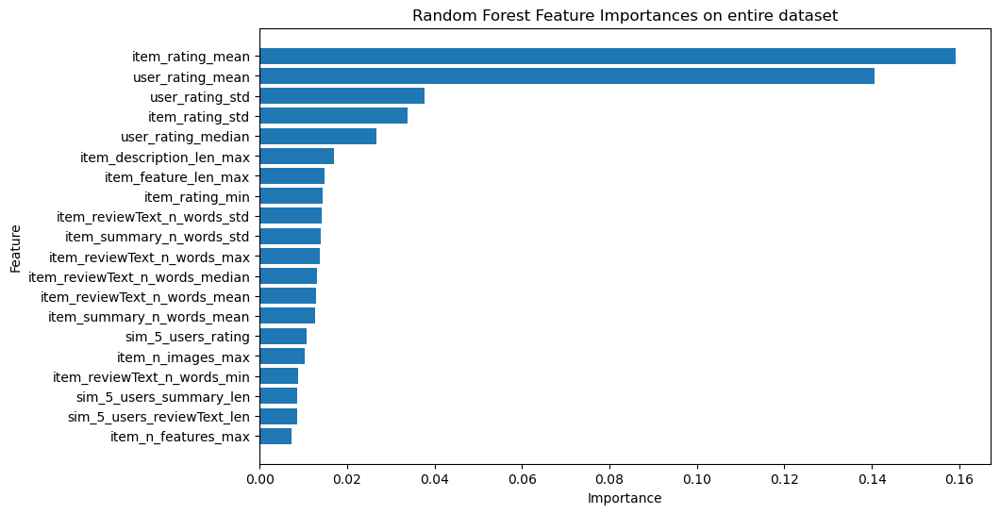

In [ ]:
from sklearn.ensemble import RandomForestRegressor

regr = RandomForestRegressor(random_state=0, n_jobs=-1)
regr.fit(df.drop(columns=target), df[target])
print(regr.score(df.drop(columns=target), df[target]))

importances = regr.feature_importances_

feature_importances = pd.DataFrame({'Feature': features, 'Importance': importances})

feature_importances = feature_importances.sort_values(by='Importance', ascending=False)

feature_importances_top = feature_importances.head(20)

plt.figure(figsize=(10, 6))
plt.barh(feature_importances_top['Feature'], feature_importances_top['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Random Forest Feature Importances on entire dataset')
plt.gca().invert_yaxis() 
plt.show()

In [ ]:
print("This is our current trained production model:")
print(regr)

filename='amazon_recommendation_RF_model.pickle'
save_model_to_pickle(regr, filename)

metrics.to_excel("models_metrics.xlsx")
print("Finished training pipeline!")


This is our current trained production model:
RandomForestRegressor(n_jobs=-1, random_state=0)
save_model_to_pickle()
Saved amazon_recommendation_RF_model.pickle succefully!
Finished training pipeline!


In [ ]:
df['item_id'] = pd.concat([X_train['item_id'], X_val['item_id'], X_test['item_id']], axis=0, ignore_index=True).values

In [ ]:
highly_rated_items = df['item_id'].value_counts(normalize=True)[df['item_id'].value_counts(normalize=True)>0.001].index.to_list()
highly_rated_items

['KIND_KIND Bars, Caramel Almond and Sea Salt, Gluten Free, 1.4 Ounce Bars, 12 Count_$13.67',
 'KIND_KIND Bars, Dark Chocolate Nuts &amp; Sea Salt, Gluten Free, 1.4 Ounce Bars, 12 Count_$13.67',
 'KIND_Kind Bars, Madagascar Vanilla Almond, Gluten Free, Low Sugar, 1.4oz_$14.79',
 'KIND_KIND Bars, Dark Chocolate Chili Almond, Gluten Free, 1.4 Ounce Bars, 12 Count_$15.53',
 "NA_NIKE Women's Flex Supreme TR 4 Cross Trainer_$54.95 - $199.95",
 'KONG_KONG Classic Dog Toy with Your Choice of Dog Treat (Combo Bundle)._NA',
 'Puppia_Puppia Dog Harnesses_$13.29',
 'Best Pet Supplies, Inc._Voyager All Weather No Pull Step-in Mesh Dog Harness Padded Vest_$12.99',
 'AmazonBasics_AmazonBasics Single Door &amp; Double Door Folding Metal Dog Crate_$27.99',
 'Puppia_Puppia Dog Harnesses_$15.95',
 'PetSafe_PetSafe Gentle Leader Head Collar with Training DVD_.a-box-inner{background-color:#fff}#alohaBuyBoxWidget .selected{background-color:#fffbf3;border-color:#e77600;box-shadow:0 0 3px rgba(228,121,17,.5)

In [ ]:
df = df.reset_index()
df

,userName,brand_isna,category_Cell_Phones_and_Accessories,category_Musical_Instruments,category_Patio_Lawn_and_Garden,category_Pet_Supplies,category_Video_Games,"brand_price_(5.99, 8.154]","brand_price_(8.154, 9.99]","brand_price_(9.99, 12.538]","brand_price_(12.538, 14.98]","brand_price_(14.98, 18.19]","brand_price_(18.19, 19.95]","brand_price_(19.95, 23.99]","brand_price_(23.99, 34.872]","brand_price_(34.872, 999.0]",sim_5_users_rating,sim_5_users_description_len,sim_5_users_n_images,sim_5_users_feature_len,sim_5_users_price,sim_5_users_summary_len,sim_5_users_reviewText_len,user_price_min,user_price_mean,user_price_median,user_price_max,user_price_std,user_vote_min,user_vote_mean,user_vote_median,user_vote_max,user_vote_std,user_description_n_sentences_min,user_description_n_sentences_mean,user_description_n_sentences_median,user_description_n_sentences_max,user_description_n_sentences_std,user_description_len_min,user_description_len_mean,user_description_len_median,user_description_len_max,user_description_len_std,user_n_images_min,user_n_images_mean,user_n_images_median,user_n_images_max,user_n_images_std,user_brand_isna_min,user_brand_isna_median,user_brand_isna_max,user_brand_isna_std,user_n_features_min,user_n_features_mean,user_n_features_median,user_n_features_max,user_n_features_std,user_feature_len_min,user_feature_len_mean,user_feature_len_median,user_feature_len_max,user_feature_len_std,user_category_Cell_Phones_and_Accessories_min,user_category_Cell_Phones_and_Accessories_mean,user_category_Cell_Phones_and_Accessories_median,user_category_Cell_Phones_and_Accessories_std,user_category_Grocery_and_Gourmet_Food_min,user_category_Grocery_and_Gourmet_Food_mean,user_category_Grocery_and_Gourmet_Food_median,user_category_Grocery_and_Gourmet_Food_max,user_category_Grocery_and_Gourmet_Food_std,user_category_Musical_Instruments_min,user_category_Musical_Instruments_median,user_category_Musical_Instruments_max,user_category_Musical_Instruments_std,user_category_Office_Products_min,user_category_Office_Products_mean,user_category_Office_Products_median,user_category_Office_Products_max,user_category_Office_Products_std,user_category_Patio_Lawn_and_Garden_min,user_category_Patio_Lawn_and_Garden_mean,user_category_Patio_Lawn_and_Garden_median,user_category_Patio_Lawn_and_Garden_max,user_category_Patio_Lawn_and_Garden_std,user_category_Pet_Supplies_min,user_category_Pet_Supplies_mean,user_category_Pet_Supplies_median,user_category_Pet_Supplies_max,user_category_Pet_Supplies_std,user_category_Prime_Pantry_min,user_category_Prime_Pantry_mean,user_category_Prime_Pantry_median,user_category_Prime_Pantry_max,user_category_Prime_Pantry_std,user_category_Video_Games_min,user_category_Video_Games_mean,user_category_Video_Games_median,user_category_Video_Games_max,user_category_Video_Games_std,user_price_isna_min,user_price_isna_mean,user_price_isna_median,user_price_isna_std,"user_brand_price_(5.99, 8.154]_min","user_brand_price_(5.99, 8.154]_mean","user_brand_price_(5.99, 8.154]_median","user_brand_price_(5.99, 8.154]_std","user_brand_price_(8.154, 9.99]_min","user_brand_price_(8.154, 9.99]_mean","user_brand_price_(8.154, 9.99]_median","user_brand_price_(8.154, 9.99]_std","user_brand_price_(9.99, 12.538]_min","user_brand_price_(9.99, 12.538]_mean","user_brand_price_(9.99, 12.538]_median","user_brand_price_(9.99, 12.538]_std","user_brand_price_(12.538, 14.98]_min","user_brand_price_(12.538, 14.98]_mean","user_brand_price_(12.538, 14.98]_median","user_brand_price_(12.538, 14.98]_std","user_brand_price_(14.98, 18.19]_min","user_brand_price_(14.98, 18.19]_mean","user_brand_price_(14.98, 18.19]_median","user_brand_price_(14.98, 18.19]_std","user_brand_price_(18.19, 19.95]_min","user_brand_price_(18.19, 19.95]_mean","user_brand_price_(18.19, 19.95]_median","user_brand_price_(18.19, 19.95]_max","user_brand_price_(18.19, 19.95]_std","user_brand_price_(19.95, 23.99]_min","user_brand_price_(19.95, 23.99]_mean","user_brand_price_(19.95, 23.99]

In [ ]:
import pandas as pd

unique_users = df['userName'].unique()

highly_rated_df = pd.DataFrame(highly_rated_items, columns=['item_id'])

users_df = pd.DataFrame(unique_users, columns=['userName'])

cartesian_product_df = users_df.assign(key=1).merge(highly_rated_df.assign(key=1), on='key').drop('key', axis=1)

new_pairs_df = cartesian_product_df[~cartesian_product_df.set_index(['userName', 'item_id']).index.isin(df.set_index(['userName', 'item_id']).index)]



In [ ]:
new_pairs_df

,userName,item_id
0,Boo,"KIND_KIND Bars, Caramel Almond and Sea Salt, G..."
1,Boo,"KIND_KIND Bars, Dark Chocolate Nuts &amp; Sea ..."
2,Boo,"KIND_Kind Bars, Madagascar Vanilla Almond, Glu..."
3,Boo,"KIND_KIND Bars, Dark Chocolate Chili Almond, G..."
4,Boo,NA_NIKE Women's Flex Supreme TR 4 Cross Traine...
...,...,...
304012,imsocrazy,"KONG_KONG Wild Knots Bear Dog Toy, Colors Vary..."
304013,imsocrazy,MidWest Homes for Pets_MidWest Homes for Pets ...
304014,imsocrazy,Taste of the Wild_Taste Of The Wild Grain Free...
304015,imsocrazy,Outward Hound_Outward Hound Hide-A-Squirrel Pu...


In [ ]:
user_cols = [col for col in df.columns if 'user' in col if 'sim' not in col]
user_cols

['userName',
 'user_price_min',
 'user_price_mean',
 'user_price_median',
 'user_price_max',
 'user_price_std',
 'user_vote_min',
 'user_vote_mean',
 'user_vote_median',
 'user_vote_max',
 'user_vote_std',
 'user_description_n_sentences_min',
 'user_description_n_sentences_mean',
 'user_description_n_sentences_median',
 'user_description_n_sentences_max',
 'user_description_n_sentences_std',
 'user_description_len_min',
 'user_description_len_mean',
 'user_description_len_median',
 'user_description_len_max',
 'user_description_len_std',
 'user_n_images_min',
 'user_n_images_mean',
 'user_n_images_median',
 'user_n_images_max',
 'user_n_images_std',
 'user_brand_isna_min',
 'user_brand_isna_median',
 'user_brand_isna_max',
 'user_brand_isna_std',
 'user_n_features_min',
 'user_n_features_mean',
 'user_n_features_median',
 'user_n_features_max',
 'user_n_features_std',
 'user_feature_len_min',
 'user_feature_len_mean',
 'user_feature_len_median',
 'user_feature_len_max',
 'user_feature_

In [ ]:
user_specific_features = df.drop_duplicates('userName')[user_cols]
user_specific_features

,userName,user_price_min,user_price_mean,user_price_median,user_price_max,user_price_std,user_vote_min,user_vote_mean,user_vote_median,user_vote_max,user_vote_std,user_description_n_sentences_min,user_description_n_sentences_mean,user_description_n_sentences_median,user_description_n_sentences_max,user_description_n_sentences_std,user_description_len_min,user_description_len_mean,user_description_len_median,user_description_len_max,user_description_len_std,user_n_images_min,user_n_images_mean,user_n_images_median,user_n_images_max,user_n_images_std,user_brand_isna_min,user_brand_isna_median,user_brand_isna_max,user_brand_isna_std,user_n_features_min,user_n_features_mean,user_n_features_median,user_n_features_max,user_n_features_std,user_feature_len_min,user_feature_len_mean,user_feature_len_median,user_feature_len_max,user_feature_len_std,user_category_Cell_Phones_and_Accessories_min,user_category_Cell_Phones_and_Accessories_mean,user_category_Cell_Phones_and_Accessories_median,user_category_Cell_Phones_and_Accessories_std,user_category_Grocery_and_Gourmet_Food_min,user_category_Grocery_and_Gourmet_Food_mean,user_category_Grocery_and_Gourmet_Food_median,user_category_Grocery_and_Gourmet_Food_max,user_category_Grocery_and_Gourmet_Food_std,user_category_Musical_Instruments_min,user_category_Musical_Instruments_median,user_category_Musical_Instruments_max,user_category_Musical_Instruments_std,user_category_Office_Products_min,user_category_Office_Products_mean,user_category_Office_Products_median,user_category_Office_Products_max,user_category_Office_Products_std,user_category_Patio_Lawn_and_Garden_min,user_category_Patio_Lawn_and_Garden_mean,user_category_Patio_Lawn_and_Garden_median,user_category_Patio_Lawn_and_Garden_max,user_category_Patio_Lawn_and_Garden_std,user_category_Pet_Supplies_min,user_category_Pet_Supplies_mean,user_category_Pet_Supplies_median,user_category_Pet_Supplies_max,user_category_Pet_Supplies_std,user_category_Prime_Pantry_min,user_category_Prime_Pantry_mean,user_category_Prime_Pantry_median,user_category_Prime_Pantry_max,user_category_Prime_Pantry_std,user_category_Video_Games_min,user_category_Video_Games_mean,user_category_Video_Games_median,user_category_Video_Games_max,user_category_Video_Games_std,user_price_isna_min,user_price_isna_mean,user_price_isna_median,user_price_isna_std,"user_brand_price_(5.99, 8.154]_min","user_brand_price_(5.99, 8.154]_mean","user_brand_price_(5.99, 8.154]_median","user_brand_price_(5.99, 8.154]_std","user_brand_price_(8.154, 9.99]_min","user_brand_price_(8.154, 9.99]_mean","user_brand_price_(8.154, 9.99]_median","user_brand_price_(8.154, 9.99]_std","user_brand_price_(9.99, 12.538]_min","user_brand_price_(9.99, 12.538]_mean","user_brand_price_(9.99, 12.538]_median","user_brand_price_(9.99, 12.538]_std","user_brand_price_(12.538, 14.98]_min","user_brand_price_(12.538, 14.98]_mean","user_brand_price_(12.538, 14.98]_median","user_brand_price_(12.538, 14.98]_std","user_brand_price_(14.98, 18.19]_min","user_brand_price_(14.98, 18.19]_mean","user_brand_price_(14.98, 18.19]_median","user_brand_price_(14.98, 18.19]_std","user_brand_price_(18.19, 19.95]_min","user_brand_price_(18.19, 19.95]_mean","user_brand_price_(18.19, 19.95]_median","user_brand_price_(18.19, 19.95]_max","user_brand_price_(18.19, 19.95]_std","user_brand_price_(19.95, 23.99]_min","user_brand_price_(19.95, 23.99]_mean","user_brand_price_(19.95, 23.99]_median","user_brand_price_(19.95, 23.99]_std","user_brand_price_(23.99, 34.872]_min","user_brand_price_(23.99, 34.872]_mean","user_brand_price_(23.99, 34.872]_median","user_brand_price_(23.99, 34.872]_std","user_brand_price_(34.872, 999.0]_min","user_brand_price_(34.872, 999.0]_mean","user_brand_price_(34.872, 999.0]_median","user_brand_price_(34.872, 999.0]_std",user_summary_isna_min,user_summary_isna_mean,user_summary_isna_median,user_summary_isna_std,user_summary_n_words_min,user_summary_n_words_mean,user_summary_n_words_median,user_summary_n_words_max,user_summar

In [ ]:
new_pairs_df = new_pairs_df.merge(user_specific_features, on=['userName'], how='left')
new_pairs_df

,userName,item_id,user_price_min,user_price_mean,user_price_median,user_price_max,user_price_std,user_vote_min,user_vote_mean,user_vote_median,user_vote_max,user_vote_std,user_description_n_sentences_min,user_description_n_sentences_mean,user_description_n_sentences_median,user_description_n_sentences_max,user_description_n_sentences_std,user_description_len_min,user_description_len_mean,user_description_len_median,user_description_len_max,user_description_len_std,user_n_images_min,user_n_images_mean,user_n_images_median,user_n_images_max,user_n_images_std,user_brand_isna_min,user_brand_isna_median,user_brand_isna_max,user_brand_isna_std,user_n_features_min,user_n_features_mean,user_n_features_median,user_n_features_max,user_n_features_std,user_feature_len_min,user_feature_len_mean,user_feature_len_median,user_feature_len_max,user_feature_len_std,user_category_Cell_Phones_and_Accessories_min,user_category_Cell_Phones_and_Accessories_mean,user_category_Cell_Phones_and_Accessories_median,user_category_Cell_Phones_and_Accessories_std,user_category_Grocery_and_Gourmet_Food_min,user_category_Grocery_and_Gourmet_Food_mean,user_category_Grocery_and_Gourmet_Food_median,user_category_Grocery_and_Gourmet_Food_max,user_category_Grocery_and_Gourmet_Food_std,user_category_Musical_Instruments_min,user_category_Musical_Instruments_median,user_category_Musical_Instruments_max,user_category_Musical_Instruments_std,user_category_Office_Products_min,user_category_Office_Products_mean,user_category_Office_Products_median,user_category_Office_Products_max,user_category_Office_Products_std,user_category_Patio_Lawn_and_Garden_min,user_category_Patio_Lawn_and_Garden_mean,user_category_Patio_Lawn_and_Garden_median,user_category_Patio_Lawn_and_Garden_max,user_category_Patio_Lawn_and_Garden_std,user_category_Pet_Supplies_min,user_category_Pet_Supplies_mean,user_category_Pet_Supplies_median,user_category_Pet_Supplies_max,user_category_Pet_Supplies_std,user_category_Prime_Pantry_min,user_category_Prime_Pantry_mean,user_category_Prime_Pantry_median,user_category_Prime_Pantry_max,user_category_Prime_Pantry_std,user_category_Video_Games_min,user_category_Video_Games_mean,user_category_Video_Games_median,user_category_Video_Games_max,user_category_Video_Games_std,user_price_isna_min,user_price_isna_mean,user_price_isna_median,user_price_isna_std,"user_brand_price_(5.99, 8.154]_min","user_brand_price_(5.99, 8.154]_mean","user_brand_price_(5.99, 8.154]_median","user_brand_price_(5.99, 8.154]_std","user_brand_price_(8.154, 9.99]_min","user_brand_price_(8.154, 9.99]_mean","user_brand_price_(8.154, 9.99]_median","user_brand_price_(8.154, 9.99]_std","user_brand_price_(9.99, 12.538]_min","user_brand_price_(9.99, 12.538]_mean","user_brand_price_(9.99, 12.538]_median","user_brand_price_(9.99, 12.538]_std","user_brand_price_(12.538, 14.98]_min","user_brand_price_(12.538, 14.98]_mean","user_brand_price_(12.538, 14.98]_median","user_brand_price_(12.538, 14.98]_std","user_brand_price_(14.98, 18.19]_min","user_brand_price_(14.98, 18.19]_mean","user_brand_price_(14.98, 18.19]_median","user_brand_price_(14.98, 18.19]_std","user_brand_price_(18.19, 19.95]_min","user_brand_price_(18.19, 19.95]_mean","user_brand_price_(18.19, 19.95]_median","user_brand_price_(18.19, 19.95]_max","user_brand_price_(18.19, 19.95]_std","user_brand_price_(19.95, 23.99]_min","user_brand_price_(19.95, 23.99]_mean","user_brand_price_(19.95, 23.99]_median","user_brand_price_(19.95, 23.99]_std","user_brand_price_(23.99, 34.872]_min","user_brand_price_(23.99, 34.872]_mean","user_brand_price_(23.99, 34.872]_median","user_brand_price_(23.99, 34.872]_std","user_brand_price_(34.872, 999.0]_min","user_brand_price_(34.872, 999.0]_mean","user_brand_price_(34.872, 999.0]_median","user_brand_price_(34.872, 999.0]_std",user_summary_isna_min,user_summary_isna_mean,user_summary_isna_median,user_summary_isna_std,user_summary_n_words_min,user_summary_n_words_mean,user_summary_n_words_median,user_summary_n_words_max,use

In [ ]:
item_cols = [col for col in df.columns if col.startswith('item') or col.startswith('brand') or col.startswith('category') if 'sim' not in col]
item_cols

['brand_isna',
 'category_Cell_Phones_and_Accessories',
 'category_Musical_Instruments',
 'category_Patio_Lawn_and_Garden',
 'category_Pet_Supplies',
 'category_Video_Games',
 'brand_price_(5.99, 8.154]',
 'brand_price_(8.154, 9.99]',
 'brand_price_(9.99, 12.538]',
 'brand_price_(12.538, 14.98]',
 'brand_price_(14.98, 18.19]',
 'brand_price_(18.19, 19.95]',
 'brand_price_(19.95, 23.99]',
 'brand_price_(23.99, 34.872]',
 'brand_price_(34.872, 999.0]',
 'item_price_min',
 'item_price_mean',
 'item_price_median',
 'item_price_max',
 'item_price_std',
 'item_vote_min',
 'item_vote_mean',
 'item_vote_median',
 'item_vote_max',
 'item_vote_std',
 'item_description_n_sentences_max',
 'item_description_n_sentences_std',
 'item_description_len_max',
 'item_description_len_std',
 'item_n_images_max',
 'item_n_images_std',
 'item_brand_isna_min',
 'item_brand_isna_mean',
 'item_brand_isna_median',
 'item_brand_isna_max',
 'item_brand_isna_std',
 'item_n_features_max',
 'item_n_features_std',
 'it

In [ ]:
item_specific_features = move_cols_to_first(df.drop_duplicates('item_id')[item_cols], ['item_id'])
item_specific_features

move_cols_to_first()


,item_id,brand_isna,category_Cell_Phones_and_Accessories,category_Musical_Instruments,category_Patio_Lawn_and_Garden,category_Pet_Supplies,category_Video_Games,"brand_price_(5.99, 8.154]","brand_price_(8.154, 9.99]","brand_price_(9.99, 12.538]","brand_price_(12.538, 14.98]","brand_price_(14.98, 18.19]","brand_price_(18.19, 19.95]","brand_price_(19.95, 23.99]","brand_price_(23.99, 34.872]","brand_price_(34.872, 999.0]",item_price_min,item_price_mean,item_price_median,item_price_max,item_price_std,item_vote_min,item_vote_mean,item_vote_median,item_vote_max,item_vote_std,item_description_n_sentences_max,item_description_n_sentences_std,item_description_len_max,item_description_len_std,item_n_images_max,item_n_images_std,item_brand_isna_min,item_brand_isna_mean,item_brand_isna_median,item_brand_isna_max,item_brand_isna_std,item_n_features_max,item_n_features_std,item_feature_len_max,item_feature_len_std,item_category_Cell_Phones_and_Accessories_min,item_category_Cell_Phones_and_Accessories_mean,item_category_Cell_Phones_and_Accessories_median,item_category_Cell_Phones_and_Accessories_max,item_category_Cell_Phones_and_Accessories_std,item_category_Grocery_and_Gourmet_Food_max,item_category_Musical_Instruments_min,item_category_Musical_Instruments_mean,item_category_Musical_Instruments_median,item_category_Musical_Instruments_max,item_category_Musical_Instruments_std,item_category_Office_Products_median,item_category_Office_Products_max,item_category_Office_Products_std,item_category_Patio_Lawn_and_Garden_min,item_category_Patio_Lawn_and_Garden_mean,item_category_Patio_Lawn_and_Garden_median,item_category_Patio_Lawn_and_Garden_max,item_category_Patio_Lawn_and_Garden_std,item_category_Pet_Supplies_min,item_category_Pet_Supplies_mean,item_category_Pet_Supplies_median,item_category_Pet_Supplies_max,item_category_Pet_Supplies_std,item_category_Prime_Pantry_max,item_category_Prime_Pantry_std,item_category_Video_Games_min,item_category_Video_Games_mean,item_category_Video_Games_median,item_category_Video_Games_max,item_category_Video_Games_std,item_price_isna_min,item_price_isna_mean,item_price_isna_median,item_price_isna_max,item_price_isna_std,"item_brand_price_(5.99, 8.154]_min","item_brand_price_(5.99, 8.154]_mean","item_brand_price_(5.99, 8.154]_median","item_brand_price_(5.99, 8.154]_max","item_brand_price_(5.99, 8.154]_std","item_brand_price_(8.154, 9.99]_min","item_brand_price_(8.154, 9.99]_mean","item_brand_price_(8.154, 9.99]_median","item_brand_price_(8.154, 9.99]_max","item_brand_price_(8.154, 9.99]_std","item_brand_price_(9.99, 12.538]_min","item_brand_price_(9.99, 12.538]_mean","item_brand_price_(9.99, 12.538]_median","item_brand_price_(9.99, 12.538]_max","item_brand_price_(9.99, 12.538]_std","item_brand_price_(12.538, 14.98]_min","item_brand_price_(12.538, 14.98]_mean","item_brand_price_(12.538, 14.98]_median","item_brand_price_(12.538, 14.98]_max","item_brand_price_(12.538, 14.98]_std","item_brand_price_(14.98, 18.19]_min","item_brand_price_(14.98, 18.19]_mean","item_brand_price_(14.98, 18.19]_median","item_brand_price_(14.98, 18.19]_max","item_brand_price_(14.98, 18.19]_std","item_brand_price_(18.19, 19.95]_min","item_brand_price_(18.19, 19.95]_mean","item_brand_price_(18.19, 19.95]_median","item_brand_price_(18.19, 19.95]_max","item_brand_price_(18.19, 19.95]_std","item_brand_price_(19.95, 23.99]_min","item_brand_price_(19.95, 23.99]_mean","item_brand_price_(19.95, 23.99]_median","item_brand_price_(19.95, 23.99]_max","item_brand_price_(19.95, 23.99]_std","item_brand_price_(23.99, 34.872]_min","item_brand_price_(23.99, 34.872]_mean","item_brand_price_(23.99, 34.872]_median","item_brand_price_(23.99, 34.872]_max","item_brand_price_(23.99, 34.872]_std","item_brand_price_(34.872, 999.0]_min","item_brand_price_(34.872, 999.0]_mean","item_brand_price_(34.872, 999.0]_median","item_brand_price_(34.872, 999.0]_max","item_brand_price_(34.872, 999.0]_std",item_summary_isna_min,item_summary_isna_mean,item_summary_isna_median,item_su

In [ ]:
new_pairs_df = new_pairs_df.merge(item_specific_features, on=['item_id'], how='left')
new_pairs_df

,userName,item_id,user_price_min,user_price_mean,user_price_median,user_price_max,user_price_std,user_vote_min,user_vote_mean,user_vote_median,user_vote_max,user_vote_std,user_description_n_sentences_min,user_description_n_sentences_mean,user_description_n_sentences_median,user_description_n_sentences_max,user_description_n_sentences_std,user_description_len_min,user_description_len_mean,user_description_len_median,user_description_len_max,user_description_len_std,user_n_images_min,user_n_images_mean,user_n_images_median,user_n_images_max,user_n_images_std,user_brand_isna_min,user_brand_isna_median,user_brand_isna_max,user_brand_isna_std,user_n_features_min,user_n_features_mean,user_n_features_median,user_n_features_max,user_n_features_std,user_feature_len_min,user_feature_len_mean,user_feature_len_median,user_feature_len_max,user_feature_len_std,user_category_Cell_Phones_and_Accessories_min,user_category_Cell_Phones_and_Accessories_mean,user_category_Cell_Phones_and_Accessories_median,user_category_Cell_Phones_and_Accessories_std,user_category_Grocery_and_Gourmet_Food_min,user_category_Grocery_and_Gourmet_Food_mean,user_category_Grocery_and_Gourmet_Food_median,user_category_Grocery_and_Gourmet_Food_max,user_category_Grocery_and_Gourmet_Food_std,user_category_Musical_Instruments_min,user_category_Musical_Instruments_median,user_category_Musical_Instruments_max,user_category_Musical_Instruments_std,user_category_Office_Products_min,user_category_Office_Products_mean,user_category_Office_Products_median,user_category_Office_Products_max,user_category_Office_Products_std,user_category_Patio_Lawn_and_Garden_min,user_category_Patio_Lawn_and_Garden_mean,user_category_Patio_Lawn_and_Garden_median,user_category_Patio_Lawn_and_Garden_max,user_category_Patio_Lawn_and_Garden_std,user_category_Pet_Supplies_min,user_category_Pet_Supplies_mean,user_category_Pet_Supplies_median,user_category_Pet_Supplies_max,user_category_Pet_Supplies_std,user_category_Prime_Pantry_min,user_category_Prime_Pantry_mean,user_category_Prime_Pantry_median,user_category_Prime_Pantry_max,user_category_Prime_Pantry_std,user_category_Video_Games_min,user_category_Video_Games_mean,user_category_Video_Games_median,user_category_Video_Games_max,user_category_Video_Games_std,user_price_isna_min,user_price_isna_mean,user_price_isna_median,user_price_isna_std,"user_brand_price_(5.99, 8.154]_min","user_brand_price_(5.99, 8.154]_mean","user_brand_price_(5.99, 8.154]_median","user_brand_price_(5.99, 8.154]_std","user_brand_price_(8.154, 9.99]_min","user_brand_price_(8.154, 9.99]_mean","user_brand_price_(8.154, 9.99]_median","user_brand_price_(8.154, 9.99]_std","user_brand_price_(9.99, 12.538]_min","user_brand_price_(9.99, 12.538]_mean","user_brand_price_(9.99, 12.538]_median","user_brand_price_(9.99, 12.538]_std","user_brand_price_(12.538, 14.98]_min","user_brand_price_(12.538, 14.98]_mean","user_brand_price_(12.538, 14.98]_median","user_brand_price_(12.538, 14.98]_std","user_brand_price_(14.98, 18.19]_min","user_brand_price_(14.98, 18.19]_mean","user_brand_price_(14.98, 18.19]_median","user_brand_price_(14.98, 18.19]_std","user_brand_price_(18.19, 19.95]_min","user_brand_price_(18.19, 19.95]_mean","user_brand_price_(18.19, 19.95]_median","user_brand_price_(18.19, 19.95]_max","user_brand_price_(18.19, 19.95]_std","user_brand_price_(19.95, 23.99]_min","user_brand_price_(19.95, 23.99]_mean","user_brand_price_(19.95, 23.99]_median","user_brand_price_(19.95, 23.99]_std","user_brand_price_(23.99, 34.872]_min","user_brand_price_(23.99, 34.872]_mean","user_brand_price_(23.99, 34.872]_median","user_brand_price_(23.99, 34.872]_std","user_brand_price_(34.872, 999.0]_min","user_brand_price_(34.872, 999.0]_mean","user_brand_price_(34.872, 999.0]_median","user_brand_price_(34.872, 999.0]_std",user_summary_isna_min,user_summary_isna_mean,user_summary_isna_median,user_summary_isna_std,user_summary_n_words_min,user_summary_n_words_mean,user_summary_n_words_median,user_summary_n_words_max,use

In [ ]:
[col for col in train.columns if col not in new_pairs_df.columns]

['sim_5_users_rating',
 'sim_5_users_description_len',
 'sim_5_users_n_images',
 'sim_5_users_feature_len',
 'sim_5_users_price',
 'sim_5_users_summary_len',
 'sim_5_users_reviewText_len',
 'rating']

In [ ]:
chunk_size = 1000
new_pairs_df = process_in_chunks(new_pairs_df, similar_users_dict, df, features, chunk_size=chunk_size)

  3%|▎         | 10/300 [03:02<1:28:40, 18.35s/it]C:\Users\dor.meir\AppData\Local\Temp\ipykernel_14656\1420688605.py:30: RuntimeWarning: invalid value encountered in double_scalars
  weighted_avg = (item_features[feature].multiply(item_features['similarity_score'], axis=0)).sum() / item_features['similarity_score'].sum()
  4%|▎         | 11/300 [03:23<1:32:42, 19.25s/it]C:\Users\dor.meir\AppData\Local\Temp\ipykernel_14656\1420688605.py:30: RuntimeWarning: invalid value encountered in double_scalars
  weighted_avg = (item_features[feature].multiply(item_features['similarity_score'], axis=0)).sum() / item_features['similarity_score'].sum()
C:\Users\dor.meir\AppData\Local\Temp\ipykernel_14656\1420688605.py:30: RuntimeWarning: invalid value encountered in double_scalars
  weighted_avg = (item_features[feature].multiply(item_features['similarity_score'], axis=0)).sum() / item_features['similarity_score'].sum()
  5%|▍         | 14/300 [04:33<1:33:03, 19.52s/it]

KeyboardInterrupt



In [ ]:
from sklearn.ensemble import RandomForestRegressor

regr = RandomForestRegressor(random_state=0, n_jobs=-1)
regr.fit(df.drop(columns=[col for col in train.columns if col not in new_pairs_df.columns] + ['userName','item_id']), df[target])

In [ ]:
print(regr.score(df.drop(columns=[col for col in train.columns if col not in new_pairs_df.columns] + ['userName','item_id']), df[target]))

0.8640898136979797


In [ ]:
df_features = df.drop(columns=[col for col in train.columns if col not in new_pairs_df.columns] + ['userName','item_id']).columns

In [ ]:
new_pairs_df[target] = regr.predict(new_pairs_df[df_features])

In [ ]:
new_pairs_df.to_csv('user_item_recommendations_ratings_and_features.csv', index=False)

In [ ]:
new_pairs_df[['userName','item_id','rating']]

,userName,item_id,rating
0,Boo,"KIND_KIND Bars, Caramel Almond and Sea Salt, G...",4.042
1,Boo,"KIND_KIND Bars, Dark Chocolate Nuts &amp; Sea ...",4.040
2,Boo,"KIND_Kind Bars, Madagascar Vanilla Almond, Glu...",4.040
3,Boo,"KIND_KIND Bars, Dark Chocolate Chili Almond, G...",4.000
4,Boo,NA_NIKE Women's Flex Supreme TR 4 Cross Traine...,4.040
...,...,...,...
300138,imsocrazy,"KONG_KONG Wild Knots Bear Dog Toy, Colors Vary...",3.300
300139,imsocrazy,MidWest Homes for Pets_MidWest Homes for Pets ...,3.620
300140,imsocrazy,Taste of the Wild_Taste Of The Wild Grain Free...,3.440
300141,imsocrazy,Outward Hound_Outward Hound Hide-A-Squirrel Pu...,3.420


In [ ]:

top_5_rated_per_user = df.groupby('userName').apply(lambda x: x.nlargest(5, 'rating')).reset_index(drop=True)[['userName','item_id','rating']]
top_5_rated_per_user

,userName,item_id,rating
0,Boo,Pedigree_Pedigree Meaty Ground Dinner Multipac...,5.000
1,Boo,Kibbles 'n Bits_Kibbles 'N Bits Original Dry D...,5.000
2,Boo,Pedigree_Pedigree Complete Nutrition Adult Dry...,4.000
3,Boo,Milk-Bone_Milk-Bone Marosnacks Dog Snacks - Sm...,4.000
4,Boo,Pedigree_Pedigree Adult Dry Dog Food - Grilled...,4.000
...,...,...,...
71284,~Susan Atherton,US Art Supply_US Art Supply 8 X 10 inch Profes...,5.000
71285,~Susan Atherton,Canson_Canson XL Series Watercolor Textured Pa...,5.000
71286,~Susan Atherton,Purina Fancy Feast_Purina Fancy Feast Classic ...,5.000
71287,~Susan Atherton,Grafix_Grafix 4-1/2-Ounce Incredible White Mas...,5.000


In [ ]:
assert top_5_rated_per_user[target].mean() > new_pairs_df[target].mean()

In [ ]:
top_5_rated_per_user.to_csv('user_item_top_5_recommendations_by_ratings.csv', index=False)

In [ ]:
most_popular_items_per_category = pd.concat([X_train[['item_id','category']], X_val[['item_id','category']], X_test[['item_id','category']]], axis=0, ignore_index=True).reset_index().groupby(['item_id','category']).size().sort_values(ascending=False).reset_index().drop_duplicates(subset=['category'], keep='first')
most_popular_items_per_category =  most_popular_items_per_category[:5].item_id.str.split('_', expand=True)
most_popular_items_per_category.columns = ['brand','itemName', 'price']
most_popular_items_per_category = move_cols_to_first(most_popular_items_per_category, ['itemName'])
most_popular_items_per_category = most_popular_items_per_category.reset_index(drop=True)
most_popular_items_per_category

move_cols_to_first()


,itemName,brand,price
0,"KIND Bars, Caramel Almond and Sea Salt, Gluten...",KIND,$13.67
1,NIKE Women's Flex Supreme TR 4 Cross Trainer,NA,$54.95 - $199.95
2,KONG Classic Dog Toy with Your Choice of Dog T...,KONG,NA
3,D'Addario EXL120+ Nickel Wound Electric Guitar...,D'Addario,$4.49
4,"Sharpie 37003 Ultra-Fine Permanent Marker, Mar...",Sharpie,$8.98


In [ ]:
most_popular_items_per_category.to_csv('most_popular_items_per_category.csv', index=False)

In [ ]:
top_5_rated_per_user = pd.read_csv('user_item_top_5_recommendations_by_ratings.csv')
most_popular_items_per_category = pd.read_csv('most_popular_items_per_category.csv')

def get_item_recommendations_for_userName(userName):
    recommended_items = top_5_rated_per_user.loc[top_5_rated_per_user['userName'] == userName, 'item_id'].str.split('_', expand=True)
    if len(recommended_items) > 0:
        recommended_items.columns = ['brand','itemName', 'price']
        recommended_items = move_cols_to_first(recommended_items, ['itemName'])
        recommended_items = recommended_items.reset_index(drop=True)
    else:
        recommended_items = most_popular_items_per_category
    
    return recommended_items

userName = 'Boo'
get_item_recommendations_for_userName(userName)

move_cols_to_first()


,itemName,brand,price
0,"Avery Shipping Address Labels, Inkjet Printers...",Avery,$24.62
1,Avery Address Labels with Sure Feed for Inkjet...,Avery,$8.23
2,Elmer's Tack'N Stik Multi-purpose 98620 Tac Pu...,Elmer's,$13.04
3,UnionBasic PU Leather Crocodile Pattern 360 De...,UnionBasic,$19.99
4,Avery Address Labels with Sure Feed for Inkjet...,Avery,$25.85
